In [ ]:
import os
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import torch
import torch.nn as nn
from tqdm.notebook import tqdm
from torchvision.utils import save_image
from torchvision.utils import make_grid
from torch.optim import lr_scheduler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set(style='darkgrid', font_scale=1.2)

In [ ]:
import numpy as np
import shutil
import pandas as pd
import skimage
import skimage.io
from skimage.transform import resize

In [ ]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

In [ ]:
device

device(type='cuda', index=0)

## Подготовка данных



В качестве обучающей выборки я возьму часть датасета [Flickr Faces](https://www.kaggle.com/imcr00z/flickr-faces-70k-thumbnails-128x128), который содержит изображения лиц людей в высоком разрешении (128х128). Оригинальный датасет содержит 70к изображений, но из-за ограничений в мощностях и чтобы ган обучался быстрее, я возьму 10к

Загружаю изображения и нормирую их

In [ ]:
def processing_images(path, im_size):
    images_paths = []
    for dirpath, dirnames, filenames in os.walk(path):
        for file in filenames:
            if len(images_paths) != 10000:
                if file.endswith(".png"):
                    fullpath = os.path.join(dirpath, file)
                    images_paths.append({'image_path': fullpath})
    
    images_paths_df = pd.DataFrame(images_paths)
    images_processed = images_paths_df['image_path'].apply(skimage.io.imread)\
    .apply(lambda img: resize(img,[im_size, im_size]))\
    .apply(lambda img: (img-0.5)/0.5)
    
    images = np.stack(images_processed.values)
    return images

In [ ]:
path = './faces_dataset'
image_size = 128

In [ ]:
images = processing_images(path, image_size)

In [ ]:
images_tensor = torch.tensor(images).float()

In [ ]:
images_tensor = images_tensor.permute(0, 3, 1, 2)

In [ ]:
images_tensor.shape

torch.Size([10000, 3, 128, 128])

Сделаю Data loader

In [ ]:
batch_size = 8
train_loader = DataLoader(images_tensor, batch_size, shuffle=True)

Сделаю функцию для того, чтобы убирать нормировку с изображений, чтобы на них можно было посмотреть

In [ ]:
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [ ]:
def no_norm(tens):
    return tens * stats[1][0] + stats[0][0]

Как выглядят изображения

In [ ]:
x1 = next(iter(train_loader))

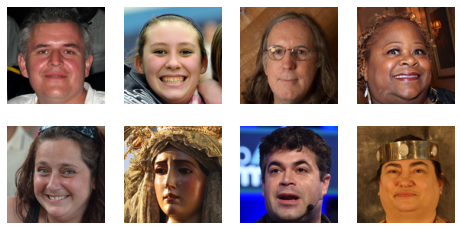

In [ ]:
plt.figure(figsize=(8, 4))
for k in range(len(x1)):
    plt.subplot(2, 4, k+1)
    plt.imshow(np.rollaxis(no_norm(x1)[k].numpy(), 0, 3), cmap='gray')
    plt.axis('off')
plt.show()

## Построение модели

Один из подходов к улучшению работы ганов - добавление шума в дискриминатор. Для этого я создаю отдельный класс Gaussian Noise

In [ ]:
class GaussianNoise(nn.Module):
    def __init__(self, std=0.1):
        super().__init__()
        self.std = std

    def forward(self, x):
        if self.training:
            return x + torch.empty_like(x).normal_(std=self.std)
        else:
            return x

In [ ]:
discriminator = nn.Sequential(
    # 3 x 128 x 128
    GaussianNoise(),
    nn.Conv2d(3, 32, kernel_size=4, stride=2, padding=1, bias=False),
    nn.LeakyReLU(0.2, inplace=True), # 32 x 64 x 64

    GaussianNoise(),
    nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True), # 64 x 32 x 32
    
    GaussianNoise(),
    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True), # 128 x 16 x 16

    GaussianNoise(),
    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True), # 256 x 8 x 8
    
    GaussianNoise(),
    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True), # 512 x 4 x 4
    
    GaussianNoise(),
    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0), # 1 x 1 x 1

    nn.Flatten(),

    nn.Sigmoid())

In [ ]:
latent_size = 128

generator = nn.Sequential(
    nn.ConvTranspose2d(in_channels=latent_size, out_channels=512, kernel_size=4, padding=0, stride=1, bias=False), # 4x4
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    
    nn.ConvTranspose2d(in_channels=512, out_channels=256, kernel_size=4, padding=1, stride=2, bias=False), # 8x8
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),

    nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=4, padding=1, stride=2, bias=False), # 16x16
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),

    nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=4, padding=1, stride=2, bias=False), # 32x32
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),

    nn.ConvTranspose2d(in_channels=64, out_channels=32, kernel_size=4, padding=1, stride=2, bias=False), # 64x64
    nn.BatchNorm2d(32),
    nn.LeakyReLU(0.2, inplace=True),
    
    nn.ConvTranspose2d(in_channels=32, out_channels=3, kernel_size=4, padding=1, stride=2, bias=False), # 128x128


    nn.Tanh()
    # 3 x 128 x 128
)

Посмотрим что выдает генератор

In [ ]:
gena = generator

In [ ]:
rand_tens = torch.randn(20, latent_size,1,1)

In [ ]:
genr = gena(rand_tens)

In [ ]:
genr.shape

torch.Size([20, 3, 128, 128])

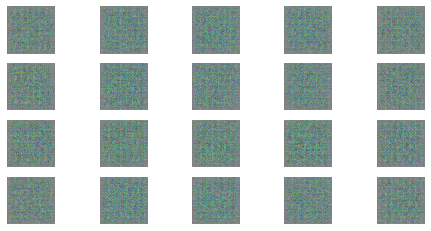

In [ ]:
plt.figure(figsize=(8, 4))
for k in range(len(genr)):
    plt.subplot(4, 5, k+1)
    plt.imshow(np.rollaxis(no_norm(genr)[k].detach().cpu().numpy(), 0, 3), cmap='gray')
    plt.axis('off')
plt.show()

## Обучение модели

In [ ]:
model = {
    "discriminator": discriminator.to(device),
    "generator": generator.to(device)
}

В качестве функции потерь возьму бинарную кросс-энтропию

In [ ]:
criterion = {
    "discriminator": nn.BCELoss(),
    "generator": nn.BCELoss()
}

In [ ]:
# Лист с эпохами, в которые буду отрисовывать сгенерированные картинки
draw = list(range(0, 1000, 10))

In [ ]:
loss_discr = []
loss_gener = []
real_score = []
fake_score = []

В обучении я использую StepLR scheduler и сглаживание лейблов

In [ ]:
def fit(model, criterion, epochs, lr_discr, lr_gener):
    
    model['discriminator'].train()
    model['generator'].train()
    
    # определяю оптимизаторы
    optimizer = {
        "discriminator": torch.optim.Adam(model["discriminator"].parameters(), 
                                          lr=lr_discr, betas=(0.5, 0.999)),
        "generator": torch.optim.Adam(model["generator"].parameters(),
                                      lr=lr_gener, betas=(0.5, 0.999))
    }
    # определяю шедулер
    scheduler = {
        "discriminator": lr_scheduler.StepLR(optimizer['discriminator'], step_size=50, gamma=0.9),
        "generator": lr_scheduler.StepLR(optimizer['generator'], step_size=50, gamma=0.9)
    }

    for e in range(epochs):
        print('* Epoch %d/%d' % (e+1, epochs))
        loss_discr_epoch = []
        loss_gener_epoch = []
        real_score_epoch = []
        fake_score_epoch = []
        
        for x_batch in train_loader:
            # обучение дискриминатора
            
            # real images
            x_batch = x_batch.to(device)
            optimizer['discriminator'].zero_grad()

            real_proba = model['discriminator'](x_batch)
            real_y = torch.empty_like(real_proba).uniform_(0.9,1.0) # label smoothing
            real_loss = criterion['discriminator'](real_proba, real_y.to(device)) 
            # вычислим скор на реальных изображениях (средняя вер-ть отнесения к классу 1 реальных изобр.)
            cur_real_score = torch.mean(real_proba).item()

            # fake images
            rand_tens_disc = torch.randn(x_batch.size(0), latent_size, 1, 1, device=device)
            fake_images_disc = model['generator'](rand_tens_disc)
            fake_proba_disc = model['discriminator'](fake_images_disc)
            fake_y_disc = torch.empty_like(fake_proba_disc).uniform_(0.0, 0.1) # label smoothing
            fake_loss = criterion['discriminator'](fake_proba_disc, fake_y_disc.to(device))
            # вычислим скор на ненастоящих изображениях (средняя вер-ть отнесения к классу 1 ненастоящих изобр.)
            cur_fake_score = torch.mean(fake_proba_disc).item()

            all_discr_loss = real_loss + fake_loss
            all_discr_loss.backward()
            optimizer['discriminator'].step()
            loss_discr_epoch.append(all_discr_loss.item())

            # обучение генератора
            optimizer['generator'].zero_grad()
            rand_tens_gen = torch.randn(x_batch.size(0), latent_size, 1, 1, device=device)
            fake_images_gen = model['generator'](rand_tens_gen)
             
            fake_proba_gen = model['discriminator'](fake_images_gen)
            fake_y_gen = torch.empty_like(fake_proba_gen).uniform_(0.9,1.0) # label smoothing
            fake_loss_gener = criterion['generator'](fake_proba_gen, fake_y_gen.to(device))

            fake_loss_gener.backward()
            optimizer['generator'].step()
            loss_gener_epoch.append(fake_loss_gener.item())
            
            real_score_epoch.append(cur_real_score)
            fake_score_epoch.append(cur_fake_score)

        # лоссы и скоры дискриминатора и генератора за эпоху
        loss_discr.append(np.mean(loss_discr_epoch))
        loss_gener.append(np.mean(loss_gener_epoch))
        real_score.append(np.mean(real_score_epoch))
        fake_score.append(np.mean(fake_score_epoch))
        
        scheduler["discriminator"].step()
        scheduler["generator"].step()
        # посмотрим какой learning rate на данный момент
        print('discr lr', scheduler["discriminator"].get_lr())
        print('gener lr', scheduler["generator"].get_lr())
        
        # посмотрим какие значения лоссов и скоров на данный момент и визуализируем
        print('discr loss=', loss_discr[-1], 'gener loss=', loss_gener[-1], 'real score=', real_score[-1], 'fake score=', fake_score[-1])
        plt.figure(figsize=(8, 4))
        plt.plot(loss_discr, '-')
        plt.plot(loss_gener, '-')
        plt.xlabel('epoch')
        plt.ylabel('loss')
        plt.legend(['Discriminator', 'Generator'])
        plt.title('Losses')
        plt.show()
        
        # каждые 10 эпох будем смотреть на сгенерированные изображения
        if e in draw:
            fixed_rand_tens = torch.randn(16, latent_size,1, 1)
            with torch.no_grad():
                fixed_generated = model['generator'](fixed_rand_tens.to(device))
                fixed_generated = no_norm(fixed_generated)
                plt.figure(figsize=(10, 5))
                for k in range(len(fixed_generated)):
                    plt.subplot(4, 4, k+1)
                    plt.imshow(np.rollaxis(fixed_generated[k].cpu().detach().numpy(), 0, 3), cmap='gray')
                    plt.axis('off')
                plt.show()

    return loss_discr, loss_gener, real_score, fake_score

* Epoch 1/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 1.1672722687959671 gener loss= 1.7694127345085144 real score= 0.6203573050737381 fake score= 0.37510559903532265


/home/thei/anaconda3/envs/pytorch/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:369: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  warnings.warn("To get the last learning rate computed by the scheduler, "


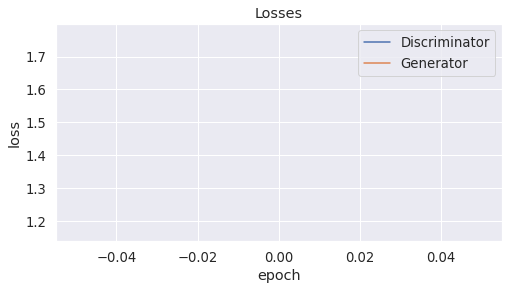

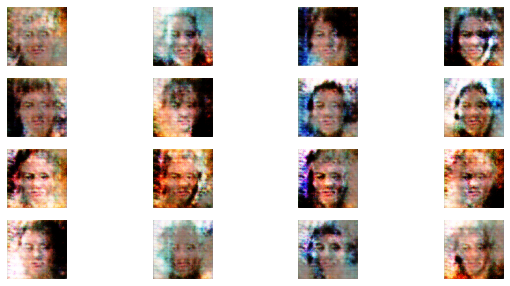

* Epoch 2/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 1.1276291314125062 gener loss= 1.5264823457479477 real score= 0.6208245804071426 fake score= 0.3743151929974556


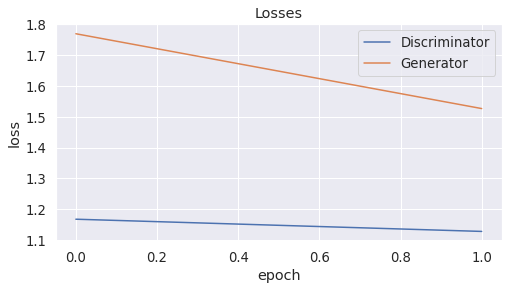

* Epoch 3/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 1.0741328158855439 gener loss= 1.6122832792282105 real score= 0.6462277275562286 fake score= 0.3514247046709061


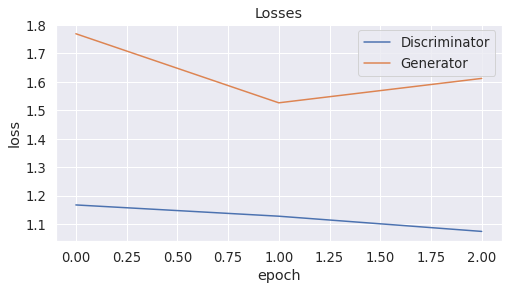

* Epoch 4/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 1.0802838255882263 gener loss= 1.539952783036232 real score= 0.6474108195662498 fake score= 0.35130114225149156


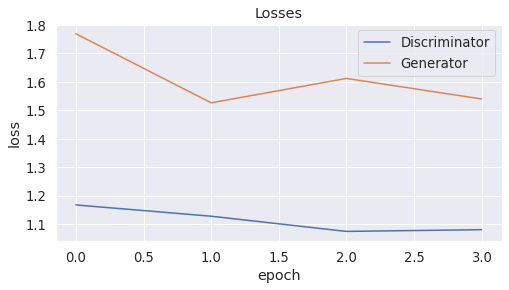

* Epoch 5/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 1.0936981296539308 gener loss= 1.4471792474031449 real score= 0.6461386929273605 fake score= 0.35318375643491745


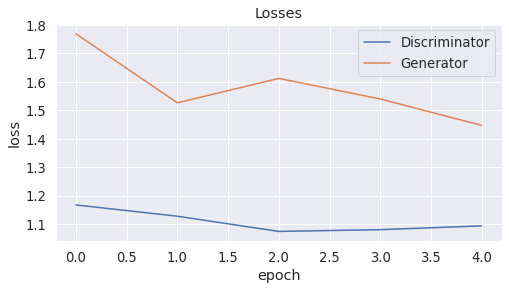

* Epoch 6/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 1.0869506870031356 gener loss= 1.4043419431567192 real score= 0.6475850489854813 fake score= 0.35149808174967767


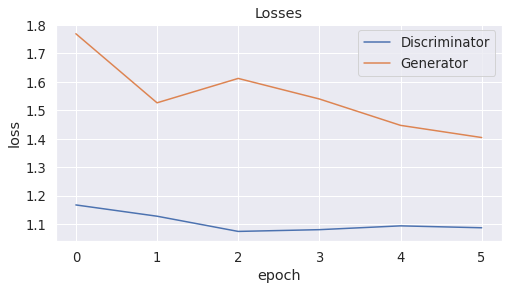

* Epoch 7/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 1.0767563167095184 gener loss= 1.3956463077545167 real score= 0.6505888981819152 fake score= 0.3479450090944767


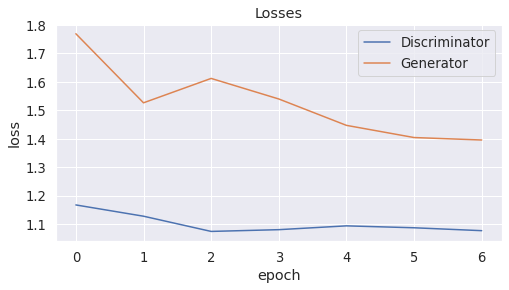

* Epoch 8/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 1.0525756865501403 gener loss= 1.4622096799612045 real score= 0.662942950630188 fake score= 0.33711120306253434


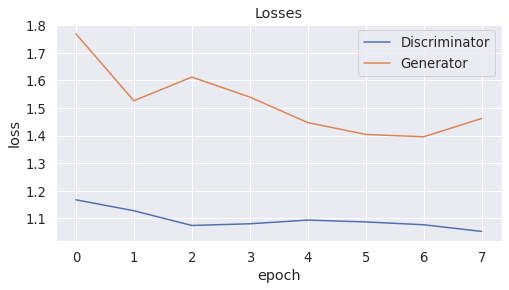

* Epoch 9/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 1.0271429722070693 gener loss= 1.480031109571457 real score= 0.6702090243935585 fake score= 0.32844595434069634


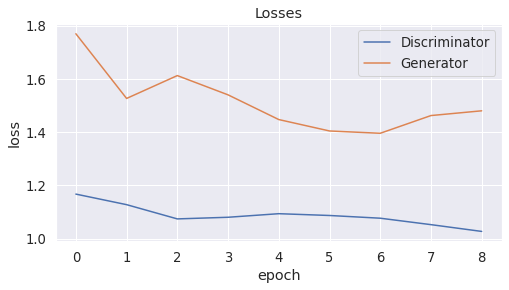

* Epoch 10/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.9974599698543548 gener loss= 1.4864833560943604 real score= 0.6838410828590393 fake score= 0.31592404649555683


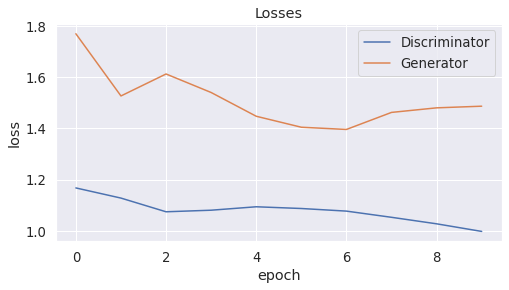

* Epoch 11/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.9874485440015793 gener loss= 1.5573985270261765 real score= 0.6875659233093262 fake score= 0.3106373380213976


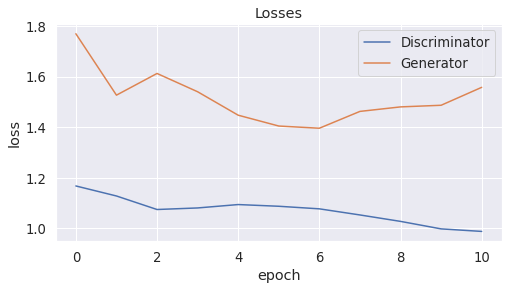

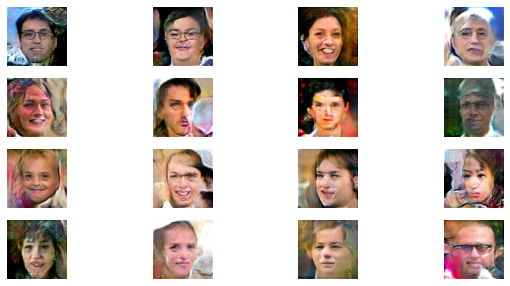

* Epoch 12/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.961294470667839 gener loss= 1.6024201875925064 real score= 0.6988901241183281 fake score= 0.299978226017952


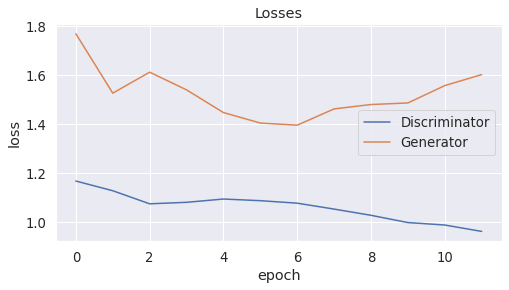

* Epoch 13/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.947525001168251 gener loss= 1.6021591832637787 real score= 0.7023898252725601 fake score= 0.29687850612998007


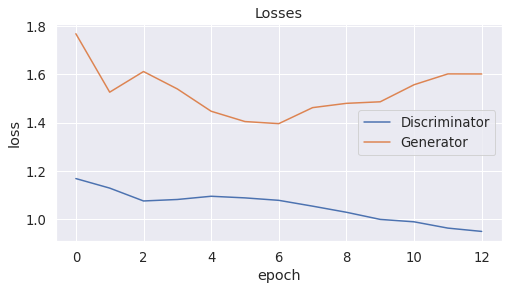

* Epoch 14/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.9085405792951584 gener loss= 1.657630176448822 real score= 0.7161725122332573 fake score= 0.283395914670825


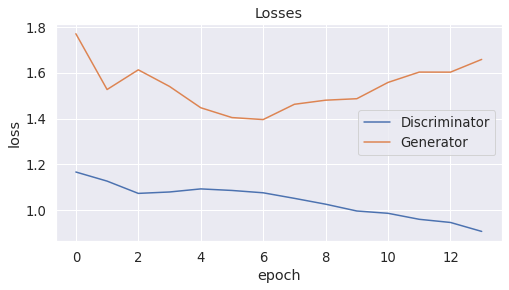

* Epoch 15/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.8802511844396591 gener loss= 1.7231993827581407 real score= 0.7292403690934182 fake score= 0.2699968522816896


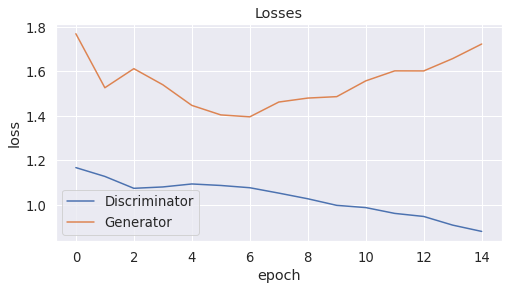

* Epoch 16/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.8681049722194671 gener loss= 1.7619179520130157 real score= 0.7362652870535851 fake score= 0.26172433603405953


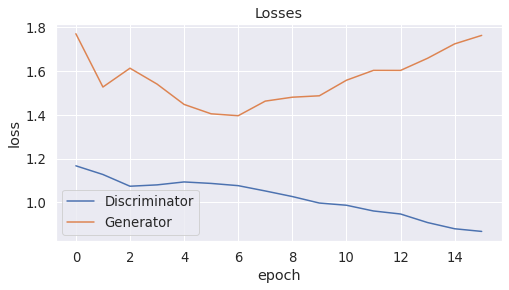

* Epoch 17/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.8436838327407837 gener loss= 1.8007755345344543 real score= 0.7468479460716247 fake score= 0.25390702326744796


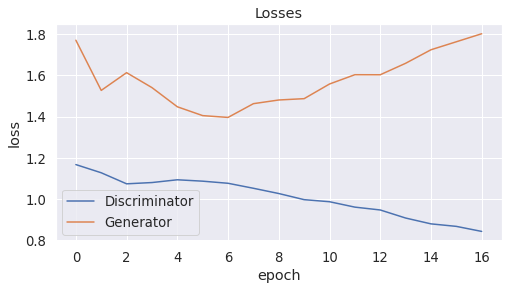

* Epoch 18/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.819573169875145 gener loss= 1.8650347655057906 real score= 0.7560831740021705 fake score= 0.24359265352487564


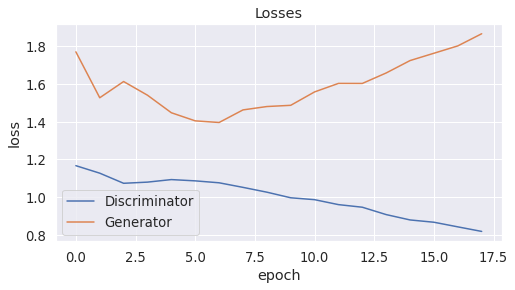

* Epoch 19/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.8082618973731994 gener loss= 1.903887634420395 real score= 0.7614652805328369 fake score= 0.23829018633663654


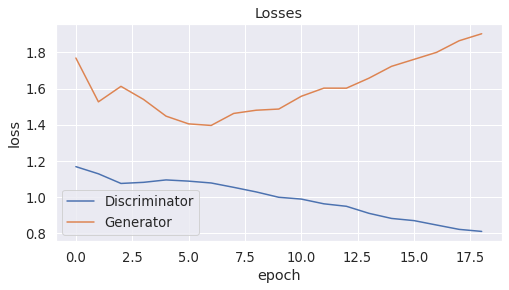

* Epoch 20/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.7999661181926727 gener loss= 1.9428807674646378 real score= 0.7675726171970367 fake score= 0.2311805648870766


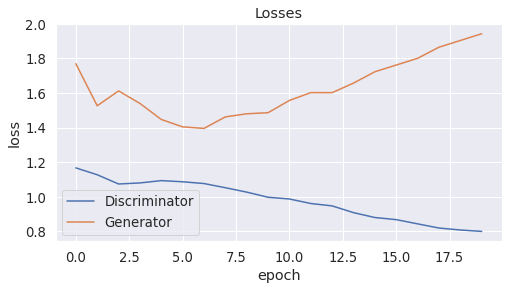

* Epoch 21/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.7877947836875916 gener loss= 1.9807017719507218 real score= 0.7729364113688469 fake score= 0.22618822974711655


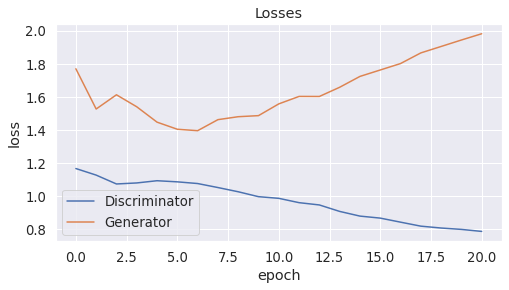

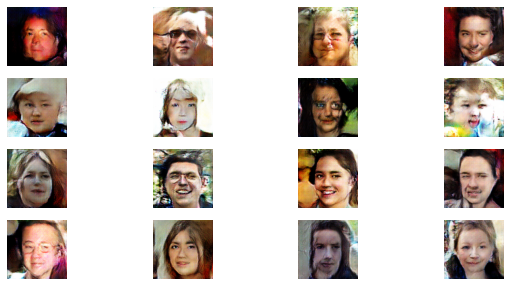

* Epoch 22/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.7695763603210449 gener loss= 2.025096303701401 real score= 0.7807854808807373 fake score= 0.2186903354085982


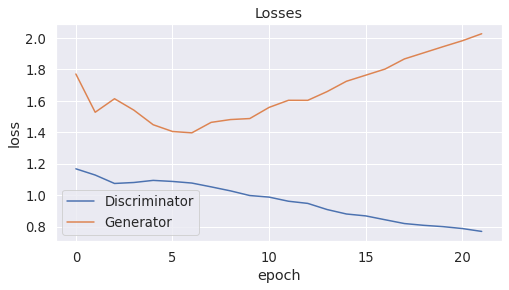

* Epoch 23/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.7571208263158798 gener loss= 2.0550187597990037 real score= 0.7871240536093712 fake score= 0.21267127297222616


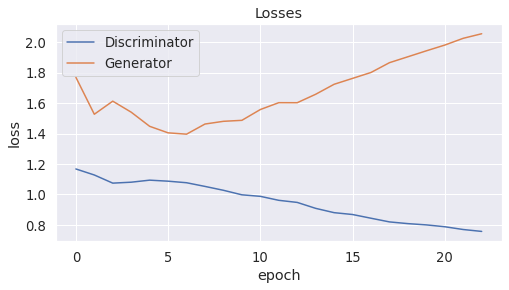

* Epoch 24/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.7496480768918992 gener loss= 2.083891304111481 real score= 0.79110313205719 fake score= 0.2087211161032319


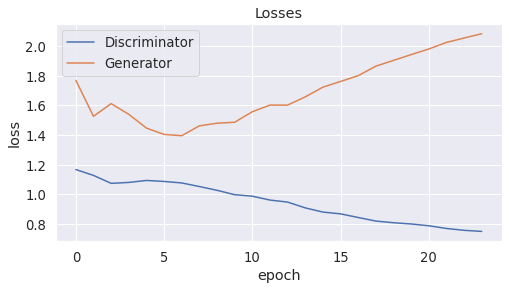

* Epoch 25/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.7422498185396195 gener loss= 2.1335296660900114 real score= 0.7934643312215806 fake score= 0.2057013619631529


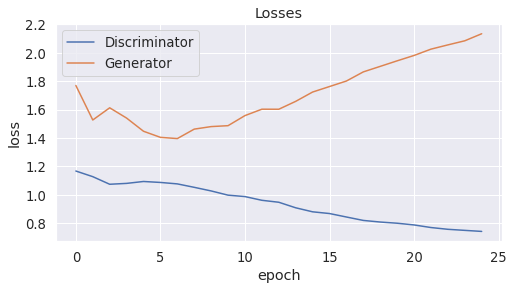

* Epoch 26/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.7201757014989852 gener loss= 2.18095060069561 real score= 0.8020052037239075 fake score= 0.19721800860613584


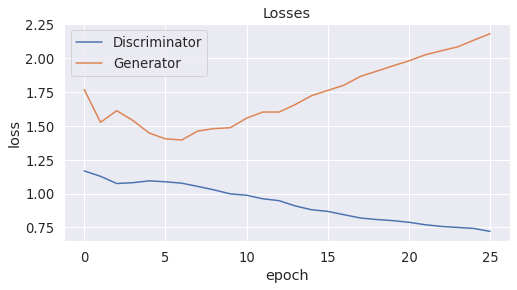

* Epoch 27/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.714295651268959 gener loss= 2.2005961163043977 real score= 0.8073715499401093 fake score= 0.19214776303246617


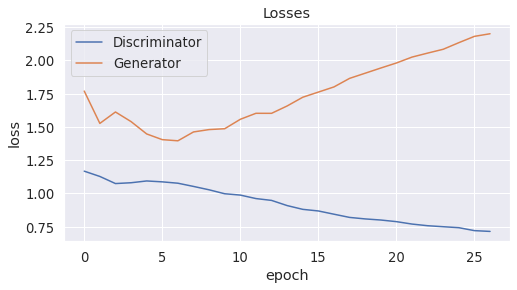

* Epoch 28/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.6997056634426116 gener loss= 2.2005489722967146 real score= 0.8125816519618034 fake score= 0.18729684649370612


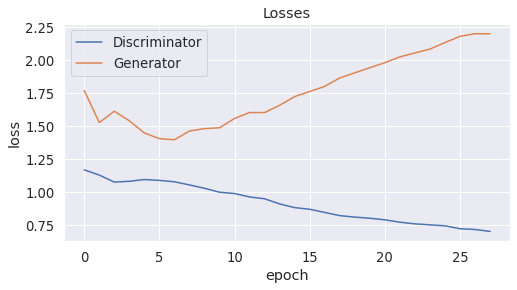

* Epoch 29/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.7053803578853607 gener loss= 2.259207803440094 real score= 0.8148371665477753 fake score= 0.18424154058620335


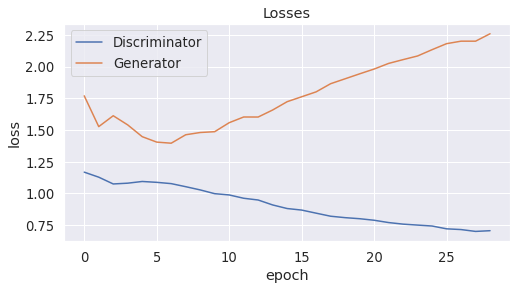

* Epoch 30/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.6961415429592133 gener loss= 2.240748511457443 real score= 0.81733100502491 fake score= 0.18313731093779206


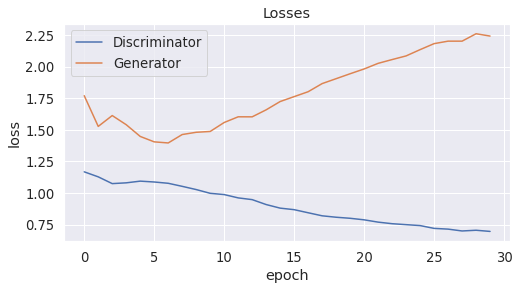

* Epoch 31/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.6864746970415115 gener loss= 2.291195797896385 real score= 0.8205679344415665 fake score= 0.17798424756117165


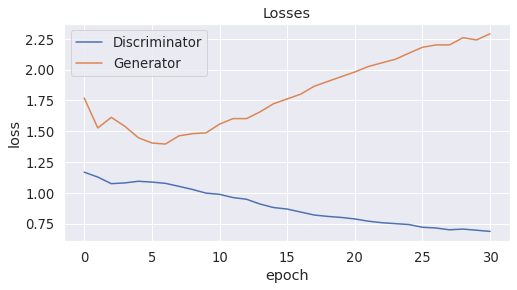

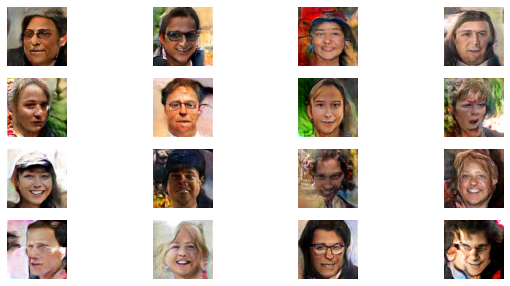

* Epoch 32/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.679421066236496 gener loss= 2.25526245803833 real score= 0.8250187539339066 fake score= 0.1742767285078764


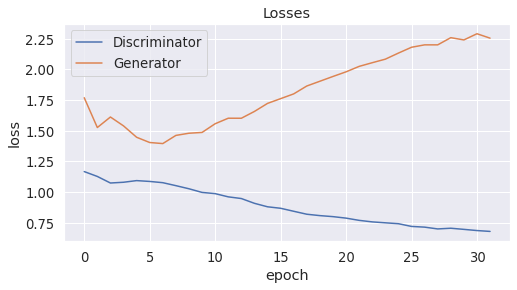

* Epoch 33/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.6725939306735993 gener loss= 2.3231643921375276 real score= 0.8280471291542053 fake score= 0.17249174977838994


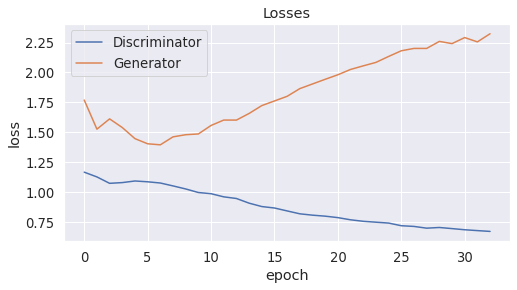

* Epoch 34/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.6726498058080673 gener loss= 2.3156891844272613 real score= 0.82645096514225 fake score= 0.17300231590345502


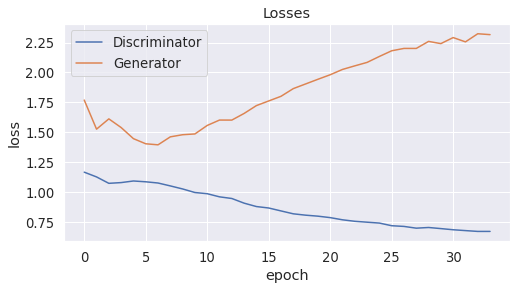

* Epoch 35/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.6609930287837982 gener loss= 2.3818190371990204 real score= 0.8324920912265777 fake score= 0.16728773999512195


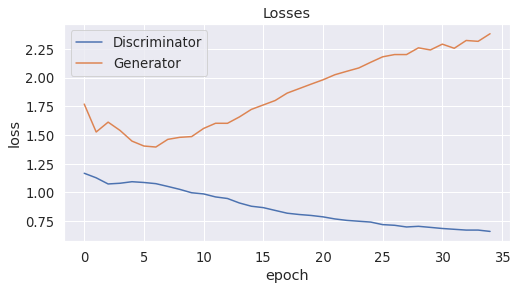

* Epoch 36/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.6510987973928452 gener loss= 2.395454250383377 real score= 0.8364738085865975 fake score= 0.16327044257596135


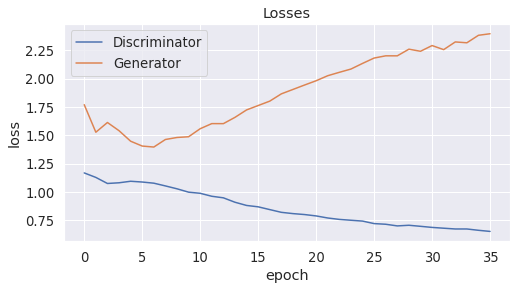

* Epoch 37/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.6529448207139968 gener loss= 2.407152901983261 real score= 0.8375486445188522 fake score= 0.16215682767257095


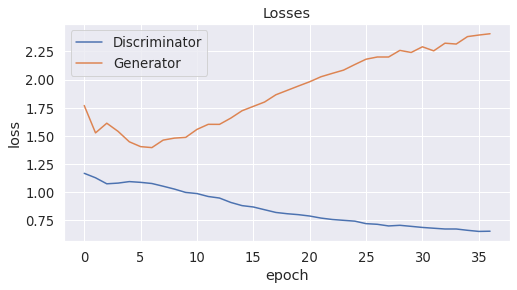

* Epoch 38/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.6453169918775559 gener loss= 2.4469562237262727 real score= 0.8410177208662033 fake score= 0.15772329009920358


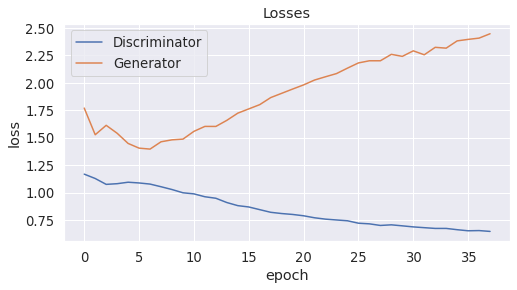

* Epoch 39/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.6384963773488999 gener loss= 2.5016849925518034 real score= 0.8446393743753433 fake score= 0.1553959434837103


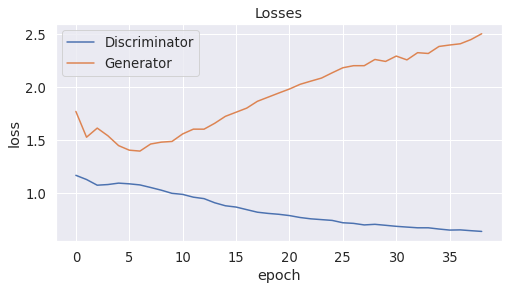

* Epoch 40/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.6380993100881577 gener loss= 2.432682412981987 real score= 0.8452016644835472 fake score= 0.1542650589056313


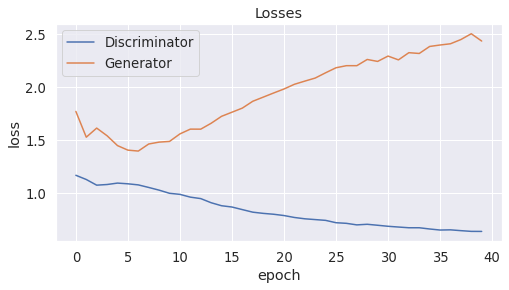

* Epoch 41/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.6316332491159439 gener loss= 2.4660084146022796 real score= 0.8478879785776138 fake score= 0.1519234510950744


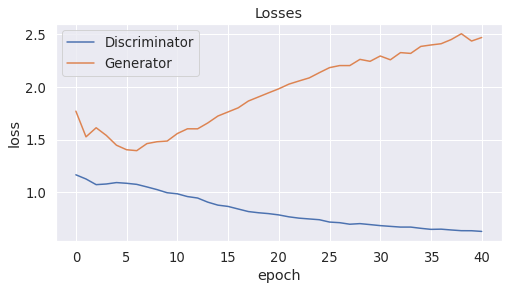

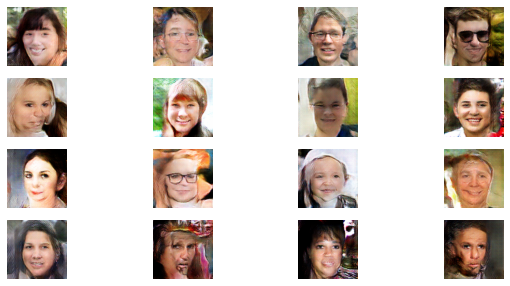

* Epoch 42/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.6221313987970352 gener loss= 2.517294526052475 real score= 0.8511790515422821 fake score= 0.14897618917822839


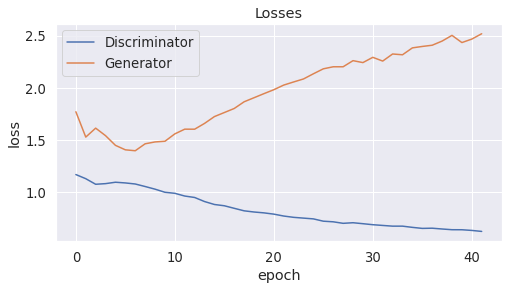

* Epoch 43/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.6310551105499268 gener loss= 2.544317552614212 real score= 0.8502558439612389 fake score= 0.14968097915947437


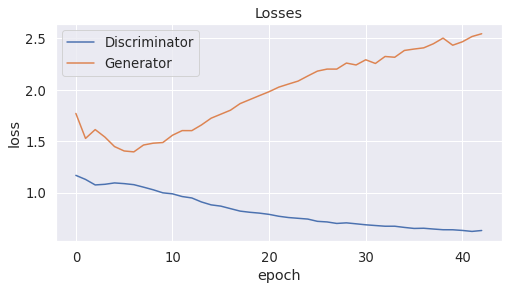

* Epoch 44/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.6125439636468887 gener loss= 2.519923056459427 real score= 0.8545749457359314 fake score= 0.1453944683328271


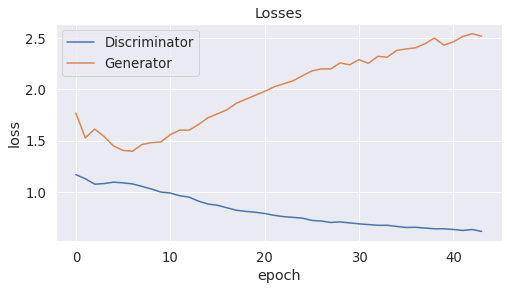

* Epoch 45/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.611856310248375 gener loss= 2.5505394842863085 real score= 0.8583887979030609 fake score= 0.14199235774502159


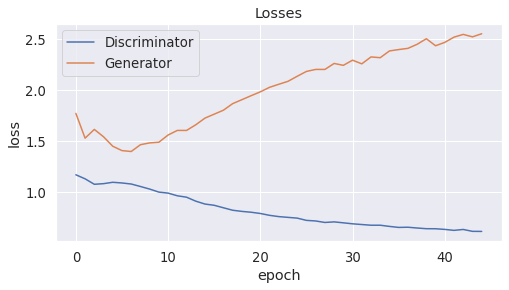

* Epoch 46/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.6086985899925232 gener loss= 2.5425397197961805 real score= 0.8579107641935348 fake score= 0.14071504611074925


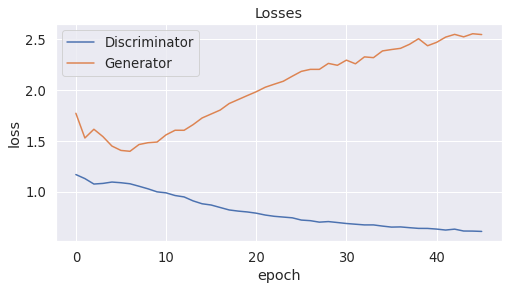

* Epoch 47/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.6128567821979523 gener loss= 2.6002520056724547 real score= 0.8563631255626678 fake score= 0.1429952853385359


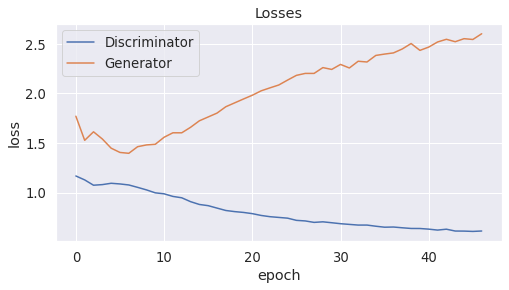

* Epoch 48/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.6054006249666214 gener loss= 2.555997664499283 real score= 0.8615244013309479 fake score= 0.13862392308786511


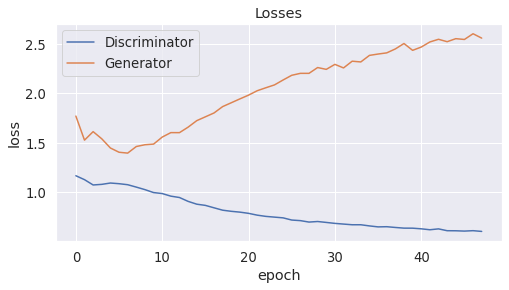

* Epoch 49/350
discr lr [0.0001]
gener lr [0.0002]
discr loss= 0.5903001555204391 gener loss= 2.592973281931877 real score= 0.8667208679199219 fake score= 0.1332974855862558


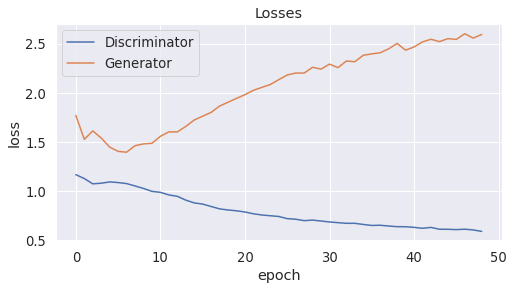

* Epoch 50/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.6005693156003952 gener loss= 2.6175530027389526 real score= 0.8637132400274277 fake score= 0.1359442134000361


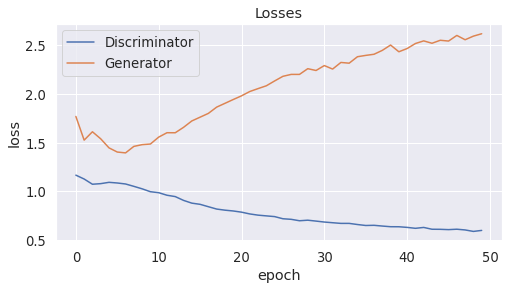

* Epoch 51/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.572786583995819 gener loss= 2.583155199813843 real score= 0.8733744532585144 fake score= 0.1261393888682127


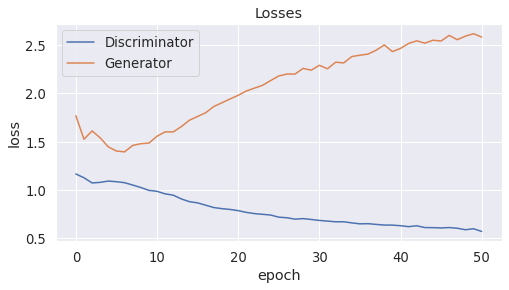

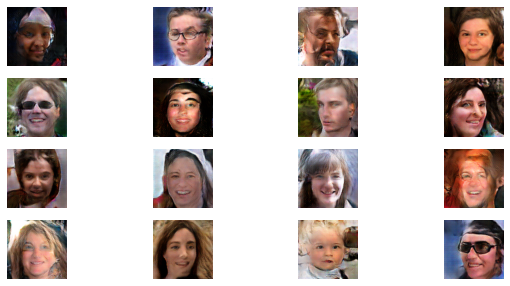

* Epoch 52/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5706218268394471 gener loss= 2.6534794509410857 real score= 0.8732725666999817 fake score= 0.12591674090325833


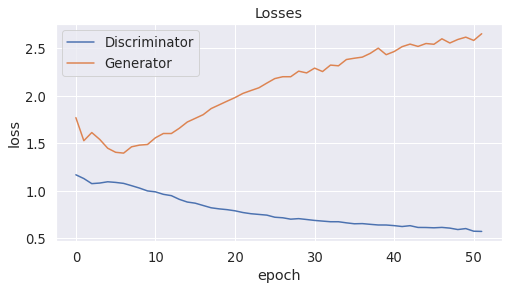

* Epoch 53/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5836675718784332 gener loss= 2.688710941839218 real score= 0.8704320478796959 fake score= 0.12913143629357218


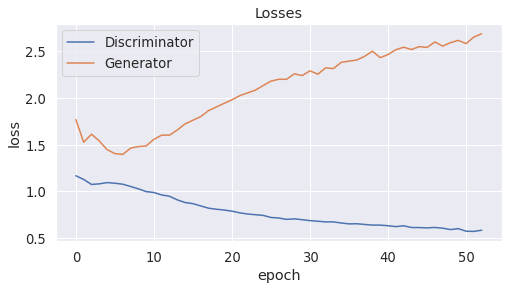

* Epoch 54/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5665105202674866 gener loss= 2.6689167720794678 real score= 0.8767204602956772 fake score= 0.12294780863206833


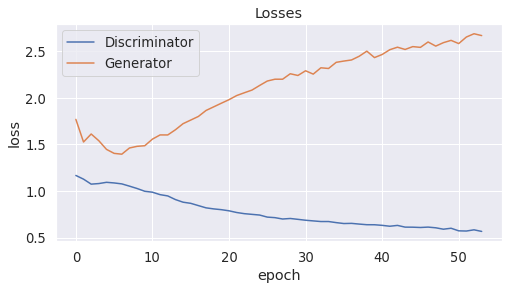

* Epoch 55/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5692621143102646 gener loss= 2.6653738253116606 real score= 0.875981214427948 fake score= 0.12388943811431527


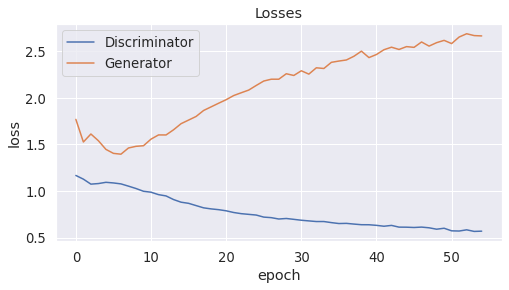

* Epoch 56/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5639529330968857 gener loss= 2.7007258262634277 real score= 0.879576077246666 fake score= 0.1200173434060067


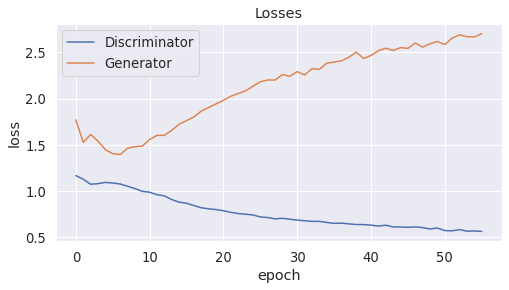

* Epoch 57/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5681785625219345 gener loss= 2.65102759642601 real score= 0.8761562920093536 fake score= 0.12341716375015677


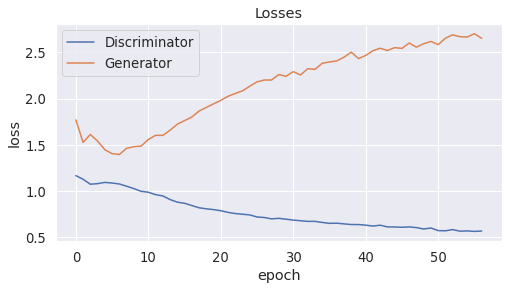

* Epoch 58/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5595869798898697 gener loss= 2.6987057296276094 real score= 0.8810145173549652 fake score= 0.11837287444099784


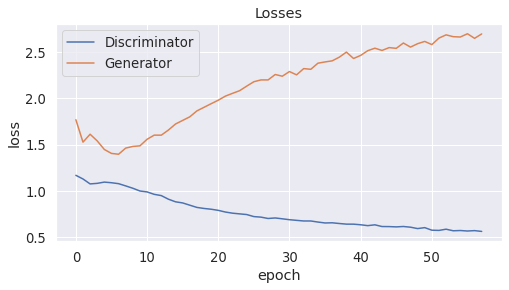

* Epoch 59/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5598015918493271 gener loss= 2.7375232813358306 real score= 0.8821672559261322 fake score= 0.11757843614555895


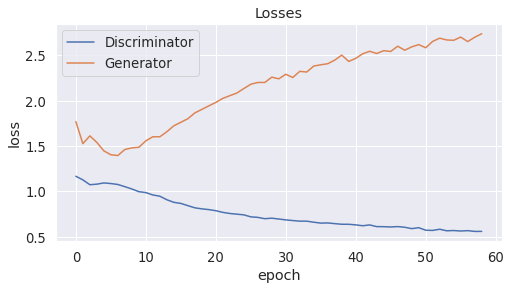

* Epoch 60/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5519812114477157 gener loss= 2.752291471004486 real score= 0.8840385257720947 fake score= 0.11622767009809613


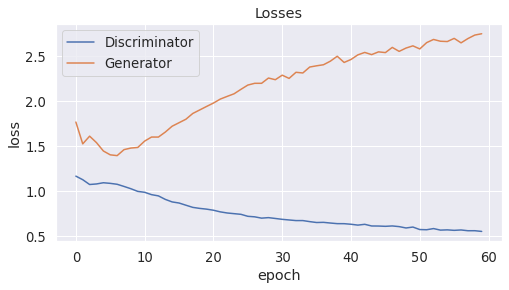

* Epoch 61/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5497061934232712 gener loss= 2.76708741235733 real score= 0.8864800377607346 fake score= 0.11400522984862328


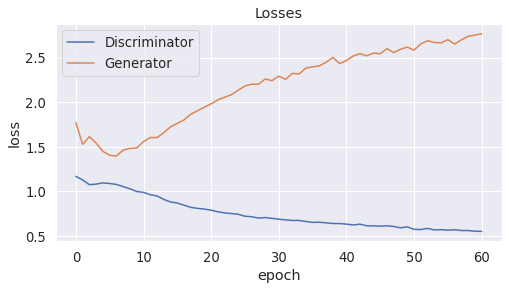

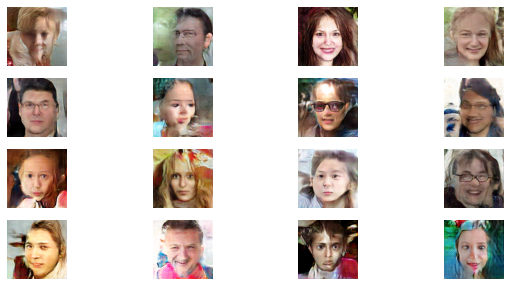

* Epoch 62/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5550735463380814 gener loss= 2.786039466047287 real score= 0.8857498356819152 fake score= 0.11385943376496434


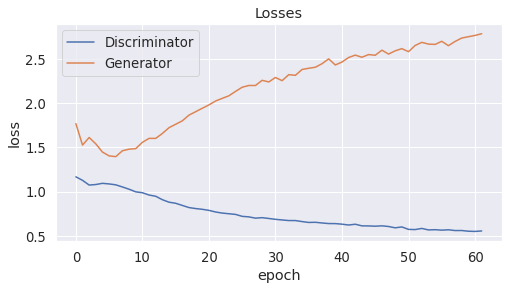

* Epoch 63/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5506880788564682 gener loss= 2.712882713842392 real score= 0.885629877448082 fake score= 0.11393057536408305


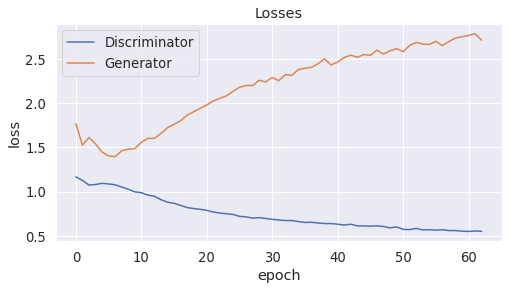

* Epoch 64/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5509886933326721 gener loss= 2.777843375873566 real score= 0.8873583747386933 fake score= 0.11328352751471102


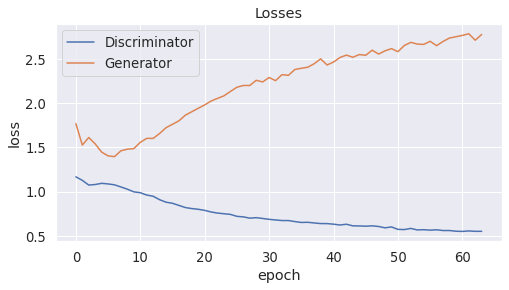

* Epoch 65/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.54637916867733 gener loss= 2.795177521753311 real score= 0.8874496613979339 fake score= 0.11165263936594129


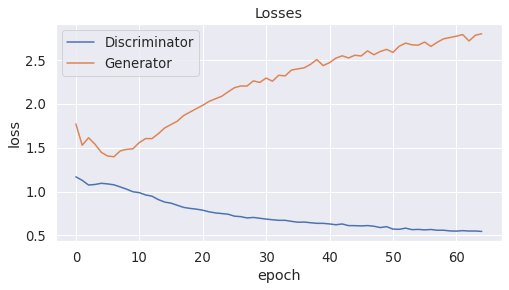

* Epoch 66/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5381358355283737 gener loss= 2.7311422864437103 real score= 0.8917655738353729 fake score= 0.10827169095352292


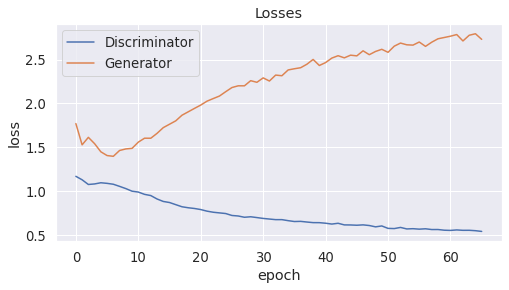

* Epoch 67/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5435911101102829 gener loss= 2.776177707910538 real score= 0.8890393748521804 fake score= 0.11042781740017235


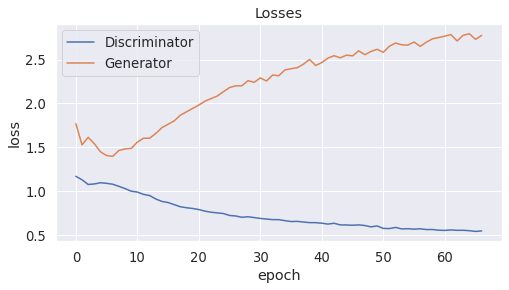

* Epoch 68/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5413472567081451 gener loss= 2.792648647022247 real score= 0.8903687408208847 fake score= 0.10979233898185194


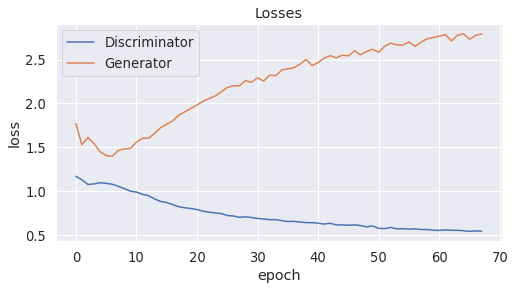

* Epoch 69/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5362829631090165 gener loss= 2.7857233502388 real score= 0.8954848958492279 fake score= 0.10520219036564231


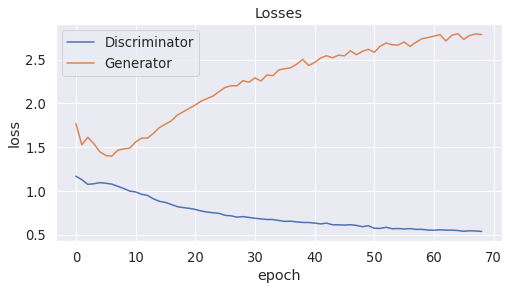

* Epoch 70/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5361728806495667 gener loss= 2.8224278054714205 real score= 0.8934797508001328 fake score= 0.10643528467603028


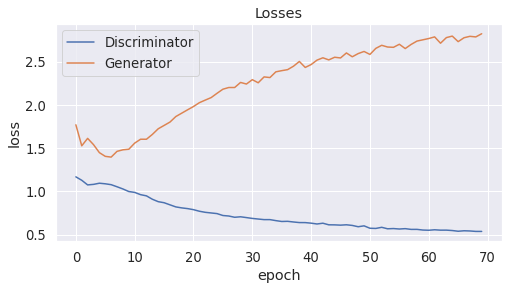

* Epoch 71/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5334219224452973 gener loss= 2.8077280985832216 real score= 0.8954790666818618 fake score= 0.10485420169010759


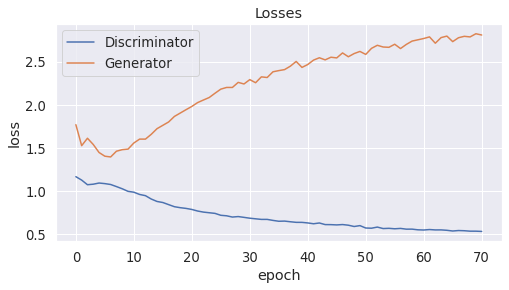

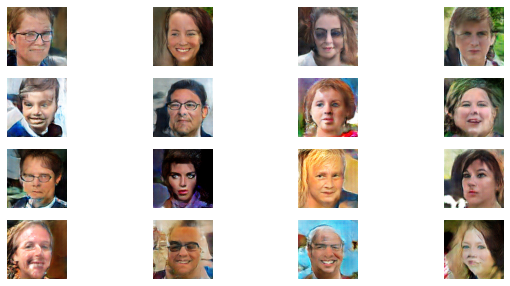

* Epoch 72/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5335970752716065 gener loss= 2.8020463957309723 real score= 0.8957062422037124 fake score= 0.10458816680461168


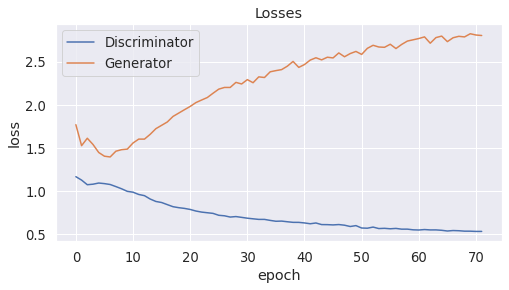

* Epoch 73/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5299381673336029 gener loss= 2.7977235247612 real score= 0.8959438424825669 fake score= 0.10435849932432174


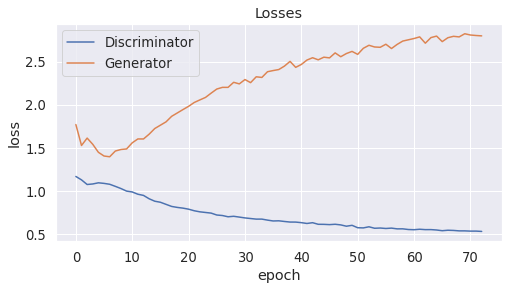

* Epoch 74/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5272786116600037 gener loss= 2.846861782360077 real score= 0.8983236577033996 fake score= 0.10111516356021166


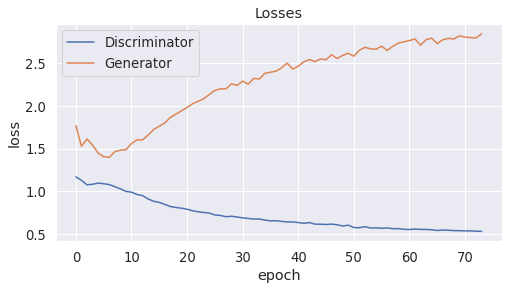

* Epoch 75/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5300441543340683 gener loss= 2.8281049054145813 real score= 0.8969187430381775 fake score= 0.10338646275103092


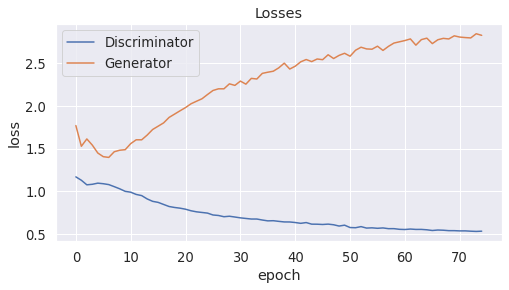

* Epoch 76/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5330007380723953 gener loss= 2.838702569818497 real score= 0.8962384613513946 fake score= 0.10379648984521628


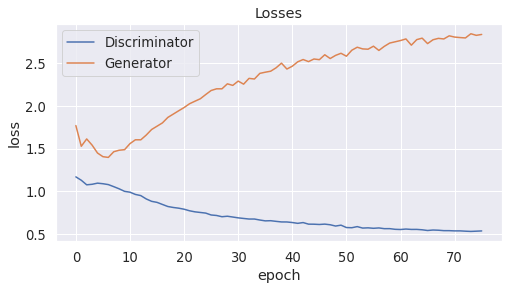

* Epoch 77/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5259240127325058 gener loss= 2.8440889718055726 real score= 0.8993265280961991 fake score= 0.1005541715733707


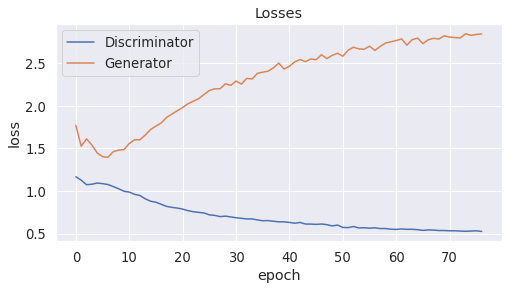

* Epoch 78/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5254286933422089 gener loss= 2.8250773542881014 real score= 0.9003684172153473 fake score= 0.10000301347523928


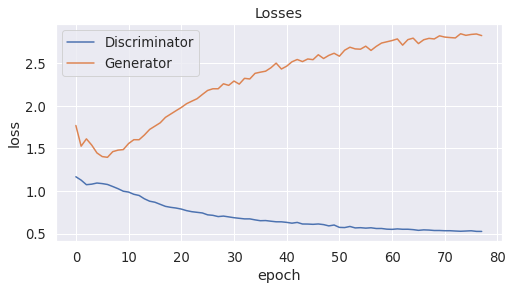

* Epoch 79/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5253572510242462 gener loss= 2.825168715238571 real score= 0.8981113957643508 fake score= 0.10119718219563364


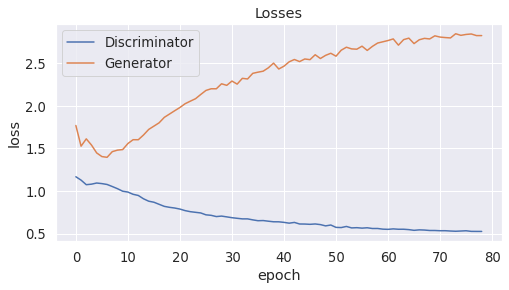

* Epoch 80/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5238835728287697 gener loss= 2.8878599561691285 real score= 0.9005933285713196 fake score= 0.09928402078896761


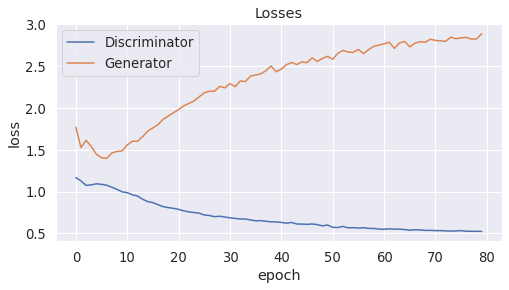

* Epoch 81/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5201537949323655 gener loss= 2.8587815638542176 real score= 0.9015100286483765 fake score= 0.09784582412205636


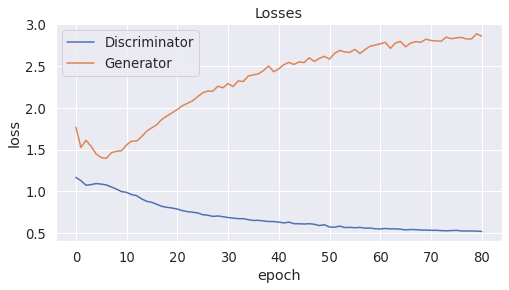

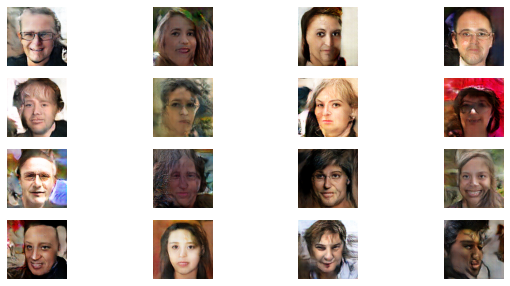

* Epoch 82/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5236565897464752 gener loss= 2.8847212988853457 real score= 0.8998258647441864 fake score= 0.09982976430803538


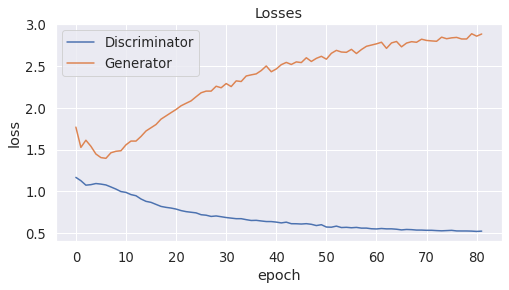

* Epoch 83/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.522283710360527 gener loss= 2.857981630706787 real score= 0.9008203392028808 fake score= 0.09887649349346757


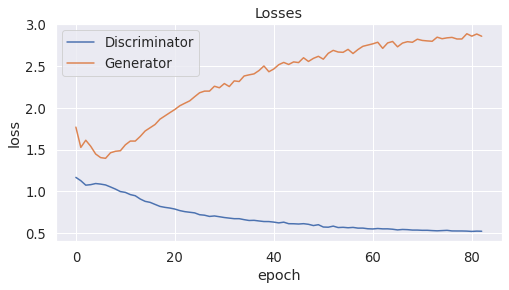

* Epoch 84/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5190356290102005 gener loss= 2.8151839353561403 real score= 0.9018745824575424 fake score= 0.09812694854252041


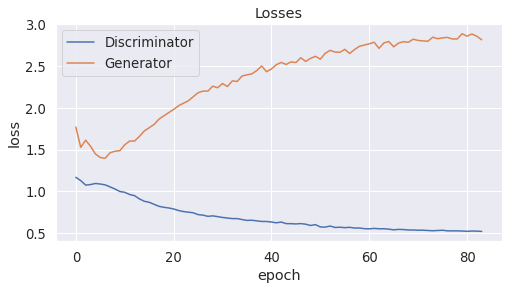

* Epoch 85/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5165628343820572 gener loss= 2.8909555132865905 real score= 0.9031171588420868 fake score= 0.09624959269240499


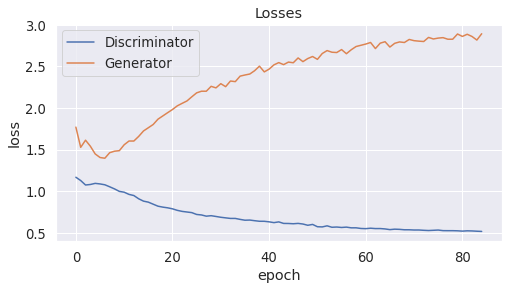

* Epoch 86/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5164545479536057 gener loss= 2.8687250817775727 real score= 0.9030487607479095 fake score= 0.09628857736214995


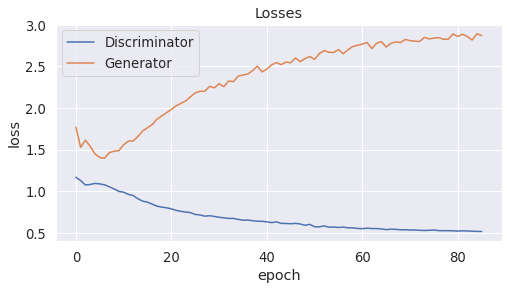

* Epoch 87/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5138032419681549 gener loss= 2.848258466053009 real score= 0.9058478589057922 fake score= 0.09394232965558767


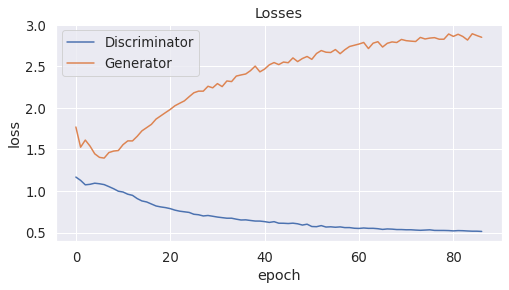

* Epoch 88/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5183046560287475 gener loss= 2.86491202249527 real score= 0.903192090845108 fake score= 0.09723995898067951


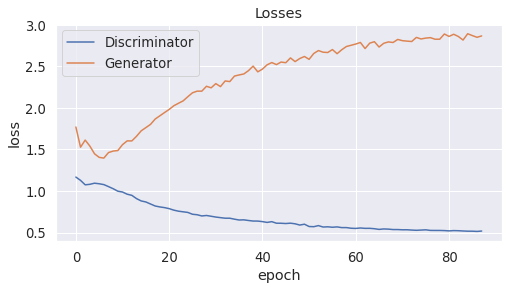

* Epoch 89/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.514049305844307 gener loss= 2.8793536063671112 real score= 0.9053914355278015 fake score= 0.09419385893195868


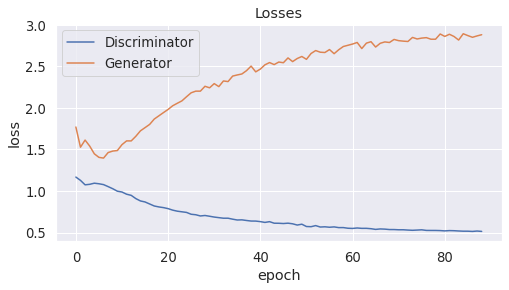

* Epoch 90/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5069586761951447 gener loss= 2.925330938720703 real score= 0.9089380440711975 fake score= 0.09080342430137098


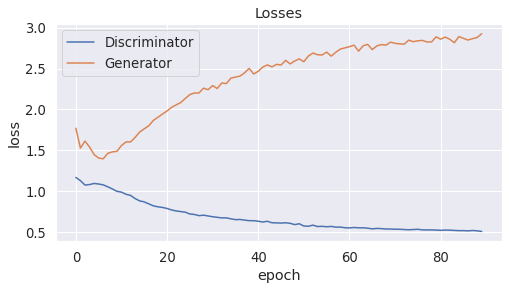

* Epoch 91/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5134979628562927 gener loss= 2.891876340675354 real score= 0.9047947479248046 fake score= 0.09519039533101022


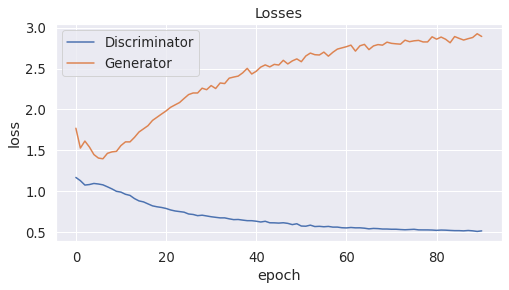

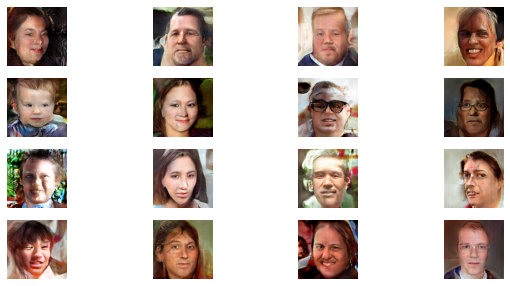

* Epoch 92/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5113395599365235 gener loss= 2.9371435712337495 real score= 0.9051757633924484 fake score= 0.09471532876193524


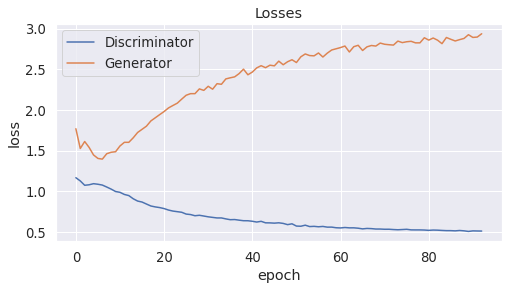

* Epoch 94/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5037835485935211 gener loss= 2.9374790033817293 real score= 0.9090819765567779 fake score= 0.09043439749106764


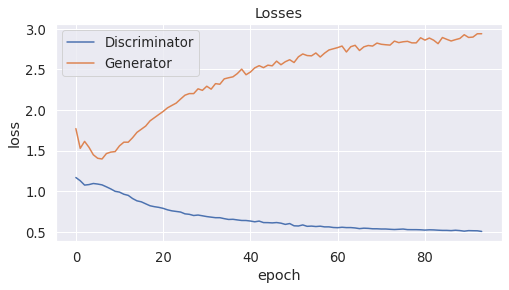

* Epoch 95/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.511466188955307 gener loss= 2.9050041396617887 real score= 0.9054331014633179 fake score= 0.09397578337714076


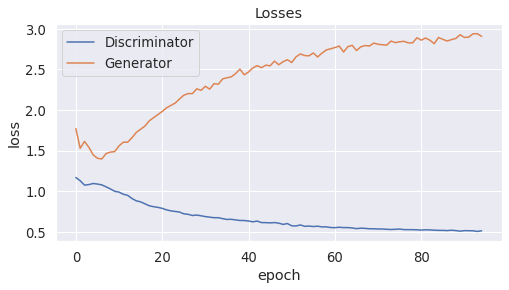

* Epoch 96/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5066282836437226 gener loss= 2.924856101322174 real score= 0.9091054456710815 fake score= 0.08993644055835903


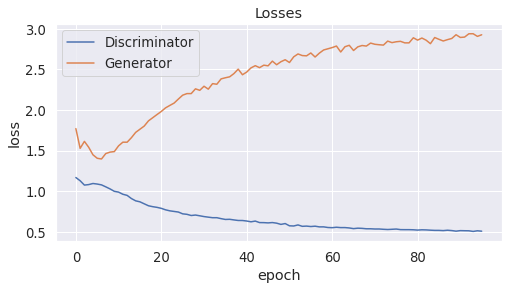

* Epoch 97/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5056141686916351 gener loss= 2.907562080526352 real score= 0.9098008072853089 fake score= 0.08980095977000892


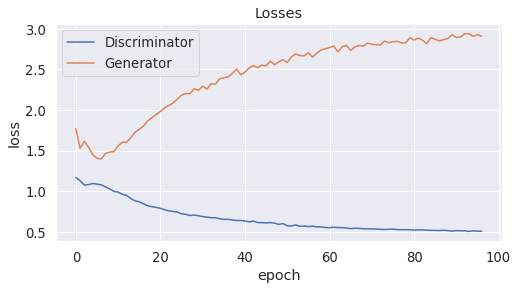

* Epoch 98/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5022653698921203 gener loss= 2.891637689733505 real score= 0.9108385972976685 fake score= 0.08950474094338715


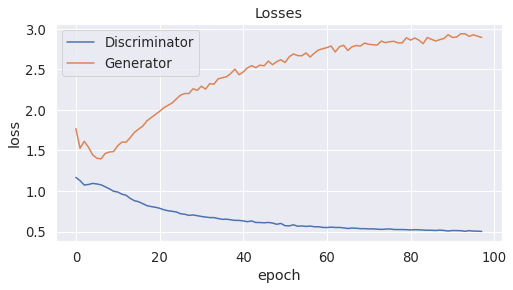

* Epoch 99/350
discr lr [9e-05]
gener lr [0.00018]
discr loss= 0.5032144680261612 gener loss= 2.9050809114933016 real score= 0.9108086899280549 fake score= 0.08853255468308925


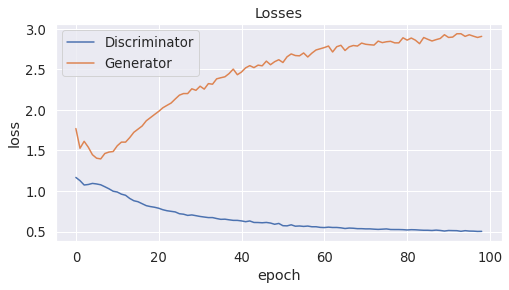

* Epoch 100/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.5021867945432663 gener loss= 2.95105188627243 real score= 0.9110644727706909 fake score= 0.08935424122214318


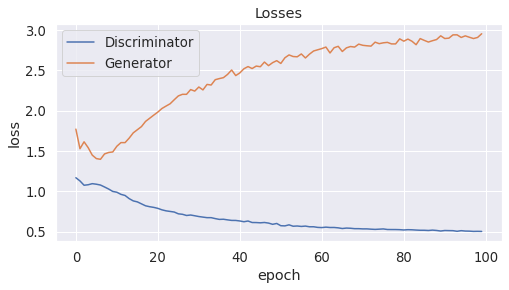

* Epoch 101/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.4942638414859772 gener loss= 2.9027676988124846 real score= 0.91257615275383 fake score= 0.08687720408067107


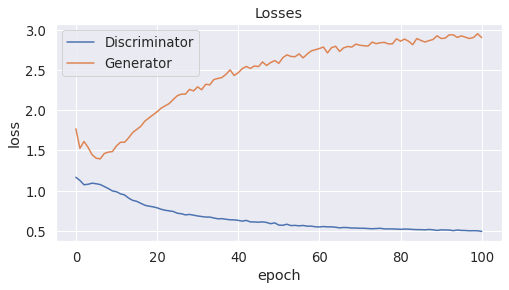

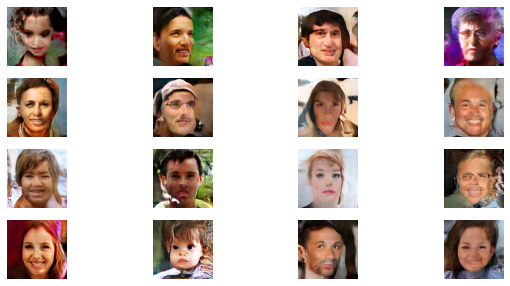

* Epoch 102/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.49329886910915377 gener loss= 2.9318401164054873 real score= 0.9154694829940796 fake score= 0.0846259772337973


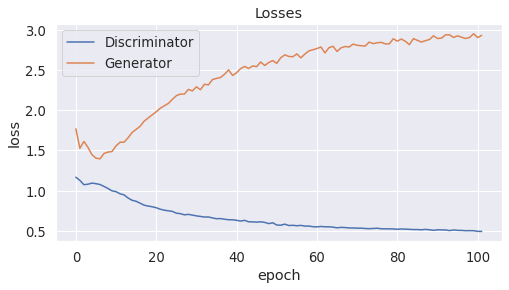

* Epoch 103/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.49912393074035644 gener loss= 2.9225065572738647 real score= 0.9119166322231292 fake score= 0.08812289836257696


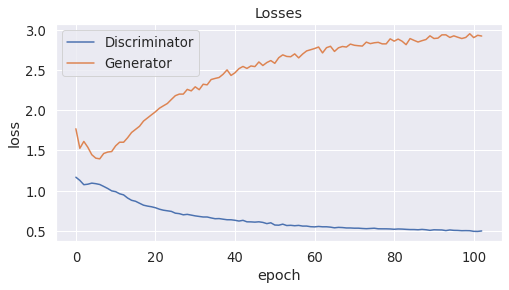

* Epoch 104/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.4875544607639313 gener loss= 2.912502373981476 real score= 0.9161537615776062 fake score= 0.08399347776249051


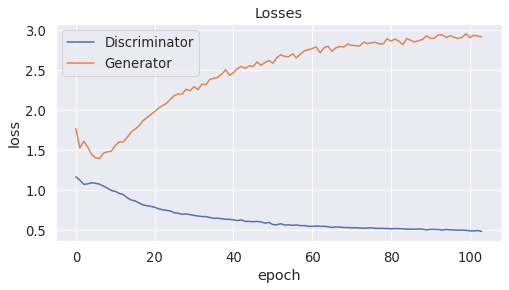

* Epoch 105/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.4925443577528 gener loss= 2.9447419678688047 real score= 0.9154809811115265 fake score= 0.08481633802689612


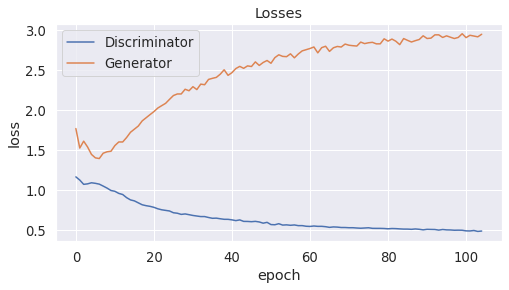

* Epoch 106/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.48337626140117645 gener loss= 2.9524723406791686 real score= 0.9165910486698151 fake score= 0.08324694408550859


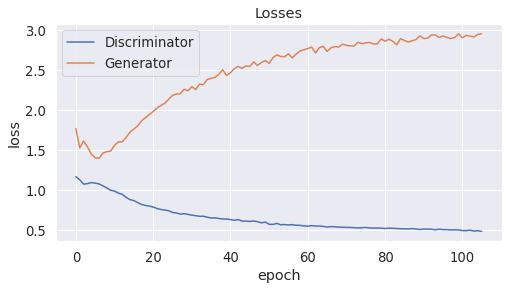

* Epoch 107/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.4890118589401245 gener loss= 2.947601743507385 real score= 0.9163105569839477 fake score= 0.08405901335664094


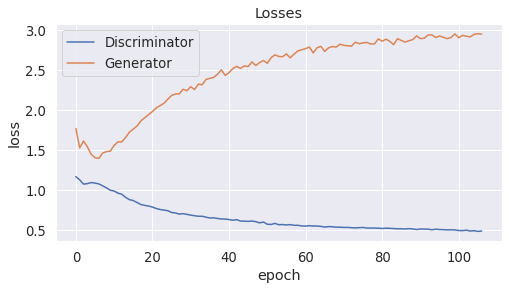

* Epoch 108/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.4857033194303513 gener loss= 2.9090098090171814 real score= 0.9174446744918823 fake score= 0.08312747591175139


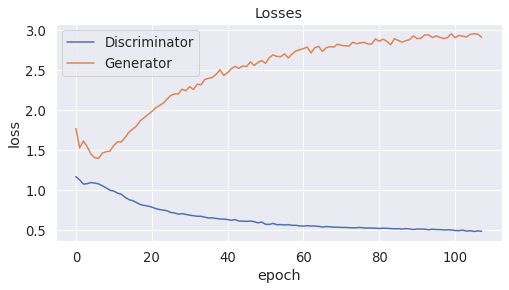

* Epoch 109/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.49340399622917175 gener loss= 2.945826519393921 real score= 0.91482760887146 fake score= 0.08540203452706337


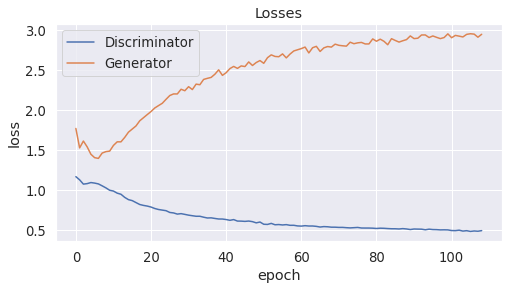

* Epoch 110/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.48308472361564636 gener loss= 2.92375756444931 real score= 0.9166213548660278 fake score= 0.08261236570775508


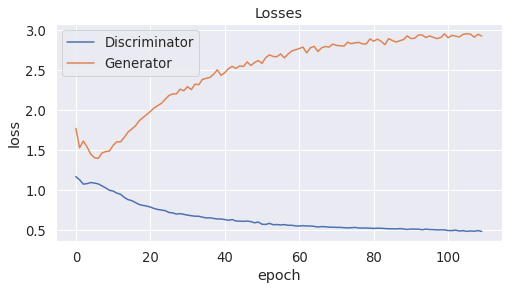

* Epoch 111/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.4872377570867538 gener loss= 2.939123199748993 real score= 0.9172994785785675 fake score= 0.08272162695676089


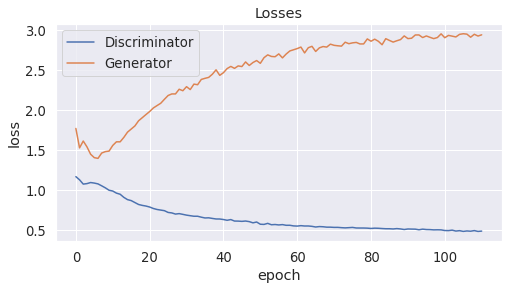

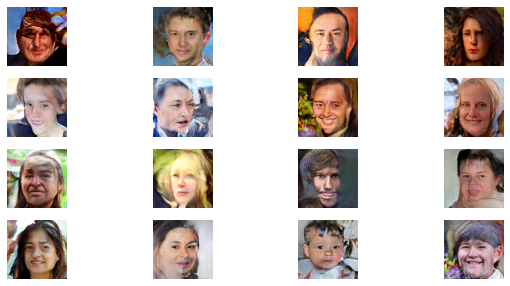

* Epoch 112/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.48529459867477415 gener loss= 2.9552371243476867 real score= 0.9172295233249664 fake score= 0.08190204477384687


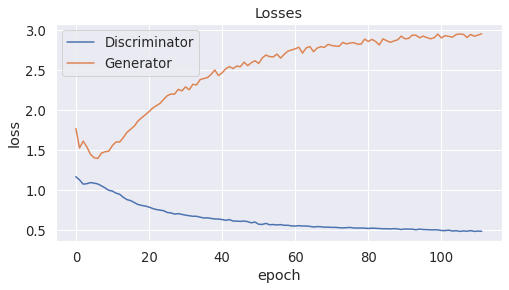

* Epoch 113/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.48454020652770996 gener loss= 2.9303259785652163 real score= 0.9174446747303009 fake score= 0.08280169434137642


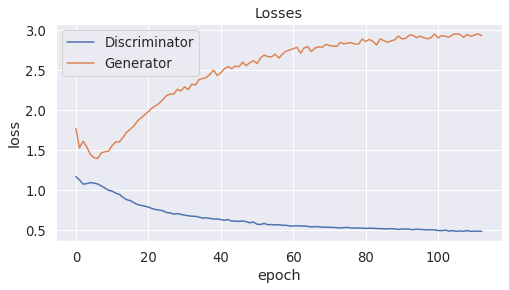

* Epoch 114/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.48939517426490786 gener loss= 2.9228649506568907 real score= 0.9165021626710892 fake score= 0.08378153759390115


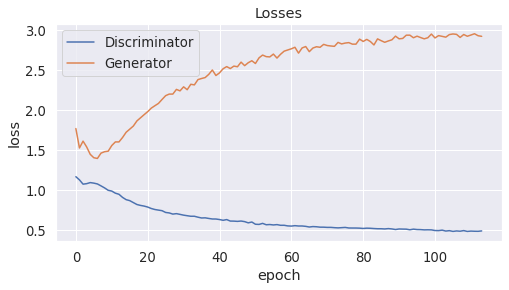

* Epoch 115/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.48668276875019073 gener loss= 2.9424951111793516 real score= 0.9171466214179993 fake score= 0.08261897778324782


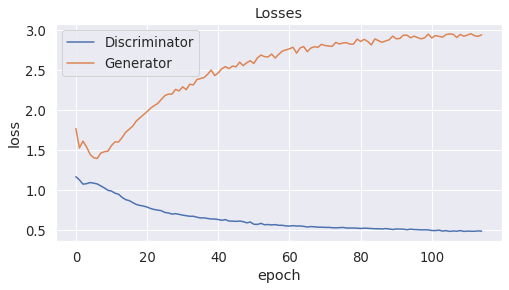

* Epoch 116/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.48424278383255004 gener loss= 2.943310991382599 real score= 0.9183736751556396 fake score= 0.08175423470139503


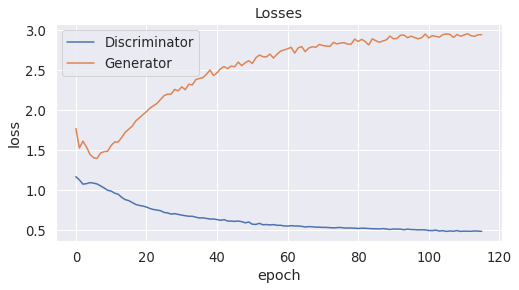

* Epoch 117/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.4834173248529434 gener loss= 2.9061013777732847 real score= 0.919289823102951 fake score= 0.08151927112936974


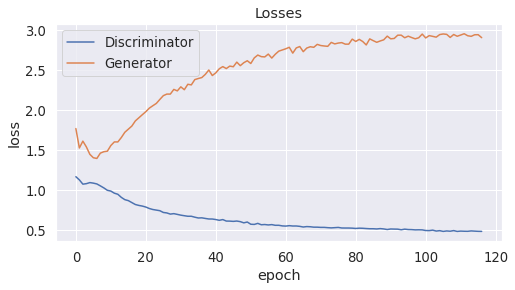

* Epoch 118/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.484825700545311 gener loss= 2.9388729157447817 real score= 0.9167786837577819 fake score= 0.08261623829007149


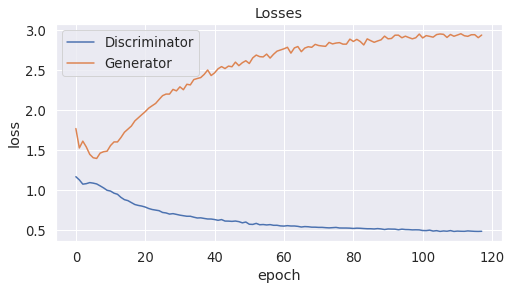

* Epoch 119/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.48365113739967347 gener loss= 2.931130099105835 real score= 0.9185126046180725 fake score= 0.08147302700206638


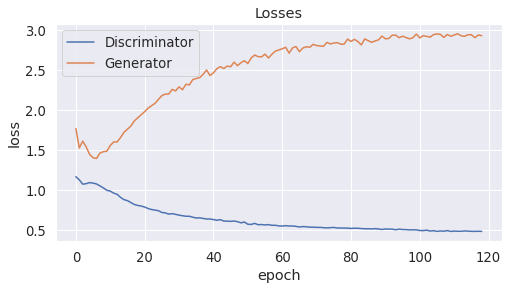

* Epoch 120/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.47962102813720703 gener loss= 2.9613140639781954 real score= 0.9191994176387787 fake score= 0.08024048763550817


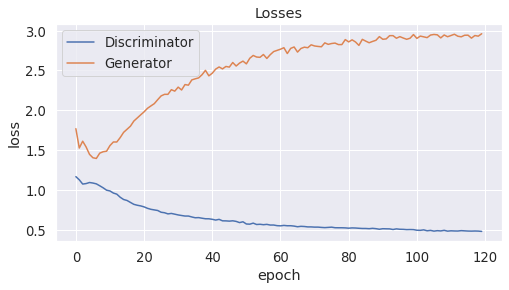

* Epoch 121/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.4791307564496994 gener loss= 2.9778909898757933 real score= 0.9200599673748017 fake score= 0.080195719011873


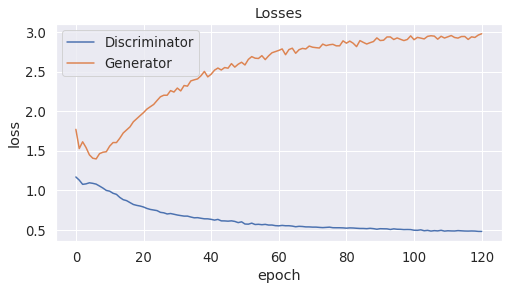

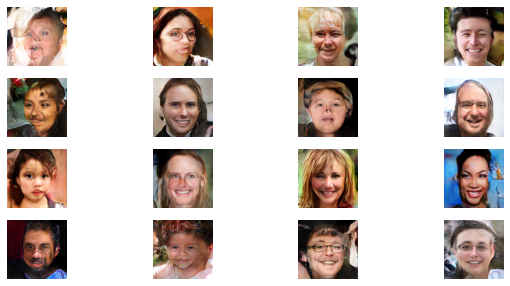

* Epoch 122/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.47757101848125455 gener loss= 2.91496792883873 real score= 0.920830082321167 fake score= 0.07875944658964873


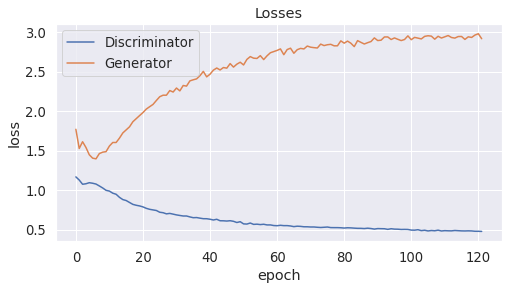

* Epoch 123/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.47827485258579255 gener loss= 2.9173503462791444 real score= 0.9209765362739563 fake score= 0.07874902366027237


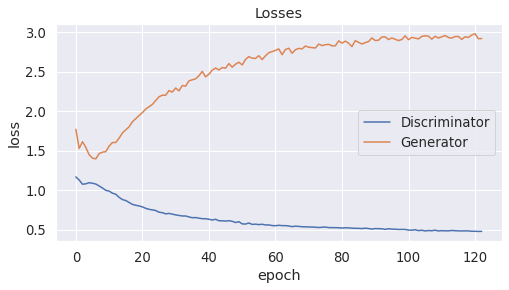

* Epoch 124/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.48302906632423404 gener loss= 2.9421549040794375 real score= 0.9196063220500946 fake score= 0.08081255695968867


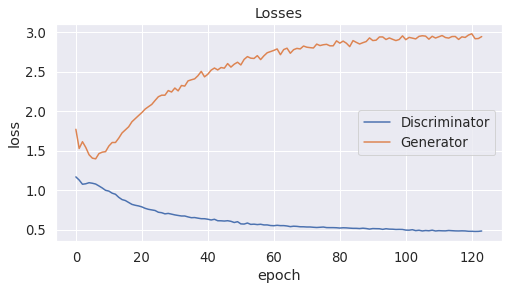

* Epoch 125/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.4838434596776962 gener loss= 2.950397137975693 real score= 0.9176879082679749 fake score= 0.08151308215968311


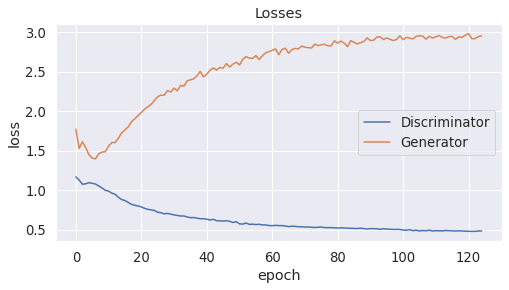

* Epoch 126/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.4752652748346329 gener loss= 2.947272481918335 real score= 0.9217632058620453 fake score= 0.07787024108432233


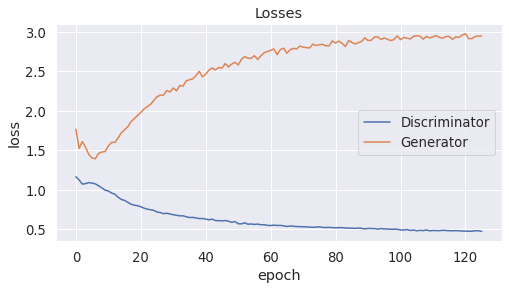

* Epoch 127/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.4785527379989624 gener loss= 2.9263981612205505 real score= 0.920470840883255 fake score= 0.0796712631881237


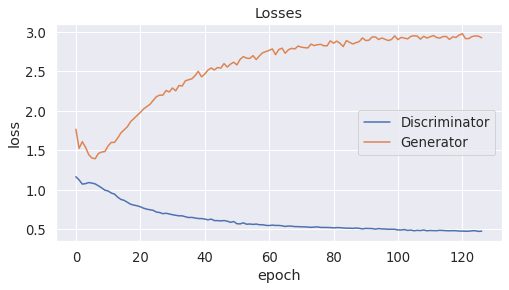

* Epoch 128/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.47714618663787844 gener loss= 2.9045175594329833 real score= 0.9218945789337158 fake score= 0.07804172673523425


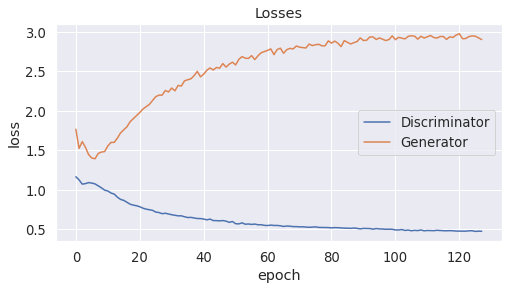

* Epoch 129/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.4796723140478134 gener loss= 2.9650743668556214 real score= 0.9202444321155548 fake score= 0.079454076891765


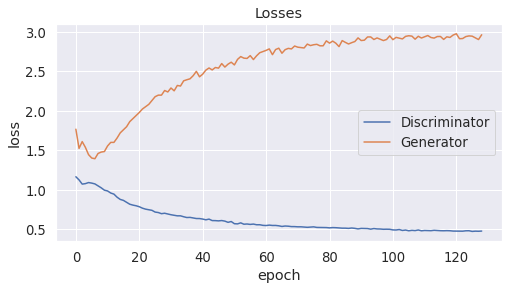

* Epoch 130/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.47637632081508635 gener loss= 2.9414485248565674 real score= 0.9220028606891633 fake score= 0.07852592558860778


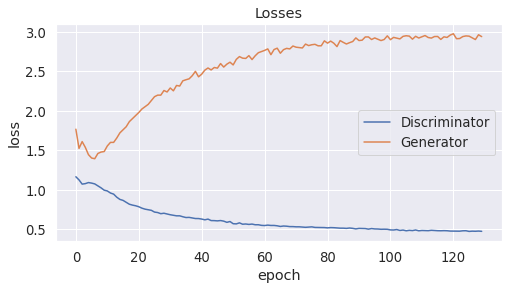

* Epoch 131/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.47641553797721864 gener loss= 2.9326815269470217 real score= 0.9211594359874725 fake score= 0.07813716985285282


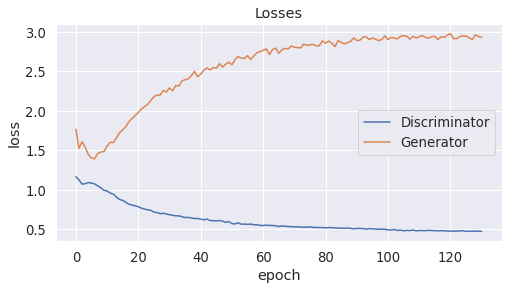

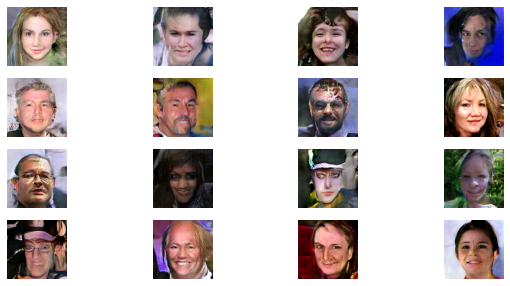

* Epoch 132/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.47700735259056093 gener loss= 2.916882929611206 real score= 0.9217233374118805 fake score= 0.07814000822901726


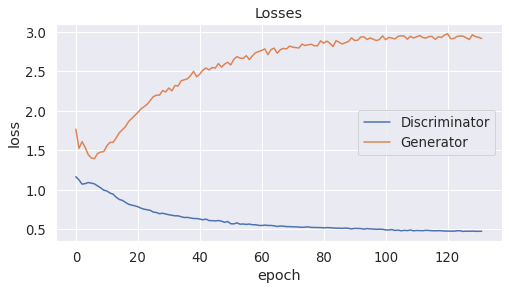

* Epoch 133/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.4775956020116806 gener loss= 2.9538966013908388 real score= 0.9208927334785462 fake score= 0.07866623947322368


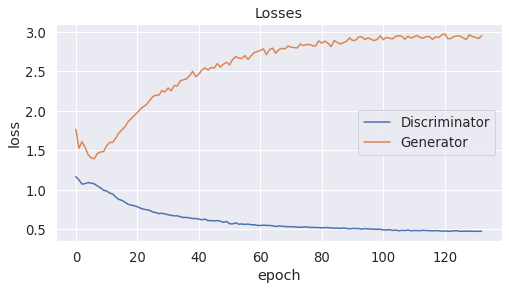

* Epoch 134/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.47601179795265197 gener loss= 2.9363901562690735 real score= 0.921987786579132 fake score= 0.07845254895016551


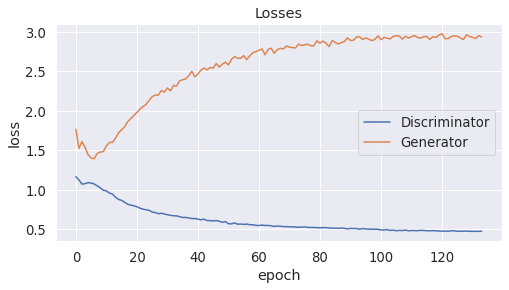

* Epoch 135/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.4724101102232933 gener loss= 2.935106355571747 real score= 0.922916474533081 fake score= 0.07715696372687816


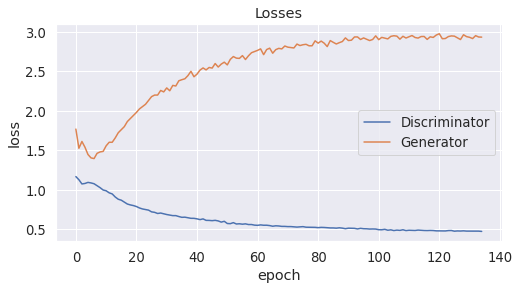

* Epoch 136/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.4715288801431656 gener loss= 2.9421061448097228 real score= 0.9236819292068481 fake score= 0.07668561230450868


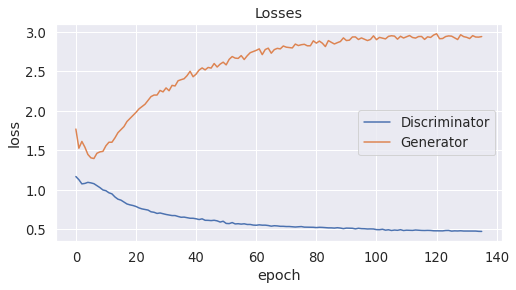

* Epoch 137/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.4688377275943756 gener loss= 2.9362769861221314 real score= 0.9231122093200683 fake score= 0.07681117681264878


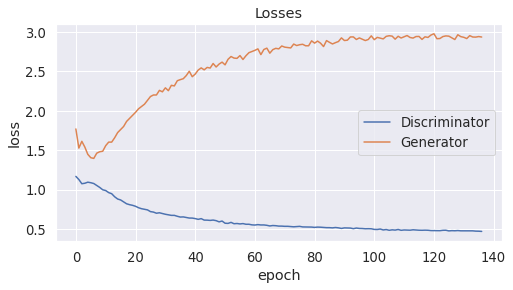

* Epoch 138/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.47812648310661315 gener loss= 2.9514649579048156 real score= 0.9206249854564666 fake score= 0.07889923632368445


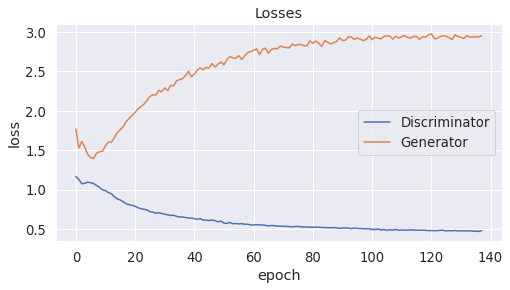

* Epoch 139/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.47489517369270323 gener loss= 2.9478520095825194 real score= 0.9224132190704346 fake score= 0.07829956946484745


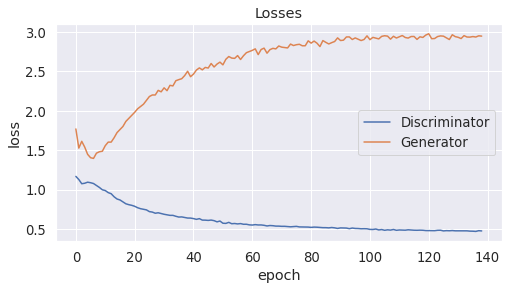

* Epoch 140/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.4720923989057541 gener loss= 3.009349881839752 real score= 0.9238296888828278 fake score= 0.07605394900515676


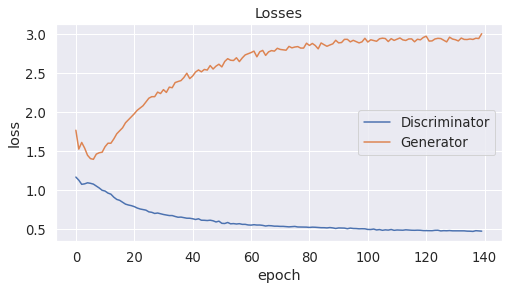

* Epoch 141/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.473185630440712 gener loss= 2.942871378803253 real score= 0.9226977419376373 fake score= 0.07764844221957028


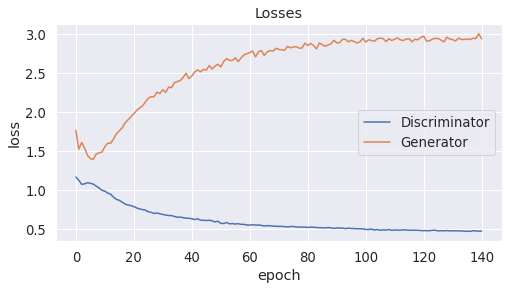

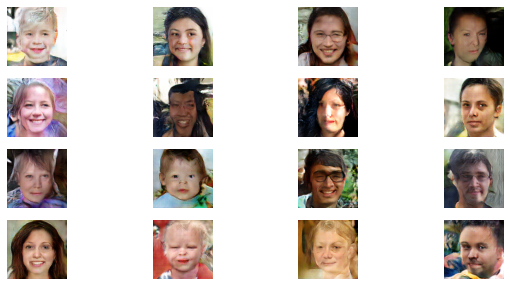

* Epoch 142/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.469678621006012 gener loss= 2.9698741274833678 real score= 0.9243649659633636 fake score= 0.07492998340837657


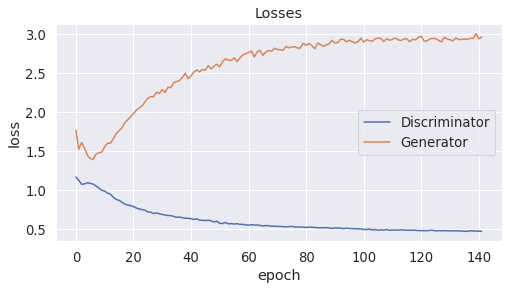

* Epoch 143/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.4733373848438263 gener loss= 2.9233997235298155 real score= 0.9230209956645966 fake score= 0.07709938732758165


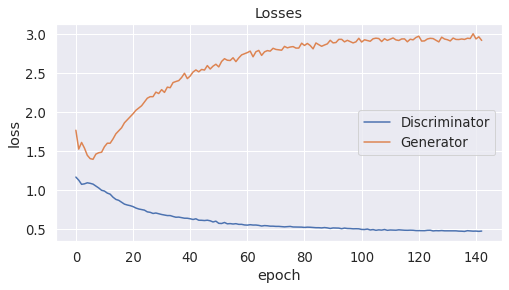

* Epoch 144/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.4674031043291092 gener loss= 2.9391356706619263 real score= 0.9254414034366608 fake score= 0.07480311049222946


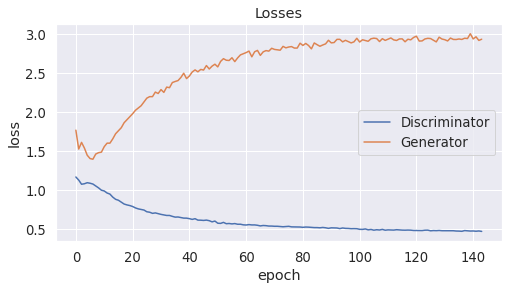

* Epoch 145/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.4705008072137833 gener loss= 2.9820062521934507 real score= 0.9249313492774963 fake score= 0.07537780615985394


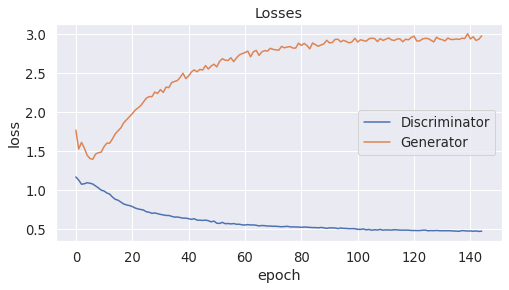

* Epoch 146/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.4696231370449066 gener loss= 2.9776075845718384 real score= 0.9242375010967254 fake score= 0.0752595671236515


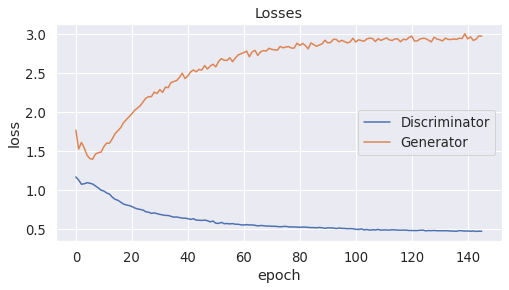

* Epoch 147/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.4716138903617859 gener loss= 2.9371524424552917 real score= 0.9234393465518952 fake score= 0.0769108242072165


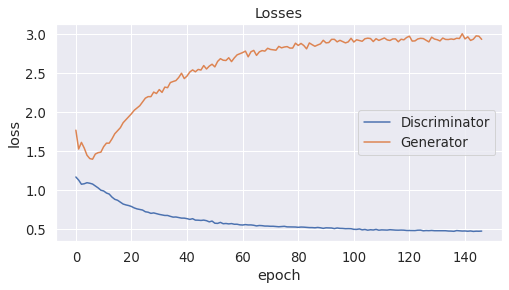

* Epoch 148/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.4701664958953857 gener loss= 2.916278907394409 real score= 0.9247603495597839 fake score= 0.07607938364818692


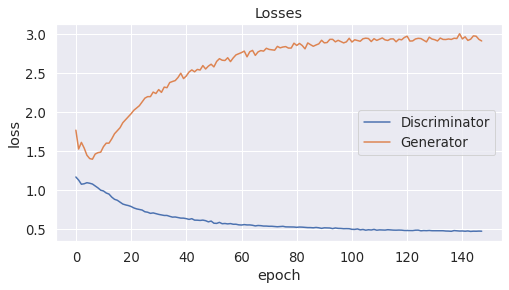

* Epoch 149/350
discr lr [8.1e-05]
gener lr [0.000162]
discr loss= 0.4676719838619232 gener loss= 2.9818266013145447 real score= 0.9242157409191132 fake score= 0.07518957094550133


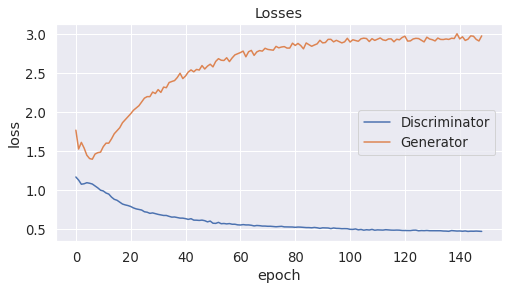

* Epoch 150/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.4643759682178497 gener loss= 2.948734950351715 real score= 0.9264746099472045 fake score= 0.07323738872148096


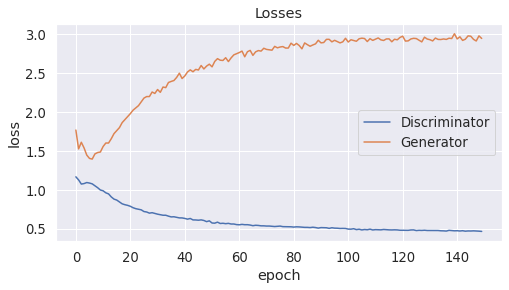

* Epoch 151/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.4634025010585785 gener loss= 2.9332348032951354 real score= 0.9262722078323364 fake score= 0.07349694354832173


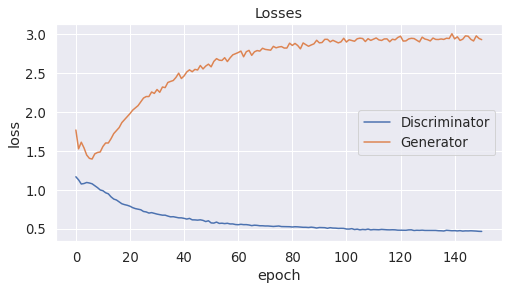

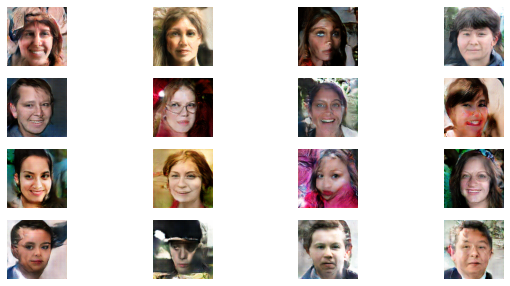

* Epoch 152/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.46115140557289125 gener loss= 2.95979922246933 real score= 0.9278724971294403 fake score= 0.07218823559060693


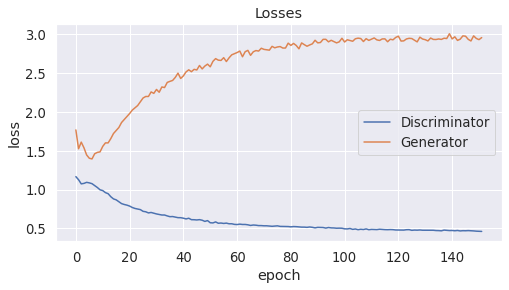

* Epoch 153/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.4612219498157501 gener loss= 2.9623770300865173 real score= 0.9270856422901154 fake score= 0.0734980894856155


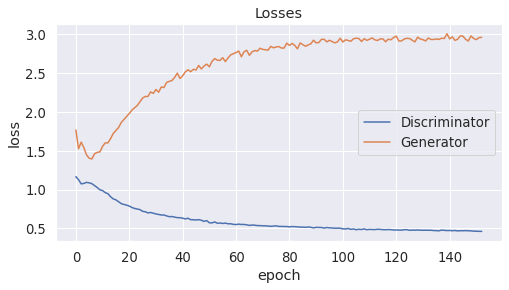

* Epoch 154/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.4620493478298187 gener loss= 2.9760079478263854 real score= 0.9279928885459899 fake score= 0.07178959321826696


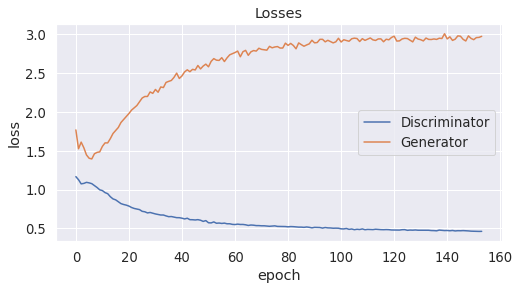

* Epoch 155/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.4563318233728409 gener loss= 2.9543432203292848 real score= 0.9292855638027191 fake score= 0.07097818077877163


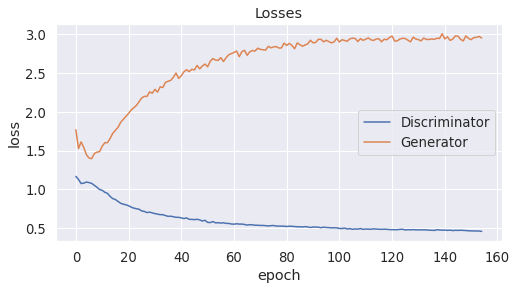

* Epoch 156/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.46390901391506195 gener loss= 2.9201244462013243 real score= 0.9268170770168305 fake score= 0.07348791036382317


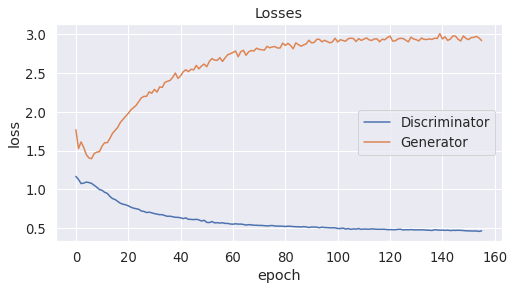

* Epoch 157/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.4551080761194229 gener loss= 2.952907314682007 real score= 0.9288946604251862 fake score= 0.07155205997079611


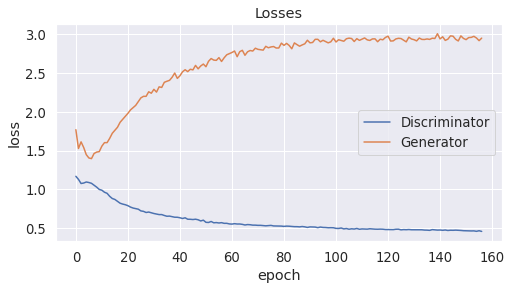

* Epoch 158/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.4629446853160858 gener loss= 2.96981131067276 real score= 0.9272829943180084 fake score= 0.07197764106020331


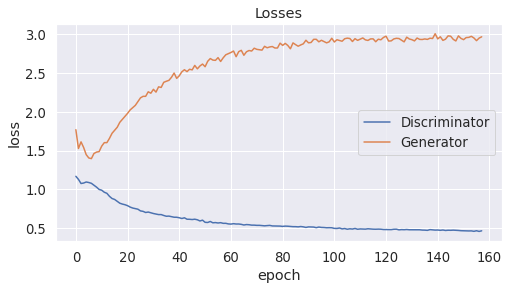

* Epoch 159/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.46201588089466095 gener loss= 2.9766947725296022 real score= 0.9276717693328858 fake score= 0.07218328296020628


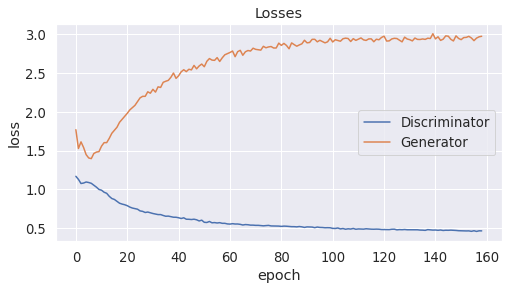

* Epoch 160/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.4590941283226013 gener loss= 2.9685088643074033 real score= 0.9282171744346619 fake score= 0.07241773607879877


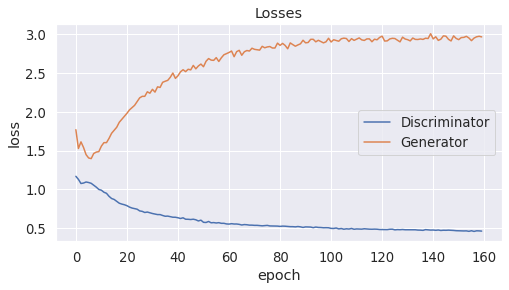

* Epoch 161/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.4563493012666702 gener loss= 2.94500124168396 real score= 0.9283365804672241 fake score= 0.07155853490009904


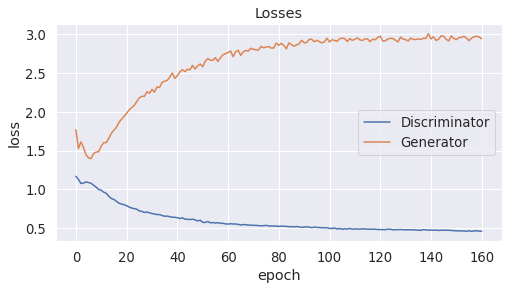

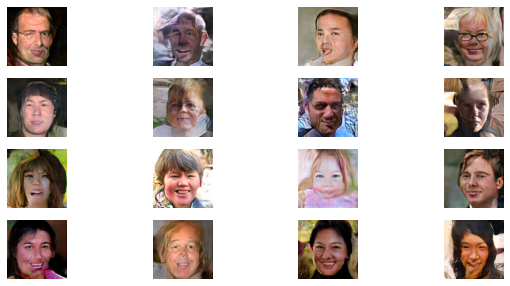

* Epoch 162/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.46049759900569914 gener loss= 2.983152453994751 real score= 0.92801440782547 fake score= 0.07227295545563102


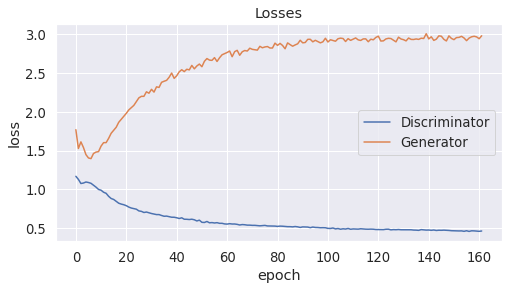

* Epoch 163/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.4607993158817291 gener loss= 2.959783463382721 real score= 0.9287844472885132 fake score= 0.07197560343146324


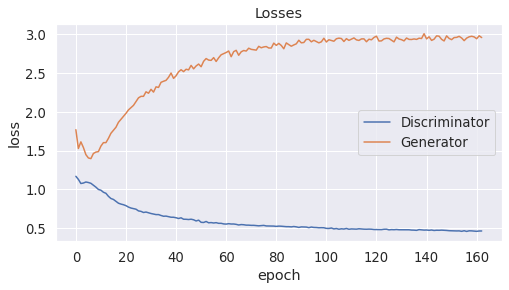

* Epoch 164/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.4597541020750999 gener loss= 2.961961585903168 real score= 0.9272809338569641 fake score= 0.07248435767516494


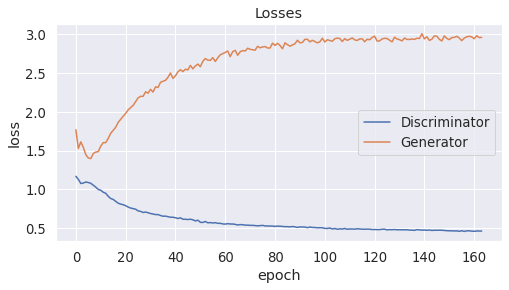

* Epoch 165/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.45693888924121856 gener loss= 2.981603483390808 real score= 0.928879077720642 fake score= 0.07175284522250294


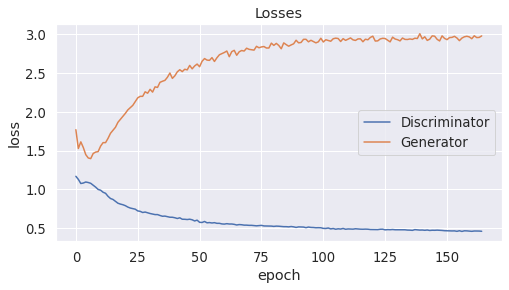

* Epoch 166/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.4568294780254364 gener loss= 2.9496559028625486 real score= 0.9291171743869782 fake score= 0.0713391342896968


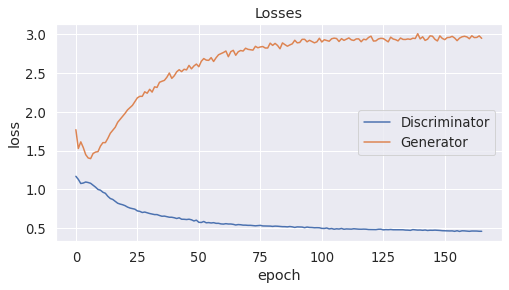

* Epoch 167/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.4589188498735428 gener loss= 2.992198059749603 real score= 0.9283600024700165 fake score= 0.07133178124576807


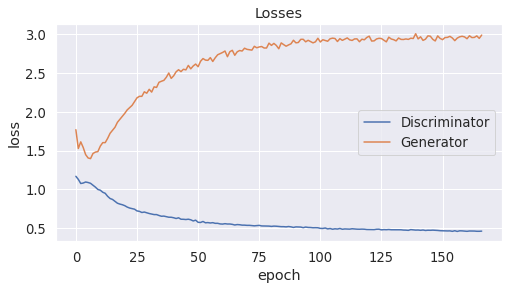

* Epoch 168/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.45496740913391115 gener loss= 2.9768496232032775 real score= 0.9302172755241394 fake score= 0.07024061568006873


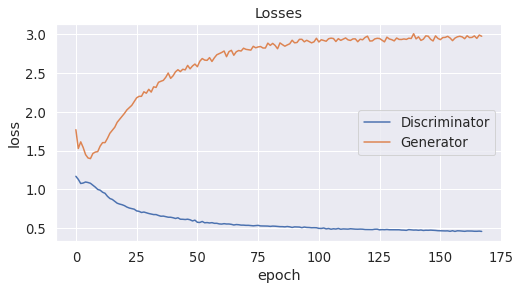

* Epoch 169/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.4575404363155365 gener loss= 2.971648429775238 real score= 0.9295947421550751 fake score= 0.07016551712527871


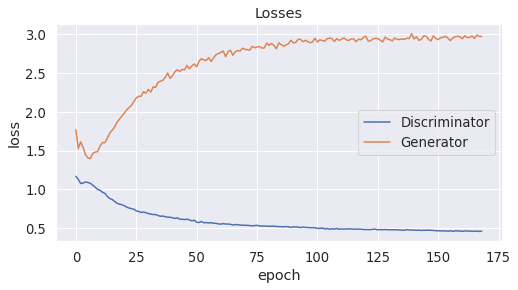

* Epoch 170/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.45717277081012725 gener loss= 2.9574105120658873 real score= 0.9287061778068543 fake score= 0.07087925510406494


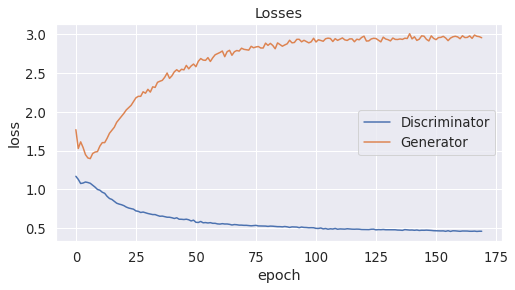

* Epoch 171/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.4557336505651474 gener loss= 2.9687442006111144 real score= 0.9292181016921998 fake score= 0.07069281628206373


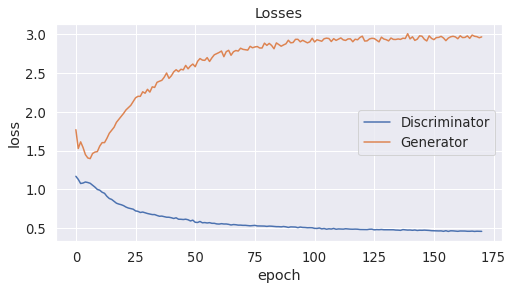

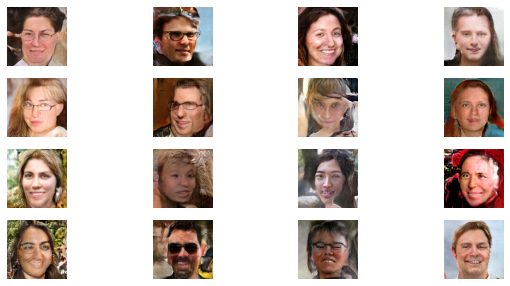

* Epoch 172/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.45812589662075043 gener loss= 2.96966876783371 real score= 0.9291092436790467 fake score= 0.0707982691116631


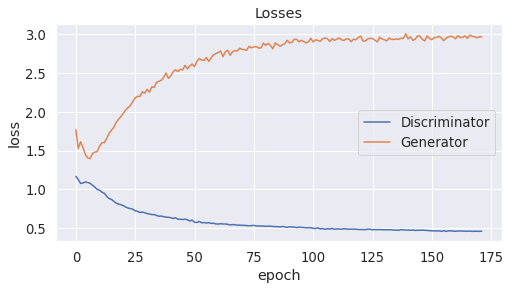

* Epoch 173/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.45619798953533175 gener loss= 2.948275504207611 real score= 0.9298421456336975 fake score= 0.07031700854599476


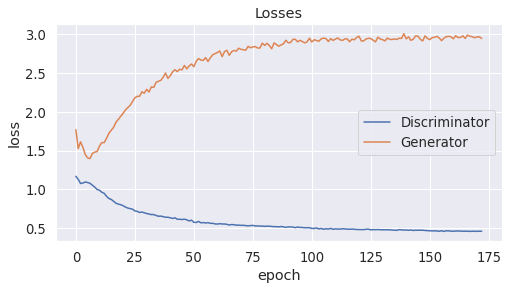

* Epoch 174/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.4547318572998047 gener loss= 2.959376986694336 real score= 0.9294327410697937 fake score= 0.070329248162359


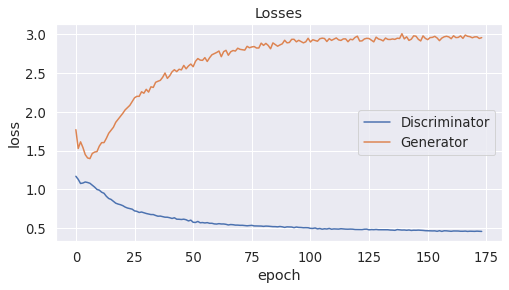

* Epoch 175/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.4561108327388763 gener loss= 2.9698929111480714 real score= 0.9295033961296082 fake score= 0.07048606652542949


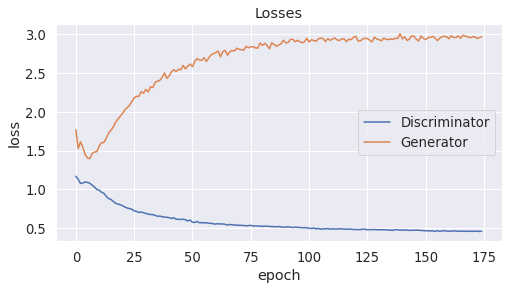

* Epoch 176/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.45709093599319456 gener loss= 2.947722109222412 real score= 0.9294139144897461 fake score= 0.07087517862543463


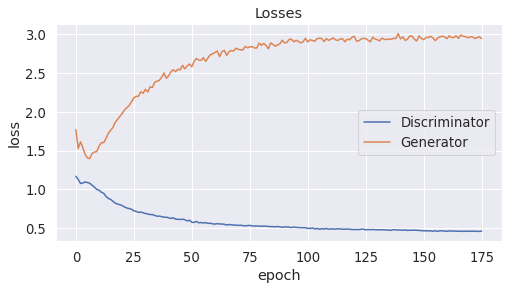

* Epoch 177/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.4553563717365265 gener loss= 2.932233938026428 real score= 0.929826358127594 fake score= 0.06985102950930595


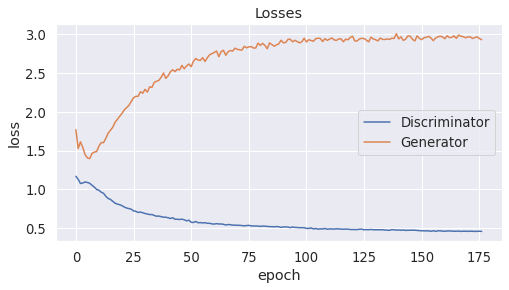

* Epoch 178/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.45381643509864805 gener loss= 2.9521432624816892 real score= 0.9298130239486694 fake score= 0.06914797709286213


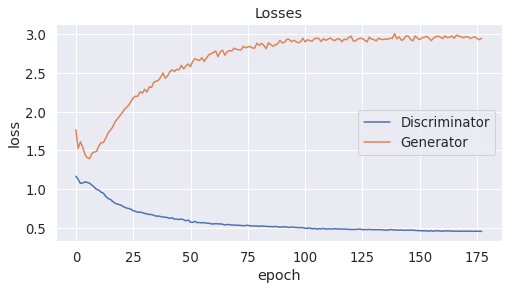

* Epoch 179/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.45430100269317625 gener loss= 2.95593515253067 real score= 0.9304051723003387 fake score= 0.06941493571698666


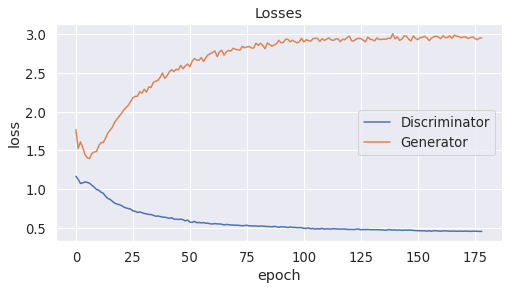

* Epoch 180/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.45656016941070554 gener loss= 2.9502952439308165 real score= 0.9293592031955719 fake score= 0.07029250464737416


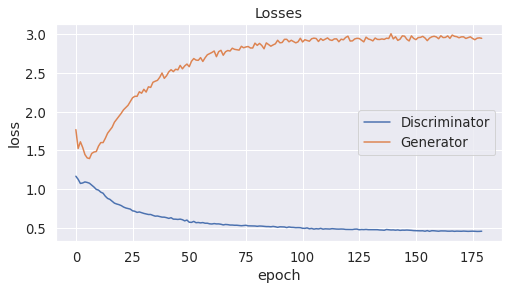

* Epoch 181/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.45490626220703123 gener loss= 2.9337117330551146 real score= 0.9297746126651764 fake score= 0.07040762351825833


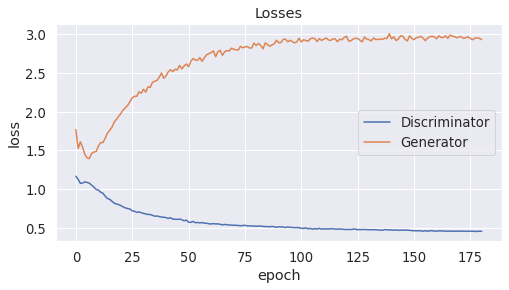

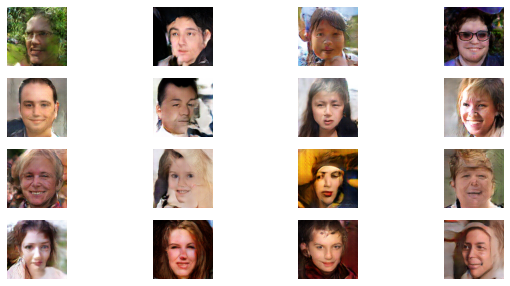

* Epoch 182/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.4570387710571289 gener loss= 2.9398515007019044 real score= 0.9299523172855377 fake score= 0.070428330463171


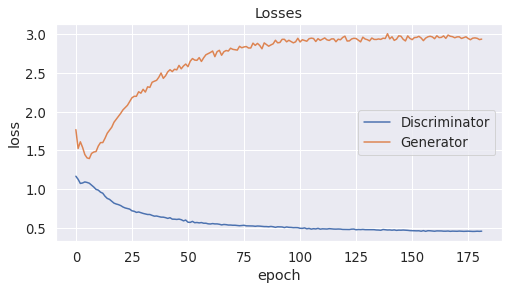

* Epoch 183/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.45581931354999544 gener loss= 2.9378935792922976 real score= 0.9296926419258118 fake score= 0.06959959838539362


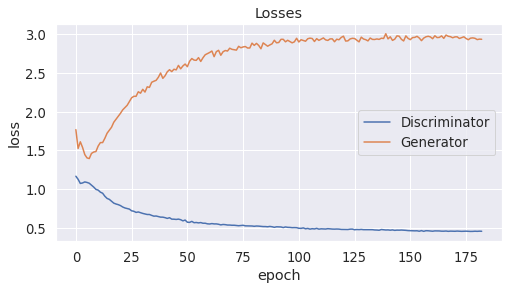

* Epoch 184/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.45334528527259826 gener loss= 2.945447646331787 real score= 0.9313794910430908 fake score= 0.06895895546525717


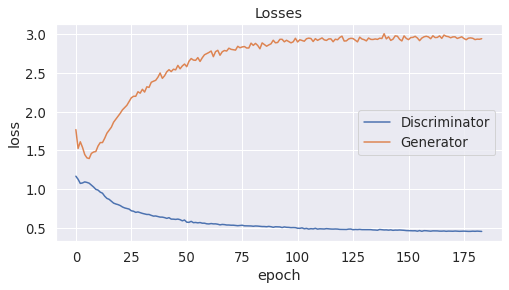

* Epoch 185/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.4568681158065796 gener loss= 2.9433329831123354 real score= 0.9296068315982818 fake score= 0.0703143242008984


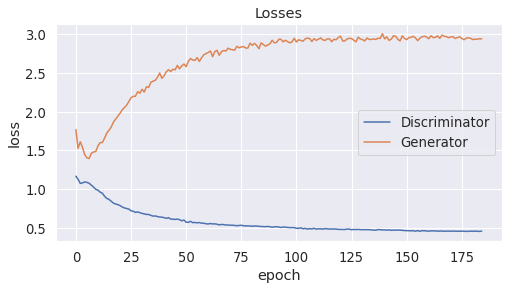

* Epoch 186/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.4540933954000473 gener loss= 2.966021094417572 real score= 0.9289705856800079 fake score= 0.07112704996541143


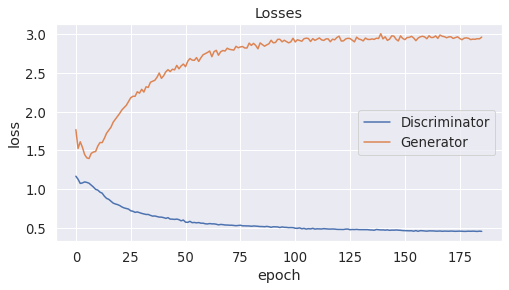

* Epoch 187/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.455323487329483 gener loss= 2.9519164439201355 real score= 0.9295703075408935 fake score= 0.07030536198094488


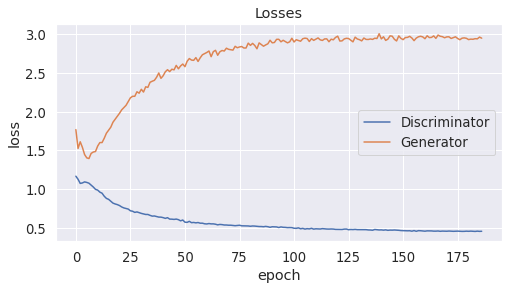

* Epoch 188/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.4483856984615326 gener loss= 2.948206363964081 real score= 0.9324831086158752 fake score= 0.06818424120172858


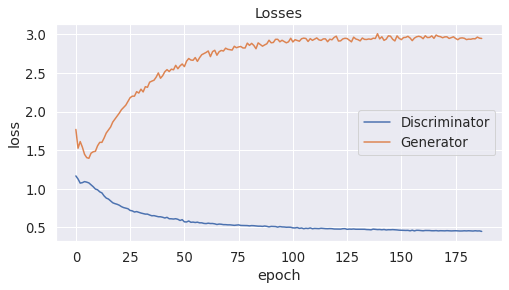

* Epoch 189/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.4509103877544403 gener loss= 2.9437806116104124 real score= 0.9309517035484314 fake score= 0.06936839848086238


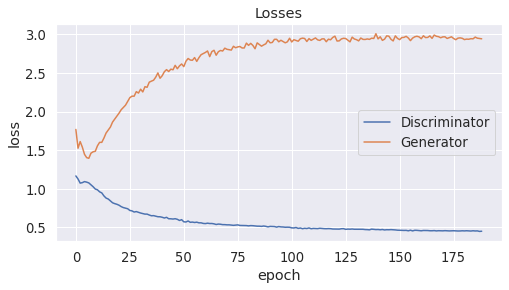

* Epoch 190/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.4519245891332626 gener loss= 2.9787533288955688 real score= 0.9306529812812805 fake score= 0.06862933119349182


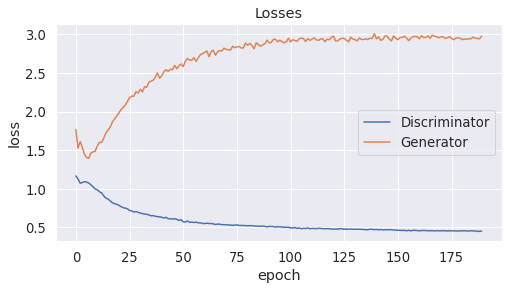

* Epoch 191/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.45403760395050047 gener loss= 2.9345268699645994 real score= 0.9305242713928222 fake score= 0.06956302675232291


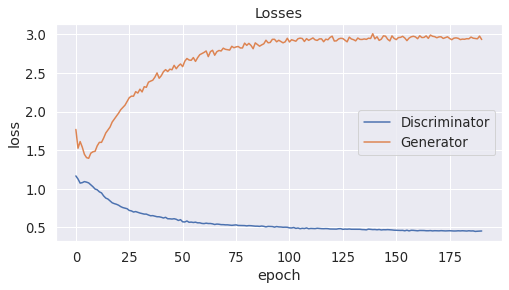

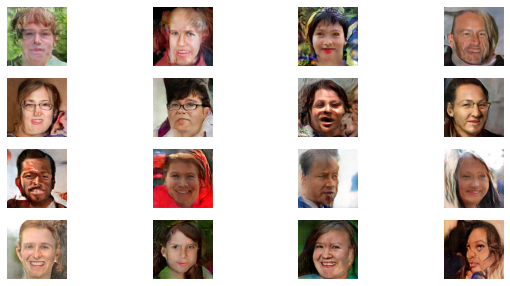

* Epoch 192/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.45024332206249235 gener loss= 2.9654763854026793 real score= 0.9317433691501618 fake score= 0.06839311319738627


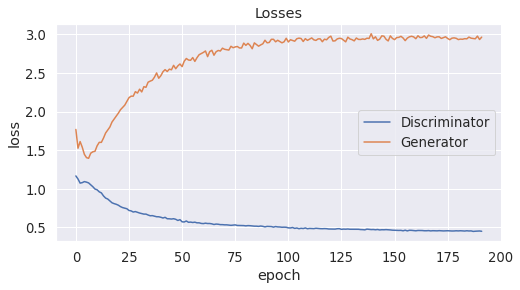

* Epoch 193/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.4521997888088226 gener loss= 2.938531247997284 real score= 0.9308480975151062 fake score= 0.06849507551938296


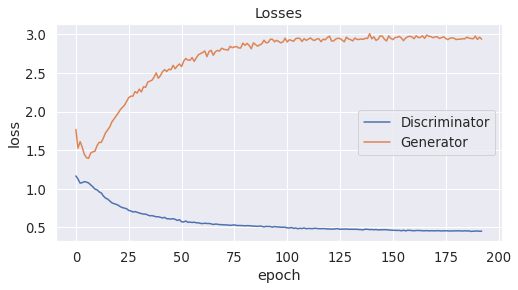

* Epoch 194/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.44952587785720827 gener loss= 2.9430481346130373 real score= 0.9308767286300659 fake score= 0.06878506163582206


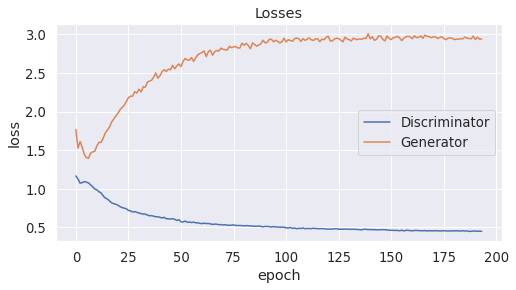

* Epoch 195/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.4521249893903732 gener loss= 2.955127717208862 real score= 0.930718495130539 fake score= 0.06912932700738311


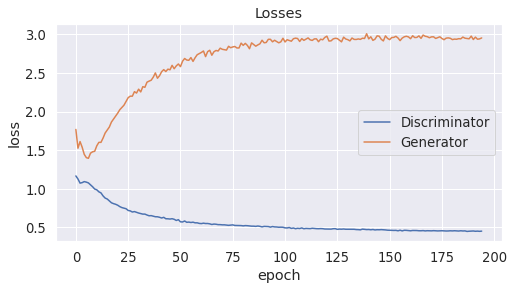

* Epoch 196/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.4522637984037399 gener loss= 2.9768654666900636 real score= 0.9319282053947449 fake score= 0.06787305293306709


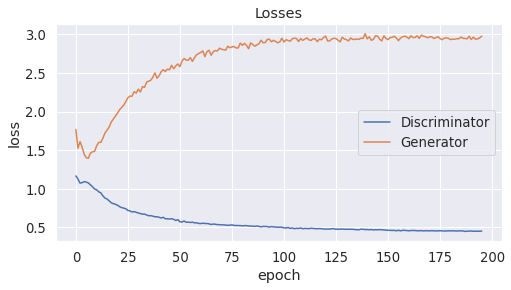

* Epoch 197/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.4480109363079071 gener loss= 2.9317604382514952 real score= 0.932337448835373 fake score= 0.06818662460371852


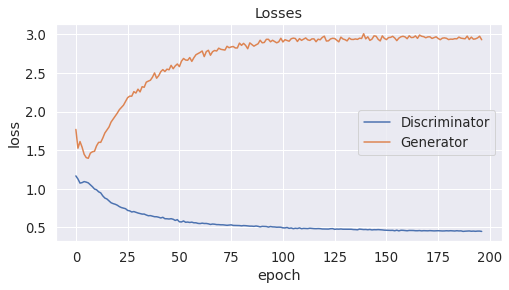

* Epoch 198/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.45179090859889987 gener loss= 2.9740328360557555 real score= 0.9306864802837371 fake score= 0.0689851024657488


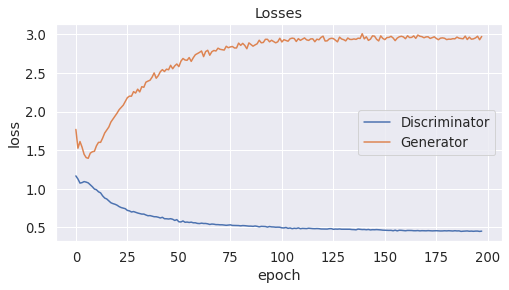

* Epoch 199/350
discr lr [7.290000000000001e-05]
gener lr [0.00014580000000000002]
discr loss= 0.4509133654356003 gener loss= 2.960008713054657 real score= 0.9323981065750122 fake score= 0.06783799664303661


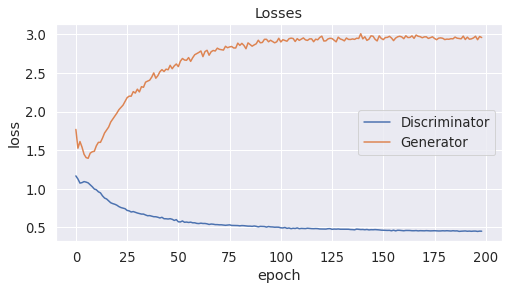

* Epoch 200/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.45433409993648527 gener loss= 2.9304934584617617 real score= 0.9304738020420075 fake score= 0.0690356100000441


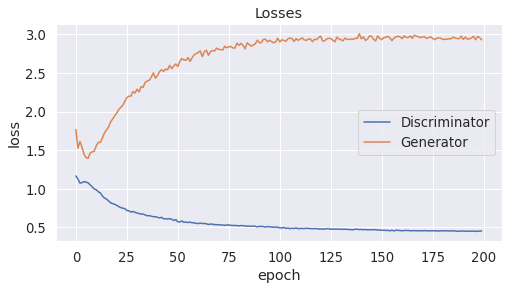

* Epoch 201/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.4454130338668823 gener loss= 2.930753919506073 real score= 0.9330942772388459 fake score= 0.06654955718666315


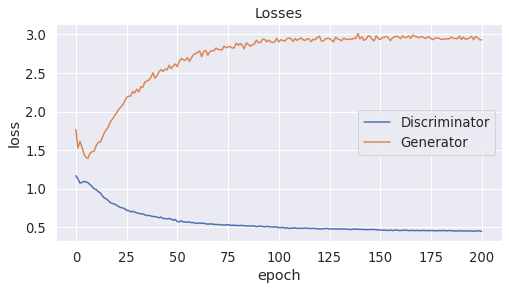

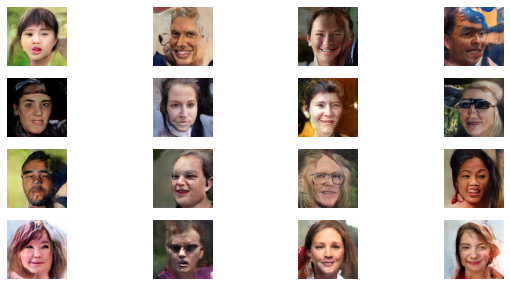

* Epoch 202/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.4489635013580322 gener loss= 2.9421630043029787 real score= 0.9334402530670166 fake score= 0.06667467190921307


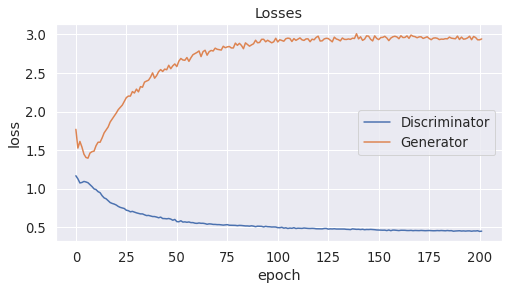

* Epoch 203/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.44813802247047424 gener loss= 2.9343309211730957 real score= 0.9320720139980316 fake score= 0.06787247838228941


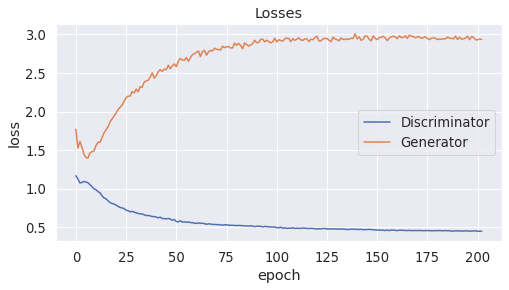

* Epoch 204/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.44284199867248536 gener loss= 2.97037144613266 real score= 0.9343501668930053 fake score= 0.06550312653332949


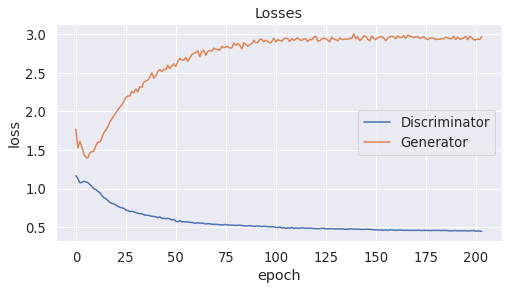

* Epoch 205/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.44663297533988955 gener loss= 2.9306872984886168 real score= 0.9337389583587646 fake score= 0.0664627713561058


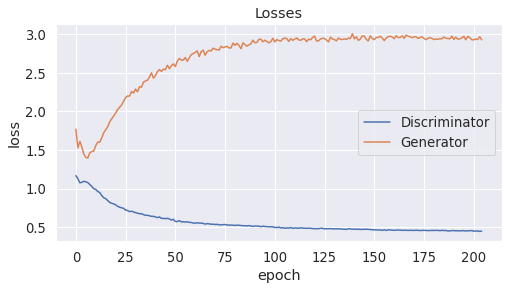

* Epoch 206/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.4465131070613861 gener loss= 2.9467016131401063 real score= 0.9318748898506165 fake score= 0.0679444413267076


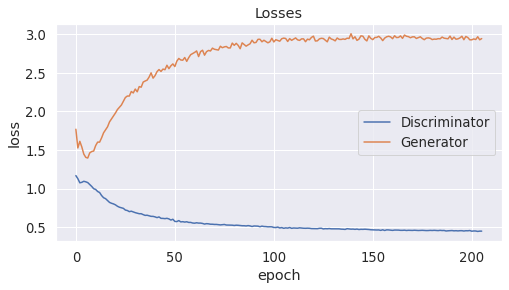

* Epoch 207/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.4491213551044464 gener loss= 2.9429403374671934 real score= 0.9321337176799774 fake score= 0.06733319707028568


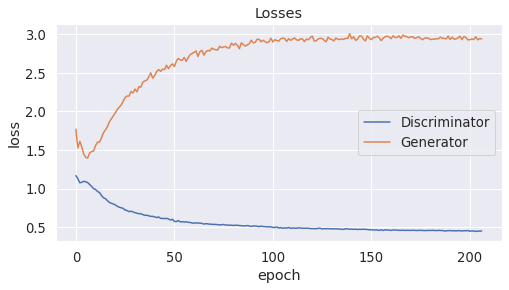

* Epoch 208/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.4443344244003296 gener loss= 2.9691291791915893 real score= 0.9327889135360717 fake score= 0.0665846709921956


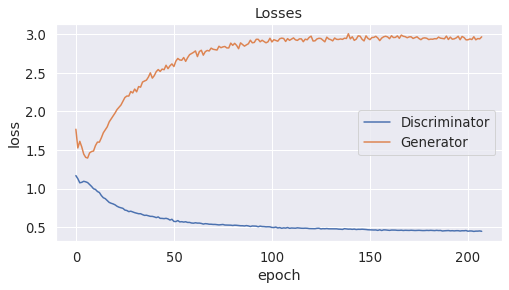

* Epoch 209/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.4420179462194443 gener loss= 2.9668345564842222 real score= 0.9345750549316406 fake score= 0.06540582160502673


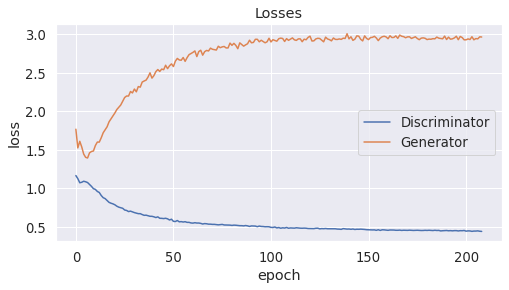

* Epoch 210/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.4465724042892456 gener loss= 2.942516611099243 real score= 0.9335400573730469 fake score= 0.06704015074521304


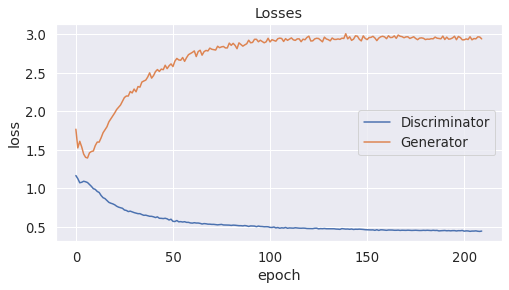

* Epoch 211/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.442519749045372 gener loss= 2.95787195482254 real score= 0.9338219398498535 fake score= 0.06539388377964496


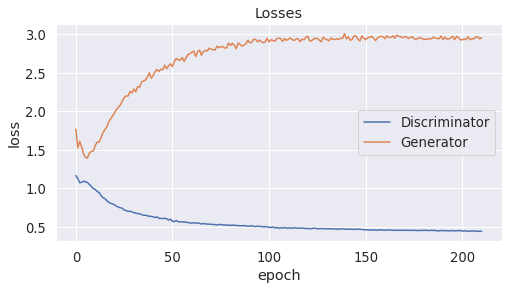

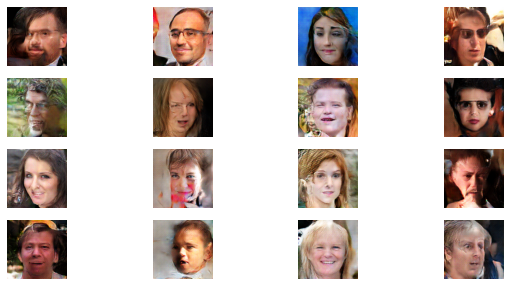

* Epoch 212/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.44506501188278197 gener loss= 2.9808636231422425 real score= 0.9338212121009827 fake score= 0.0662361025467515


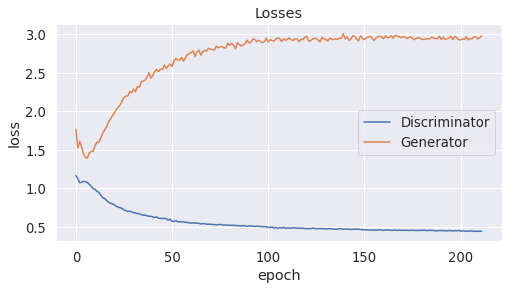

* Epoch 213/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.4453328197956085 gener loss= 2.983383849811554 real score= 0.9333513796806335 fake score= 0.06627684908136726


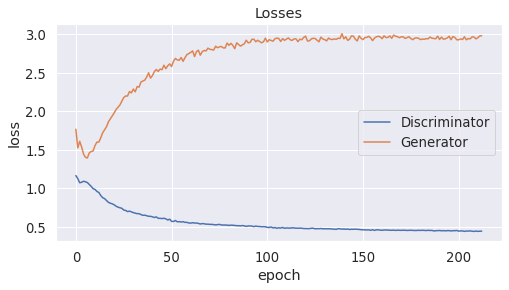

* Epoch 214/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.44415792224407197 gener loss= 2.9565594489097595 real score= 0.9332673592090607 fake score= 0.06640012513995171


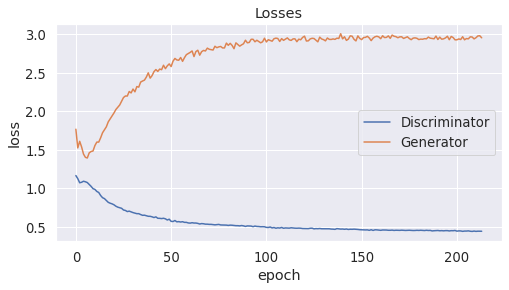

* Epoch 215/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.44402030804157255 gener loss= 2.9625110684394835 real score= 0.9342928039073944 fake score= 0.06563643807396292


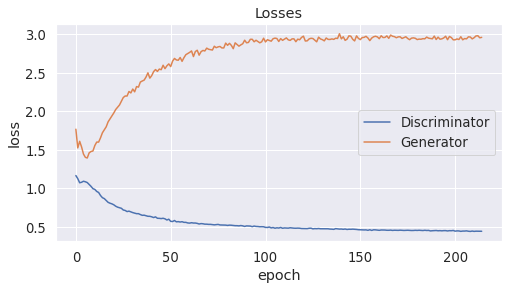

* Epoch 216/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.44511266934871674 gener loss= 2.941446854972839 real score= 0.934503423833847 fake score= 0.06565160985141992


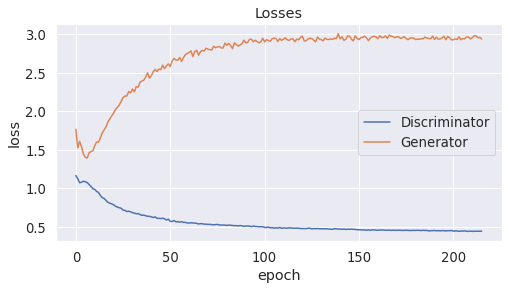

* Epoch 217/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.4432023577213287 gener loss= 2.9298821047782897 real score= 0.933820387506485 fake score= 0.06632759693339467


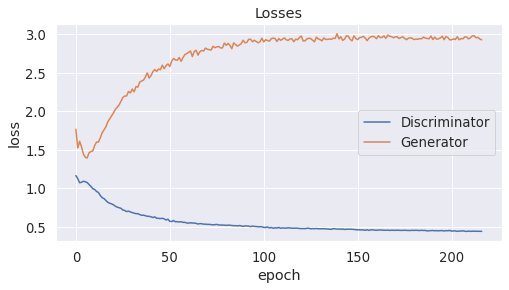

* Epoch 218/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.4426941366910934 gener loss= 2.9663753824234007 real score= 0.9335006432533264 fake score= 0.06565916552096605


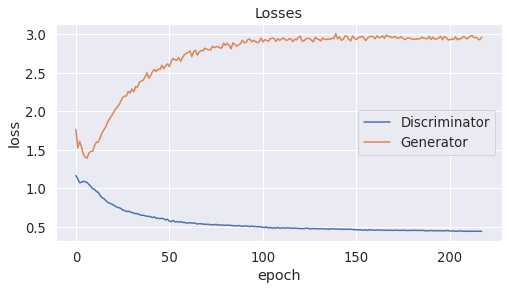

* Epoch 219/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.4435837755918503 gener loss= 2.9722615940093995 real score= 0.934109647846222 fake score= 0.06594857637435197


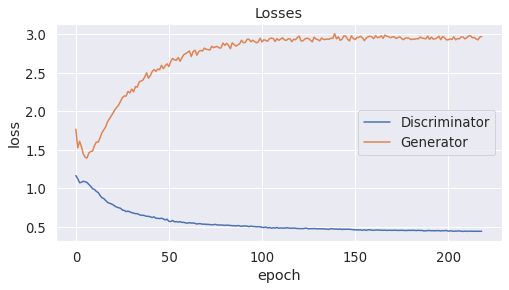

* Epoch 220/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.4449936464548111 gener loss= 2.94949743642807 real score= 0.9339697801589966 fake score= 0.06608365955725312


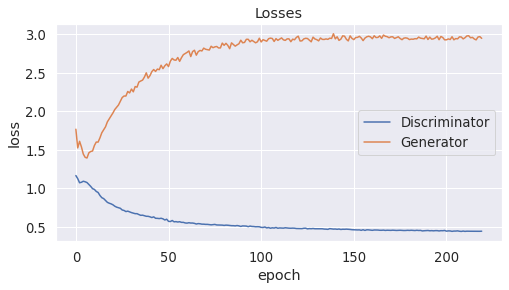

* Epoch 221/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.4450597526550293 gener loss= 2.9382271892547607 real score= 0.9338376110553741 fake score= 0.06608203912600875


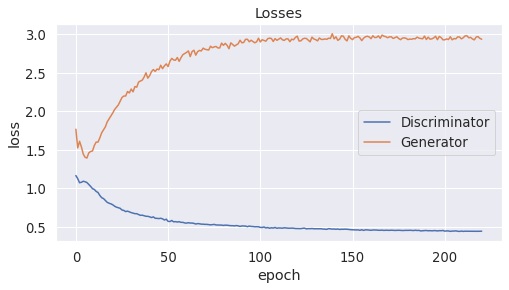

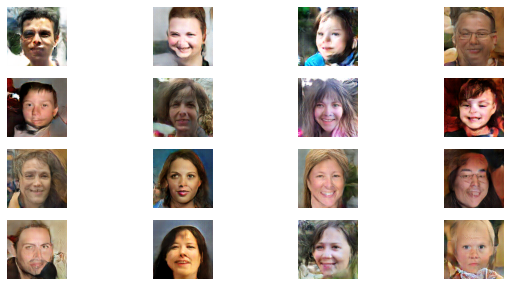

* Epoch 222/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.44548170998096465 gener loss= 2.944674668598175 real score= 0.9338578741550445 fake score= 0.06610060858726502


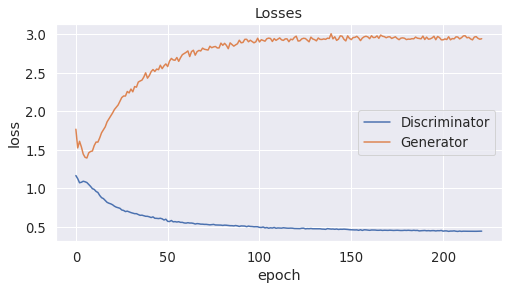

* Epoch 223/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.44266594114303587 gener loss= 2.971049288272858 real score= 0.9350987000465393 fake score= 0.06463669662028551


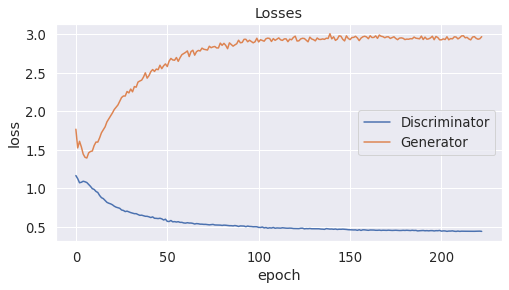

* Epoch 224/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.44370670006275176 gener loss= 2.9509545926094054 real score= 0.9337537471294403 fake score= 0.06645284779146314


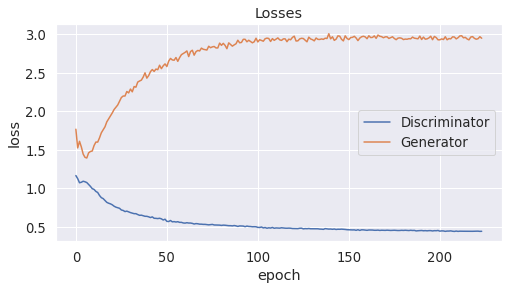

* Epoch 225/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.4486773755788803 gener loss= 2.9412413196563723 real score= 0.932582504415512 fake score= 0.06691857167109846


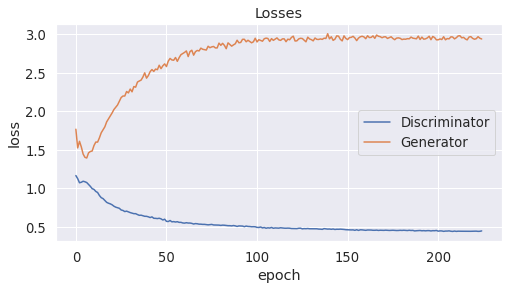

* Epoch 226/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.44274014542102813 gener loss= 2.955737235736847 real score= 0.9352848461151123 fake score= 0.06455149381235242


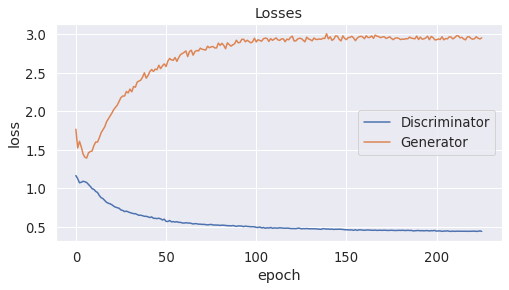

* Epoch 227/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.4426739290237427 gener loss= 2.927591442203522 real score= 0.9346411450862885 fake score= 0.06517058447599411


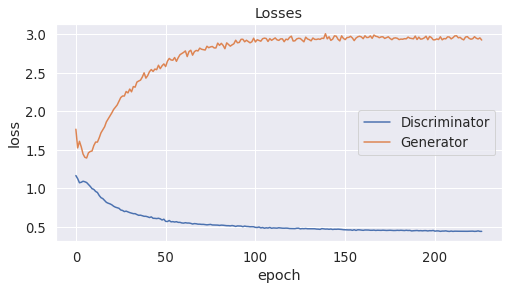

* Epoch 228/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.4392925563812256 gener loss= 2.954203639602661 real score= 0.9352438465595245 fake score= 0.06490432716980576


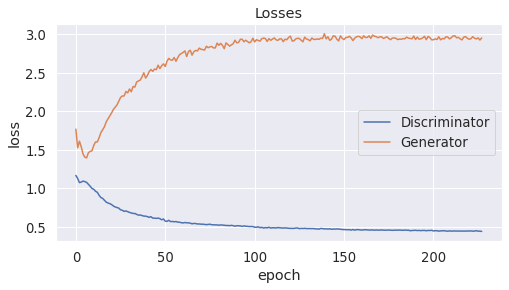

* Epoch 229/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.4460720240354538 gener loss= 2.9302094415664675 real score= 0.9338674845218659 fake score= 0.06695215446054935


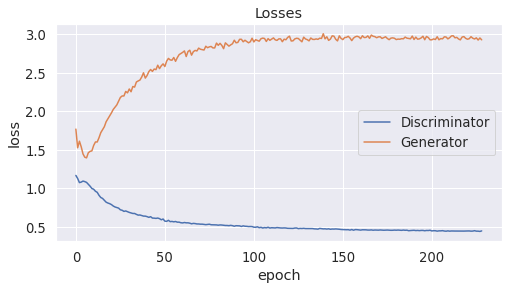

* Epoch 230/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.44311926577091215 gener loss= 2.9380560963630677 real score= 0.9338443424701691 fake score= 0.06538814556002617


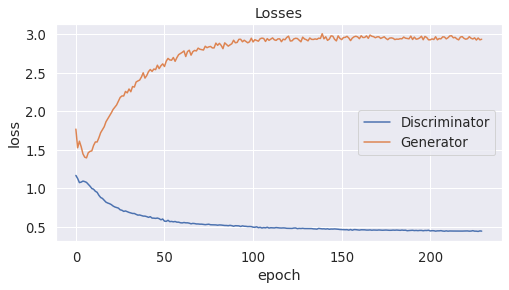

* Epoch 231/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.43990108988285065 gener loss= 2.95308852853775 real score= 0.935869024515152 fake score= 0.06483034621663392


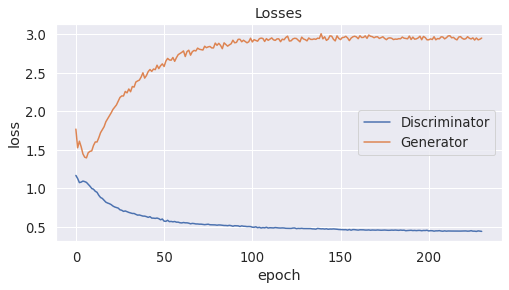

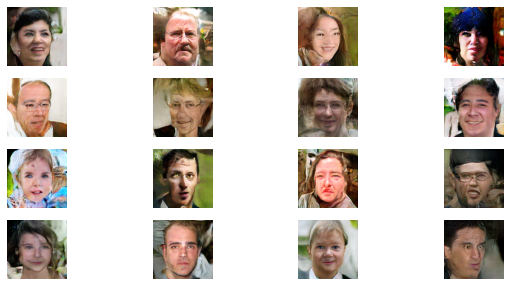

* Epoch 232/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.44194163315296175 gener loss= 2.9381113892555235 real score= 0.9350191859722138 fake score= 0.0645119093336165


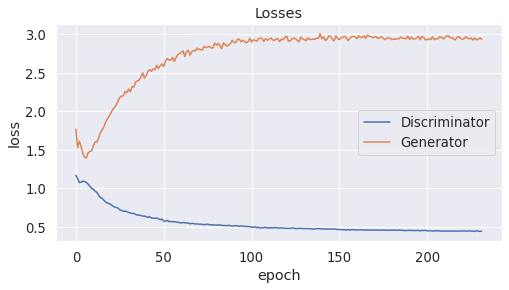

* Epoch 233/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.44224807538986205 gener loss= 2.9539855699539186 real score= 0.9341447685718537 fake score= 0.06543739431872964


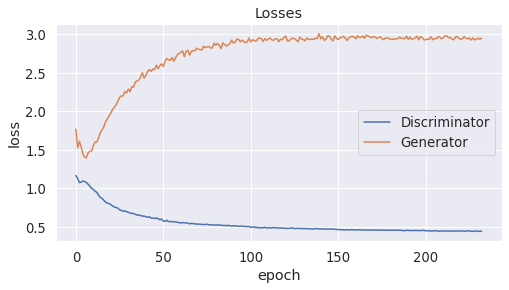

* Epoch 234/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.44212487115859983 gener loss= 2.9368100504875185 real score= 0.9343475650787354 fake score= 0.06565505709350108


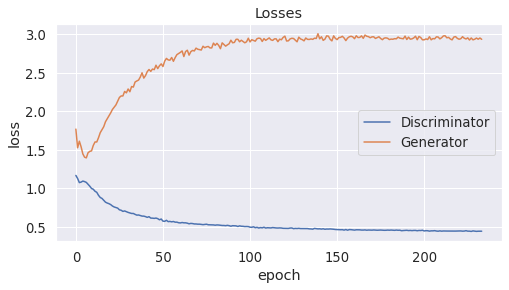

* Epoch 235/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.4400335178852081 gener loss= 2.939123379421234 real score= 0.9351631683349609 fake score= 0.0656185519605875


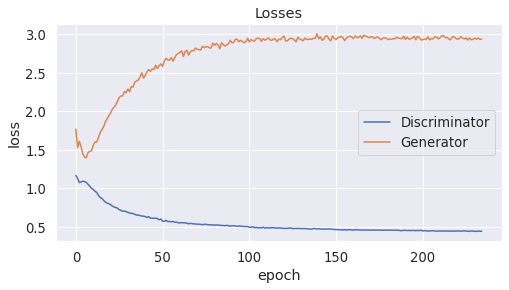

* Epoch 236/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.4423404679298401 gener loss= 2.9326213486671446 real score= 0.9355317144393921 fake score= 0.06473035748898982


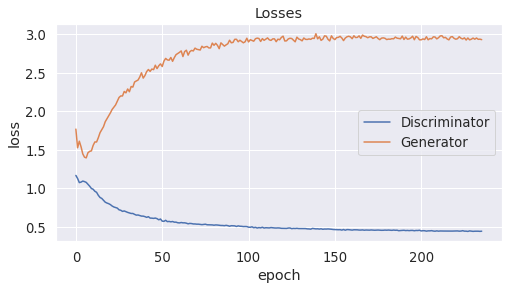

* Epoch 237/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.44093907153606415 gener loss= 2.9619636657714845 real score= 0.9344938845634461 fake score= 0.0651597917214036


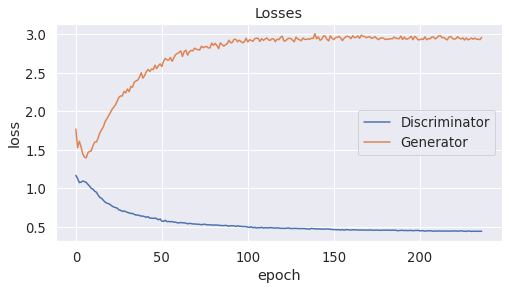

* Epoch 238/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.44194215121269226 gener loss= 2.946050858592987 real score= 0.9347363121032715 fake score= 0.06521973583400249


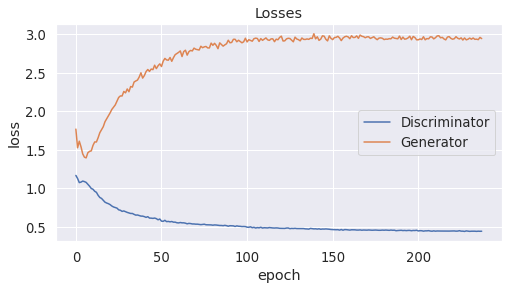

* Epoch 239/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.4422236879348755 gener loss= 2.962938425445557 real score= 0.9346635525703431 fake score= 0.06530929645821452


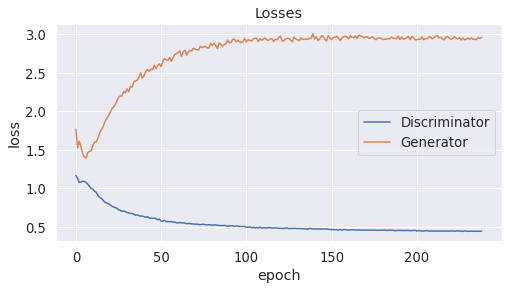

* Epoch 240/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.4408941736459732 gener loss= 2.9549872797966 real score= 0.9352155123710633 fake score= 0.06453311127945781


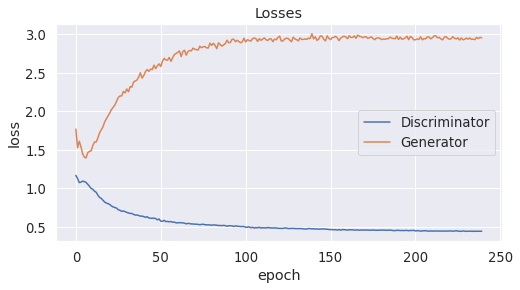

* Epoch 241/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.4413727184772491 gener loss= 2.93688512096405 real score= 0.9355715023040772 fake score= 0.06452720122784376


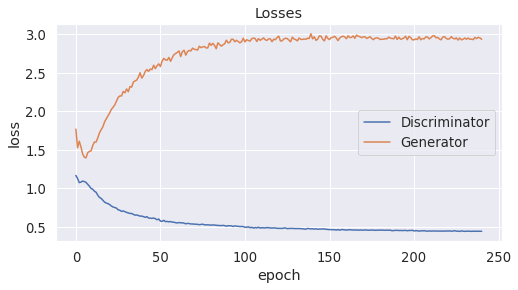

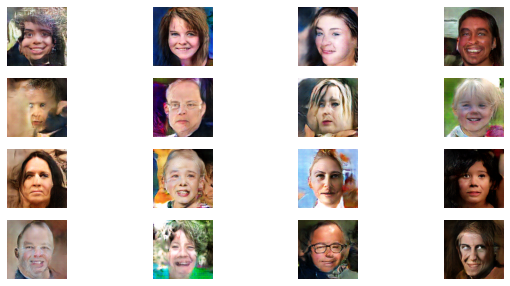

* Epoch 242/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.4406347992181778 gener loss= 2.9366075514793395 real score= 0.9347998397827149 fake score= 0.06508555017188192


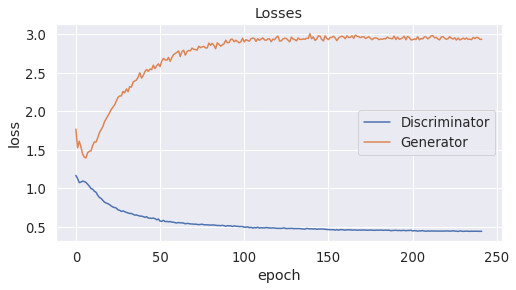

* Epoch 243/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.44132065026760103 gener loss= 2.9467967476844787 real score= 0.935748583984375 fake score= 0.06445686343833804


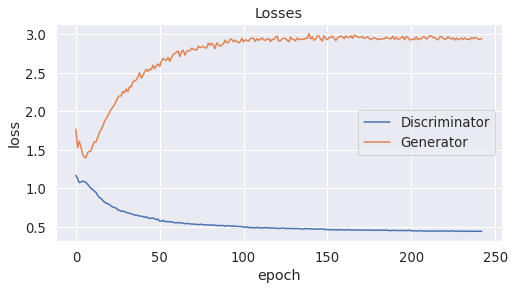

* Epoch 244/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.43881186609268186 gener loss= 2.9471994271278383 real score= 0.9349960978984833 fake score= 0.06530084464251995


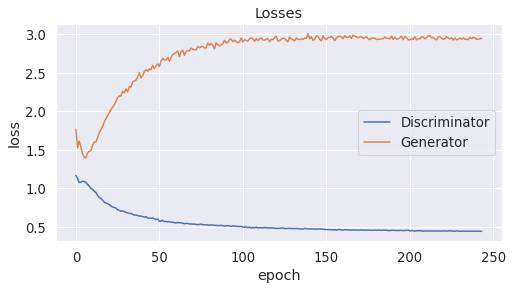

* Epoch 245/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.44048453373908997 gener loss= 2.9294623534202575 real score= 0.9355434353351593 fake score= 0.06482792302966117


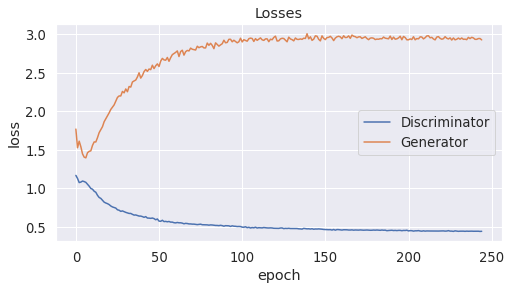

* Epoch 246/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.4400370317697525 gener loss= 2.9219778431892394 real score= 0.935338687324524 fake score= 0.06520062251016498


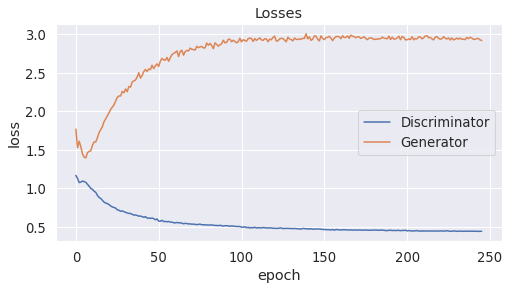

* Epoch 247/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.44087995467185975 gener loss= 2.9278552291870117 real score= 0.9353219006061554 fake score= 0.06504710222333669


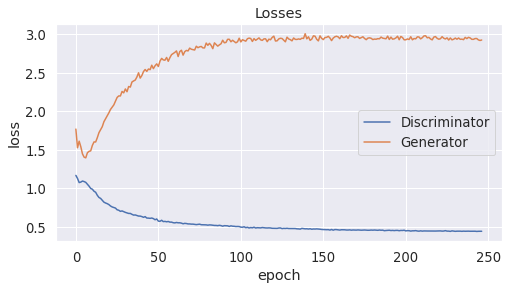

* Epoch 248/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.4395423905134201 gener loss= 2.9523073182106017 real score= 0.9365033146381379 fake score= 0.06479528253152966


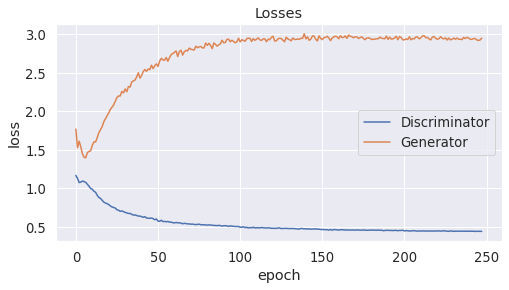

* Epoch 249/350
discr lr [6.561000000000002e-05]
gener lr [0.00013122000000000003]
discr loss= 0.43969645318984985 gener loss= 2.963267800617218 real score= 0.9351092053413391 fake score= 0.06480519420430064


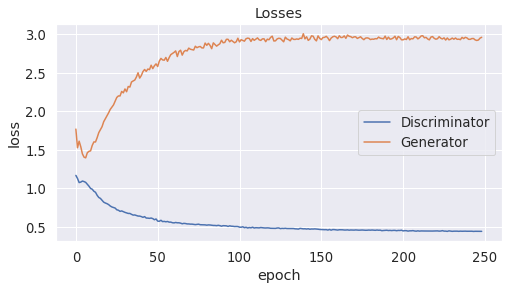

* Epoch 250/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.44141065919399264 gener loss= 2.963893471431732 real score= 0.935609211397171 fake score= 0.0644218508452177


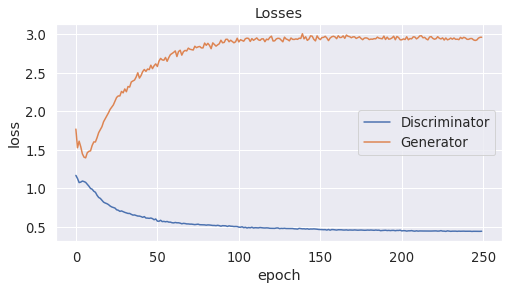

* Epoch 251/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.43751860597133635 gener loss= 2.938358082103729 real score= 0.9366224367141723 fake score= 0.06341020547747613


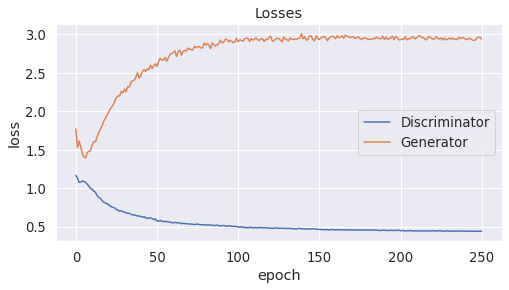

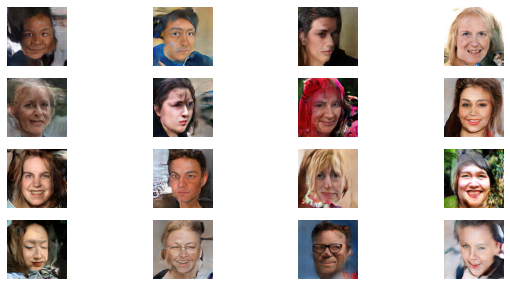

* Epoch 252/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.4347645827293396 gener loss= 2.9323435353279113 real score= 0.9371135351657868 fake score= 0.0630257650114596


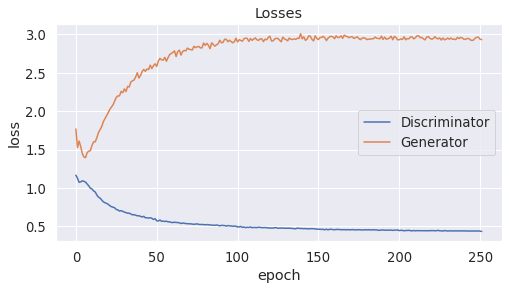

* Epoch 253/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.4333349058866501 gener loss= 2.9659869627952578 real score= 0.9373760679721832 fake score= 0.062470132963359355


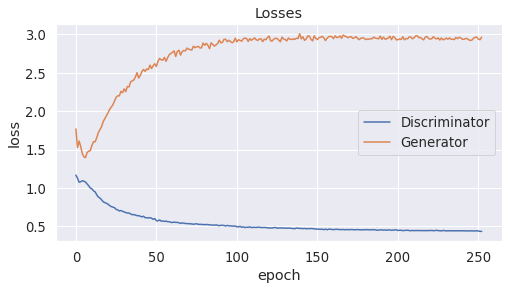

* Epoch 254/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.43767561371326447 gener loss= 2.9466587018013 real score= 0.9361890089511872 fake score= 0.06418316898569465


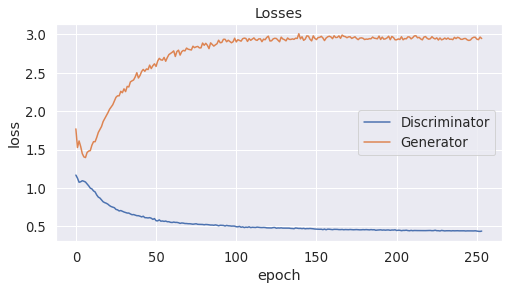

* Epoch 255/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.43760808622837066 gener loss= 2.960585062789917 real score= 0.9363360740661621 fake score= 0.06323429200351238


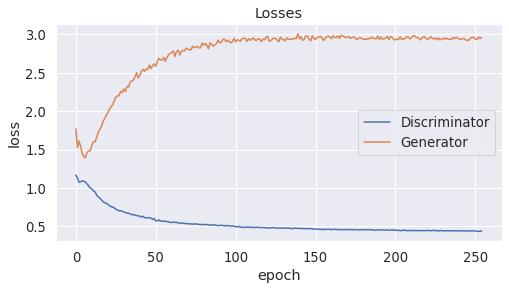

* Epoch 256/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.43433898932933807 gener loss= 2.940125811481476 real score= 0.9371063869953156 fake score= 0.06269641456827521


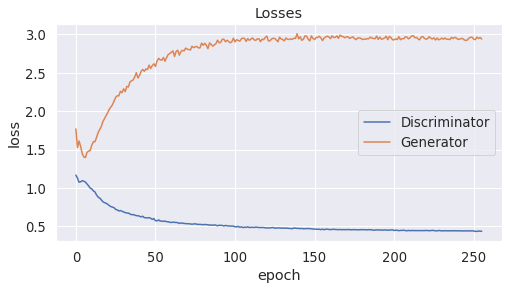

* Epoch 257/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.437149024271965 gener loss= 2.9431996550559996 real score= 0.9370844091892242 fake score= 0.06299532217904925


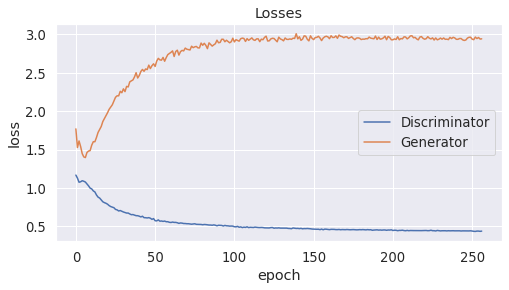

* Epoch 258/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.43501714198589325 gener loss= 2.951843433380127 real score= 0.9366725384235383 fake score= 0.06312427533939481


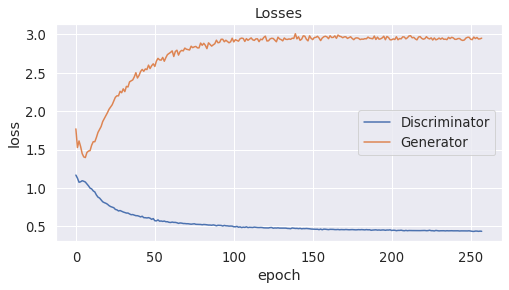

* Epoch 259/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.4364599916934967 gener loss= 2.962279820728302 real score= 0.9365769759654998 fake score= 0.06233027441725135


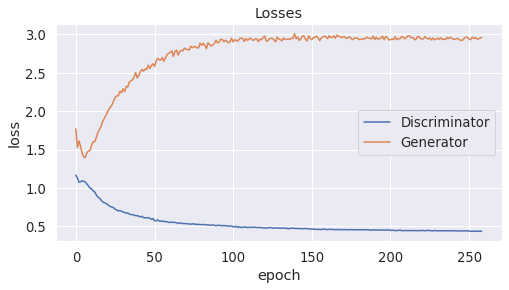

* Epoch 260/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.4376985980272293 gener loss= 2.9534761062622072 real score= 0.9368743642807007 fake score= 0.0640192704245448


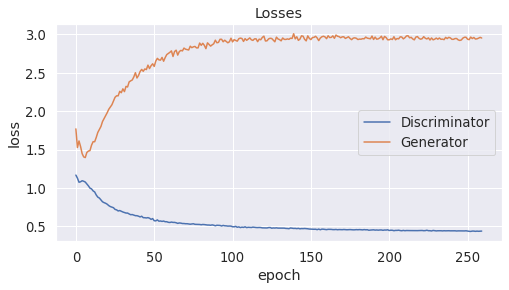

* Epoch 261/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.43378271703720095 gener loss= 2.9795973212242126 real score= 0.9375876657485962 fake score= 0.06267867069616914


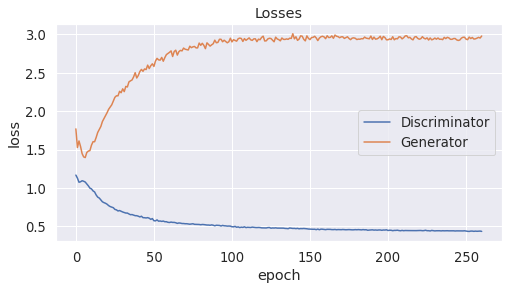

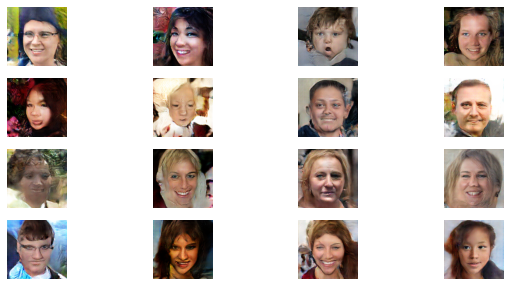

* Epoch 262/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.43335615487098694 gener loss= 2.9326224683761595 real score= 0.9374965734958649 fake score= 0.06221449047997594


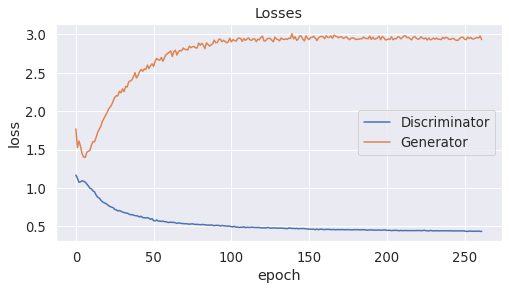

* Epoch 263/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.43765478525161744 gener loss= 2.935327640724182 real score= 0.9367883889198303 fake score= 0.06356693706661463


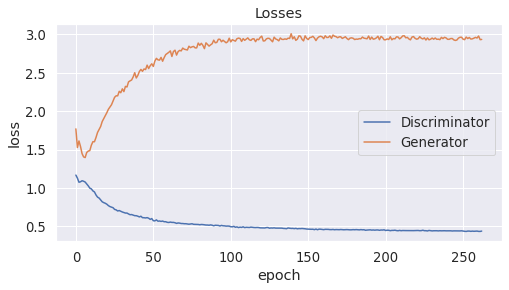

* Epoch 264/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.4347081072807312 gener loss= 2.9370027907371523 real score= 0.9370469606399536 fake score= 0.06330737269669771


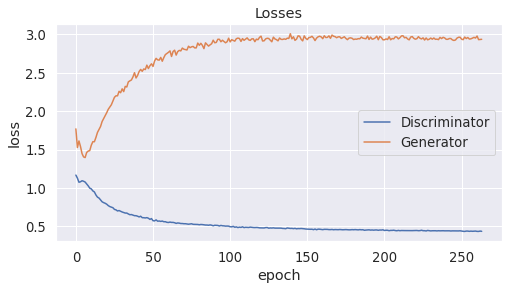

* Epoch 265/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.4337451568365097 gener loss= 2.9624923144340514 real score= 0.9374479407310485 fake score= 0.06260537362918257


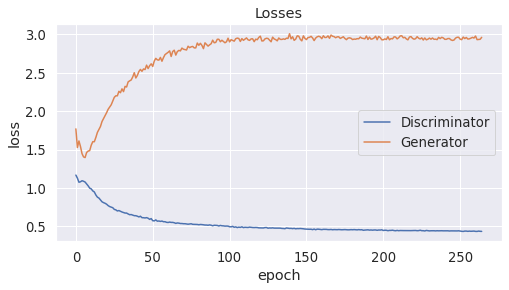

* Epoch 266/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.43330123088359834 gener loss= 2.9247048754692075 real score= 0.9376385873317719 fake score= 0.06291866844519972


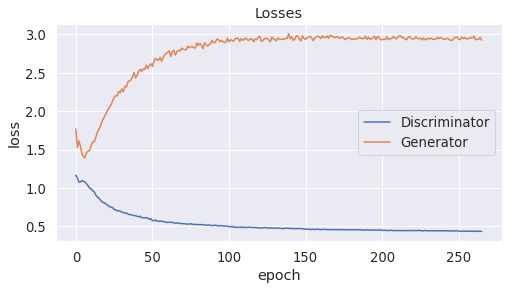

* Epoch 267/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.43438560042381286 gener loss= 2.9664424531936646 real score= 0.9365942747592926 fake score= 0.06327417654842138


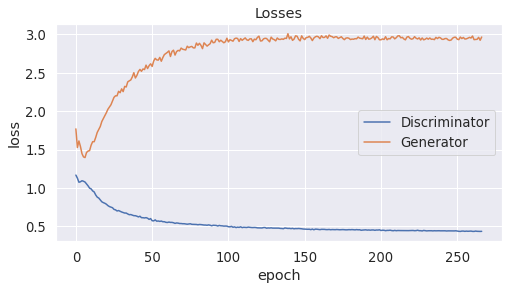

* Epoch 268/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.4311336078166962 gener loss= 2.9371883546829225 real score= 0.9384843484401703 fake score= 0.0617878010161221


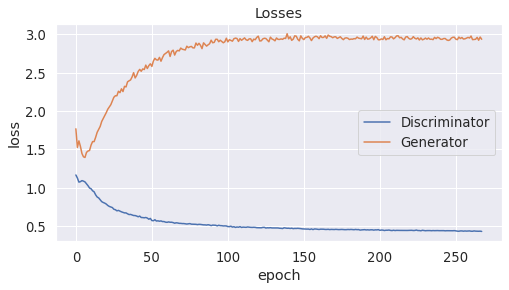

* Epoch 269/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.4361146054029465 gener loss= 2.9463559867858886 real score= 0.9367988605976105 fake score= 0.06253525843322277


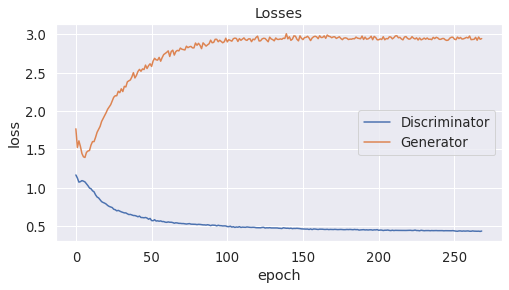

* Epoch 270/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.434091032910347 gener loss= 2.919893668746948 real score= 0.937068105840683 fake score= 0.06296625155508519


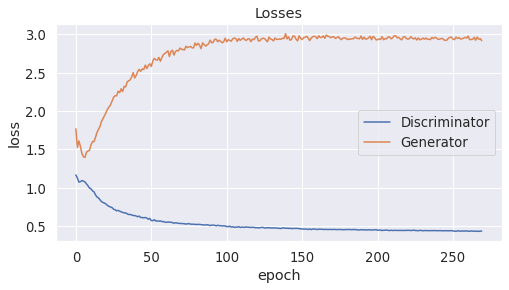

* Epoch 271/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.43634629695415494 gener loss= 2.9306919827461244 real score= 0.9375289668560028 fake score= 0.06332088955119253


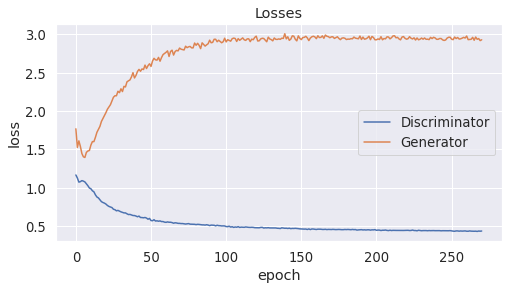

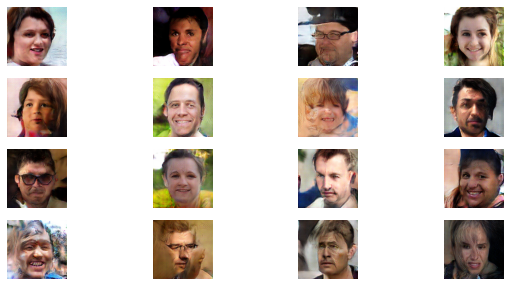

* Epoch 272/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.4326765326023102 gener loss= 2.933899516773224 real score= 0.9380238829135895 fake score= 0.06256275039315223


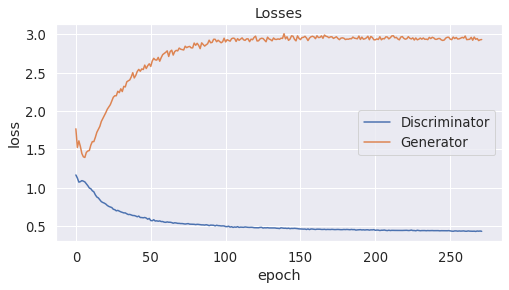

* Epoch 273/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.43612519569396974 gener loss= 2.9825140745162964 real score= 0.9366653444290162 fake score= 0.0626161436393857


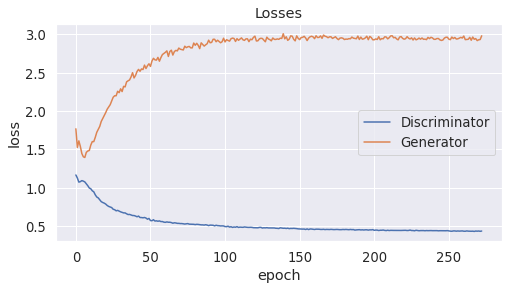

* Epoch 274/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.43788099565505983 gener loss= 2.921566755390167 real score= 0.936741415309906 fake score= 0.06318889660835265


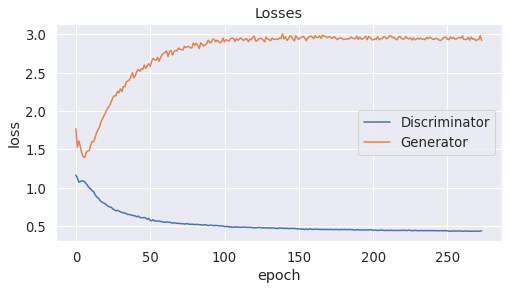

* Epoch 275/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.43591807765960694 gener loss= 2.897082897186279 real score= 0.9378547242641448 fake score= 0.06286113335862756


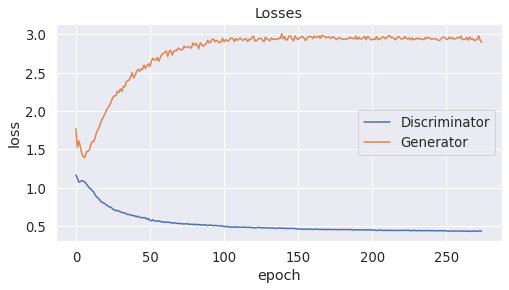

* Epoch 276/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.4366893122911453 gener loss= 2.9446806186676024 real score= 0.9372435288906097 fake score= 0.06258999325335025


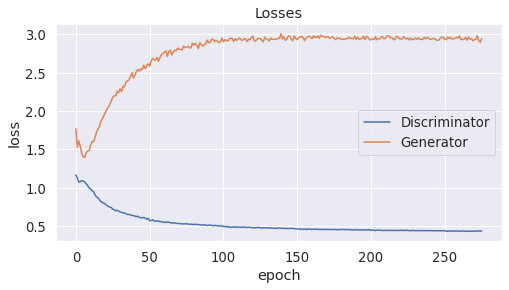

* Epoch 277/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.4368853546142578 gener loss= 2.937715274143219 real score= 0.937021085691452 fake score= 0.06308816270381212


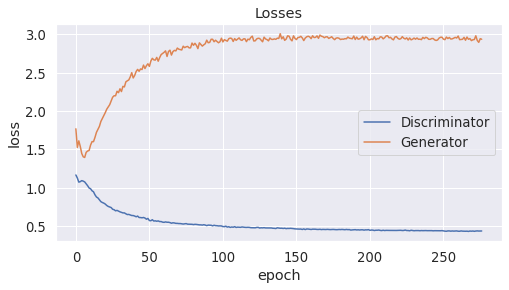

* Epoch 278/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.4334643726110458 gener loss= 2.9545843852996825 real score= 0.9368433446407318 fake score= 0.06305268393233418


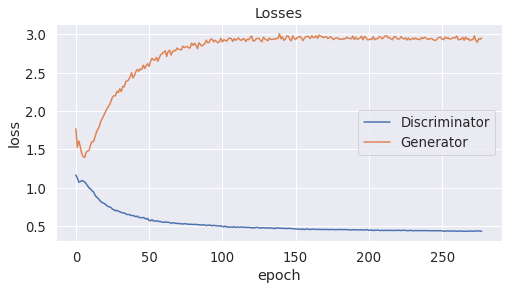

* Epoch 279/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.43315167355537415 gener loss= 2.9475759828567507 real score= 0.9369259777545929 fake score= 0.061926058581471446


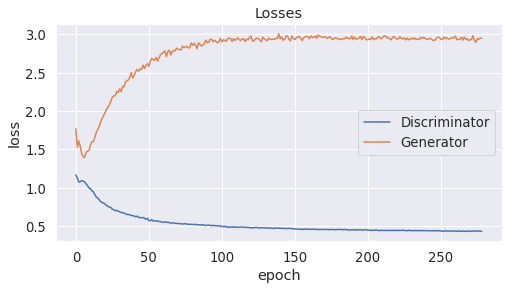

* Epoch 280/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.4345109423160553 gener loss= 2.955305342197418 real score= 0.9370960261821747 fake score= 0.06166396504566073


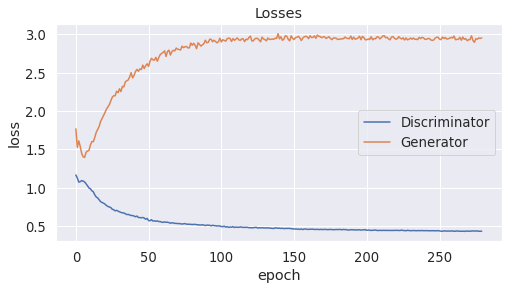

* Epoch 281/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.4324990481853485 gener loss= 2.9592742440223696 real score= 0.9372052792072296 fake score= 0.06277505619972944


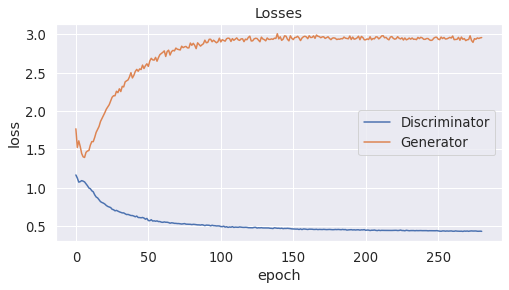

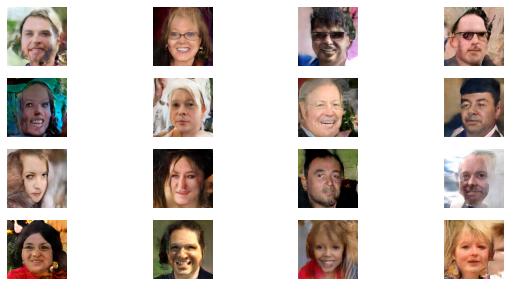

* Epoch 282/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.43201712629795075 gener loss= 2.9566704502105714 real score= 0.9386161964893341 fake score= 0.06145598846003413


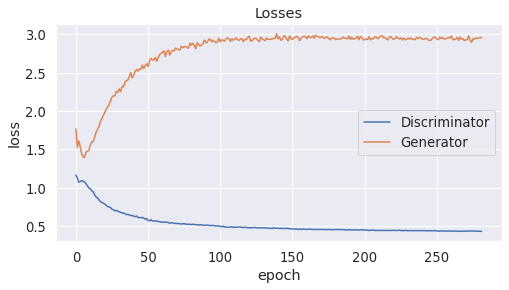

* Epoch 283/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.43333918454647063 gener loss= 2.9585415218353273 real score= 0.9373893408298493 fake score= 0.06276595273166895


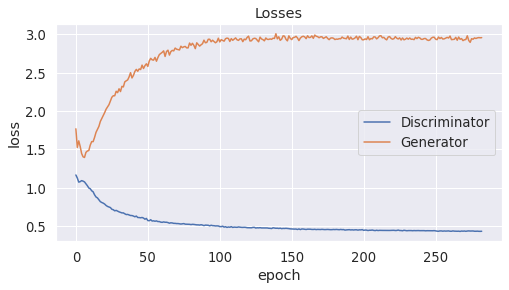

* Epoch 284/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.4324802263021469 gener loss= 2.950448392868042 real score= 0.9375899837493896 fake score= 0.06219796701446176


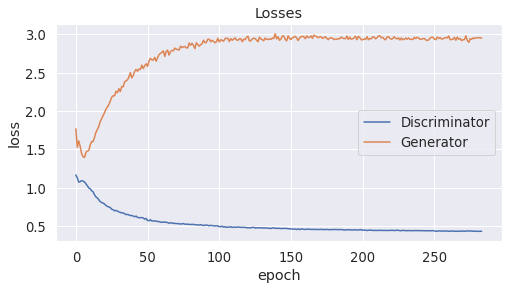

* Epoch 285/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.4356234792470932 gener loss= 2.9336462456703187 real score= 0.9375799380302429 fake score= 0.06233149283826351


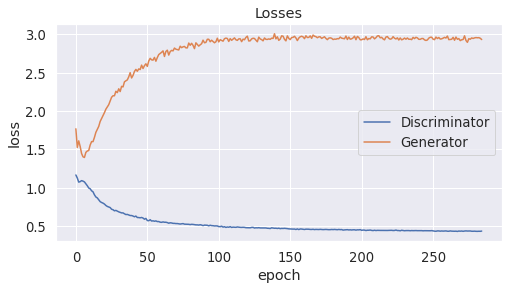

* Epoch 286/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.4343436900615692 gener loss= 2.945126405620575 real score= 0.9373225602149964 fake score= 0.062432075014710424


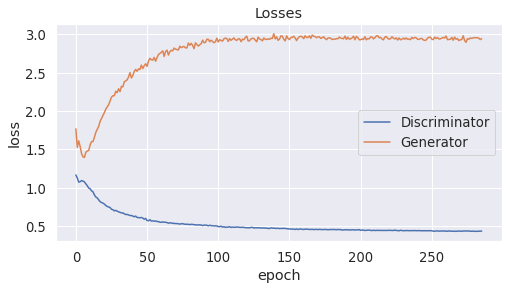

* Epoch 287/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.4331105137825012 gener loss= 2.9383772269248962 real score= 0.9378746640205383 fake score= 0.06235852232053876


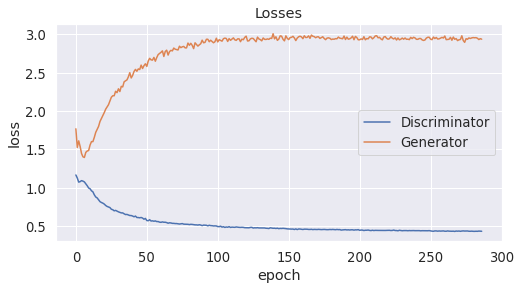

* Epoch 288/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.4326280867099762 gener loss= 2.9557184525489806 real score= 0.9378265507698059 fake score= 0.0626144393518567


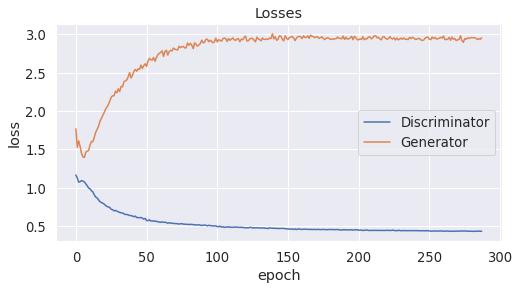

* Epoch 289/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.4322309129238129 gener loss= 2.9538432070732115 real score= 0.9384612400054931 fake score= 0.061621131321787835


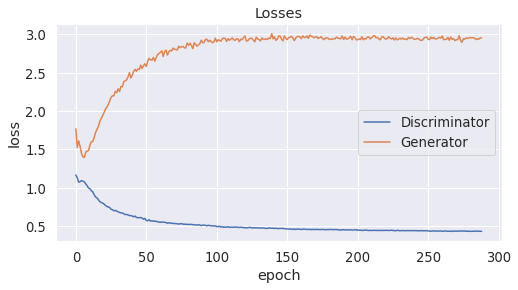

* Epoch 290/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.4344025106191635 gener loss= 2.9480971096992494 real score= 0.9370784296512604 fake score= 0.06276156162992119


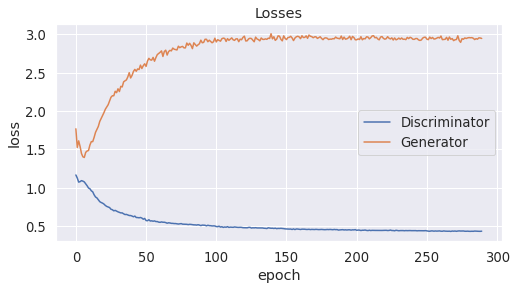

* Epoch 291/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.4322447540283203 gener loss= 2.950636101913452 real score= 0.9378849541664124 fake score= 0.06203587077111006


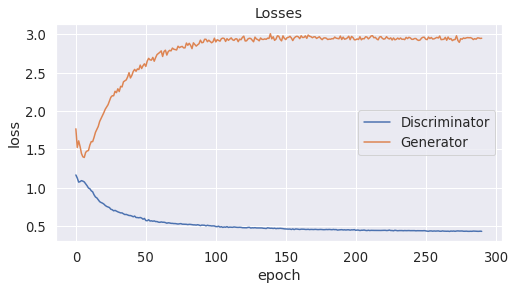

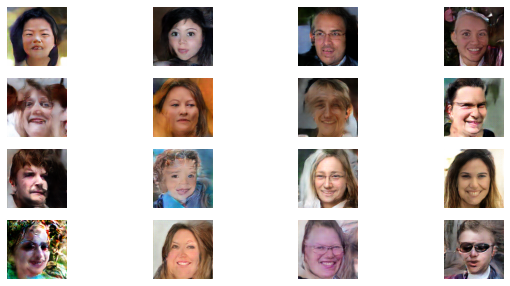

* Epoch 292/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.4313839411020279 gener loss= 2.92288452501297 real score= 0.9385641321182251 fake score= 0.061611151892691854


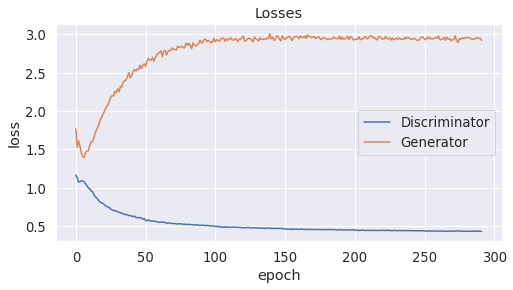

* Epoch 293/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.4340524785995483 gener loss= 2.9236077872276307 real score= 0.9378410425662994 fake score= 0.06157328973263502


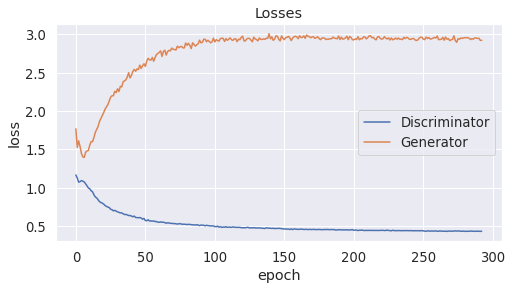

* Epoch 294/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.43534221332073214 gener loss= 2.943247380256653 real score= 0.9370083816528321 fake score= 0.06297623298913241


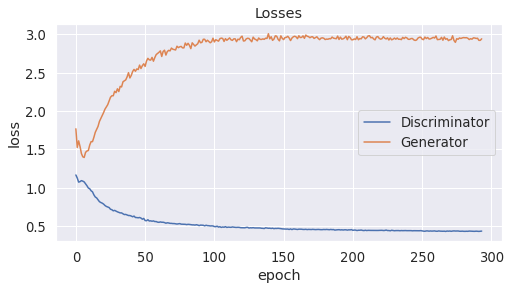

* Epoch 295/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.43216759943962096 gener loss= 2.9499577313423155 real score= 0.9377570124149323 fake score= 0.062469919526576996


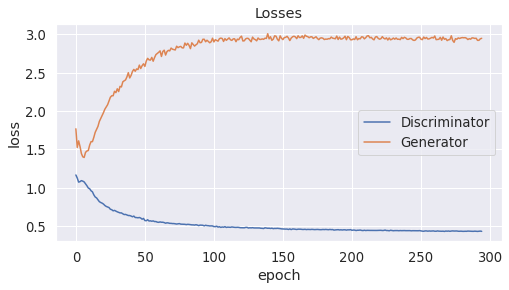

* Epoch 296/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.4349301532268524 gener loss= 2.9579315186500548 real score= 0.9378689774036407 fake score= 0.06205562074929476


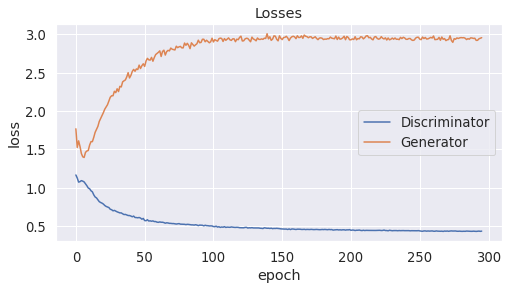

* Epoch 297/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.4331290789604187 gener loss= 2.952659591770172 real score= 0.93833447432518 fake score= 0.06194513226673007


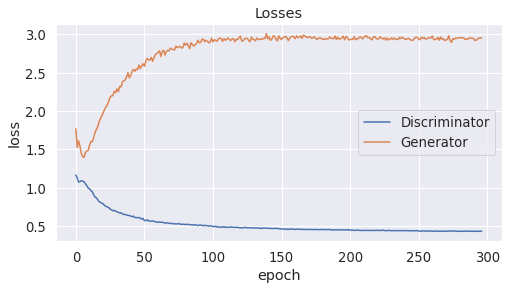

* Epoch 298/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.4339124704837799 gener loss= 2.9495925779342653 real score= 0.9379701781272888 fake score= 0.062289557486772534


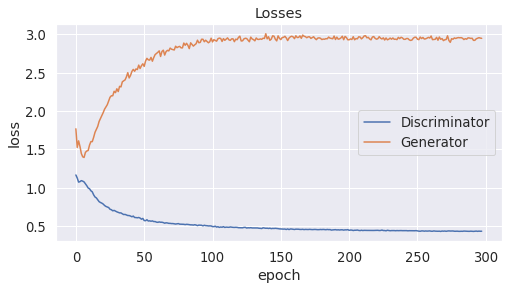

* Epoch 299/350
discr lr [5.904900000000002e-05]
gener lr [0.00011809800000000003]
discr loss= 0.4337544623374939 gener loss= 2.9455246103286745 real score= 0.9379758602619171 fake score= 0.06216201300173998


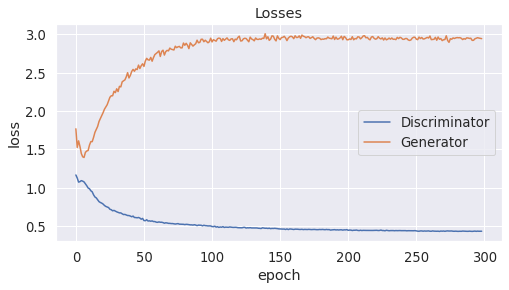

* Epoch 300/350
discr lr [4.782969000000002e-05]
gener lr [9.565938000000004e-05]
discr loss= 0.43407093214988707 gener loss= 2.931519629383087 real score= 0.9372332064628601 fake score= 0.06272274626120924


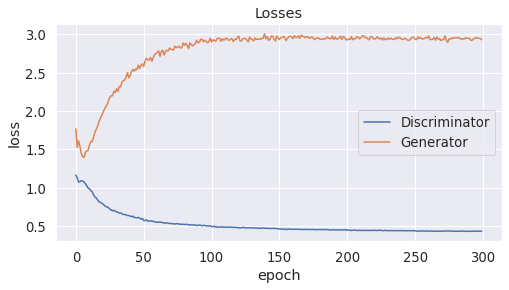

* Epoch 301/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.4310785206079483 gener loss= 2.945506370449066 real score= 0.938418620300293 fake score= 0.060811671618372205


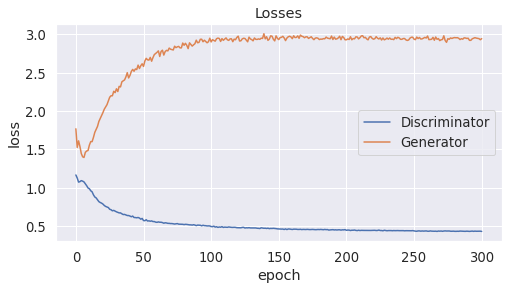

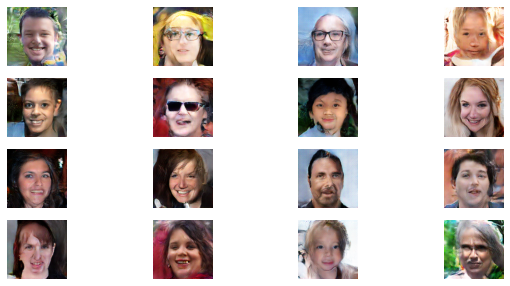

* Epoch 302/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.43145438215732573 gener loss= 2.926261702632904 real score= 0.9382991814613342 fake score= 0.061365803350508216


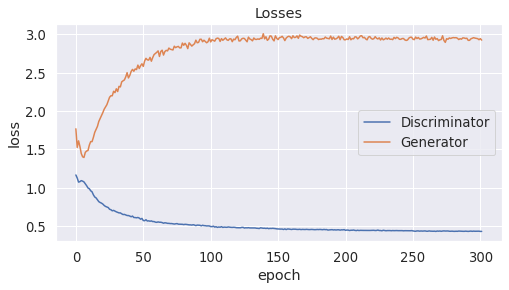

* Epoch 303/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.4299289650440216 gener loss= 2.928651465702057 real score= 0.9388140249252319 fake score= 0.06139598491191864


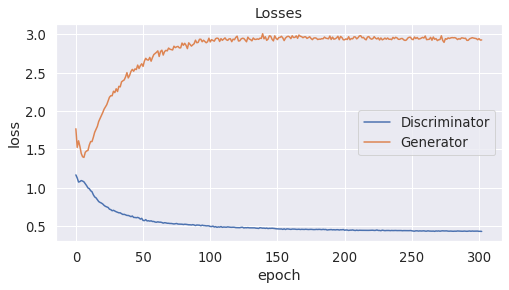

* Epoch 304/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.43184188973903653 gener loss= 2.947078275680542 real score= 0.939319504737854 fake score= 0.06085818132832646


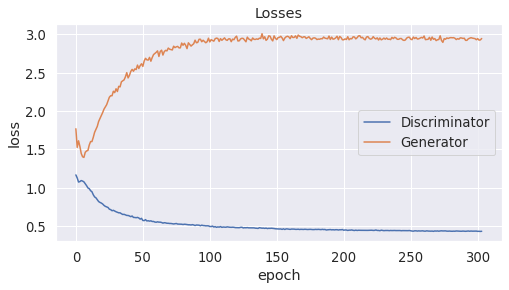

* Epoch 305/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.4316104262828827 gener loss= 2.957789035511017 real score= 0.9380586639881134 fake score= 0.061892837281525136


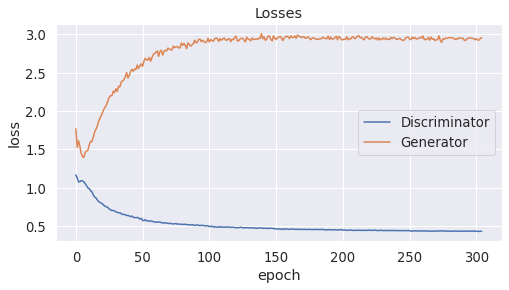

* Epoch 306/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.4290161217212677 gener loss= 2.9263000110626223 real score= 0.9391567046642304 fake score= 0.060878943252563475


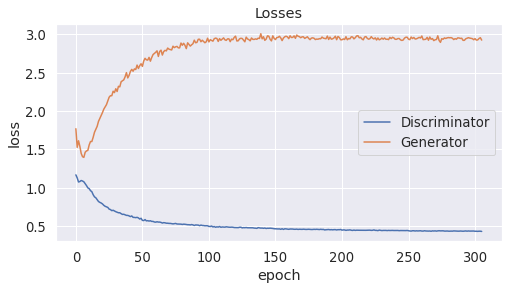

* Epoch 307/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.42868478968143464 gener loss= 2.9462383534431456 real score= 0.9392752494335175 fake score= 0.06066078104823828


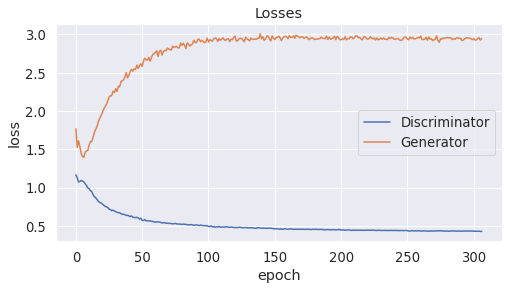

* Epoch 308/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.4316813855171204 gener loss= 2.9336520203590393 real score= 0.9386090135574341 fake score= 0.06139368282482028


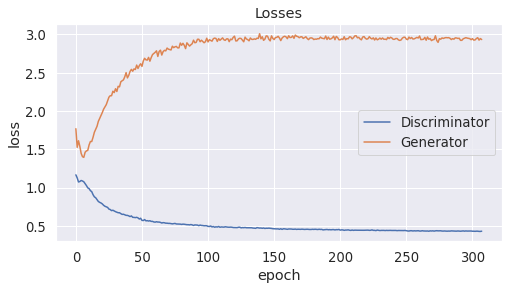

* Epoch 309/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.43132155132293704 gener loss= 2.9282367378234864 real score= 0.939025155544281 fake score= 0.061112127926200625


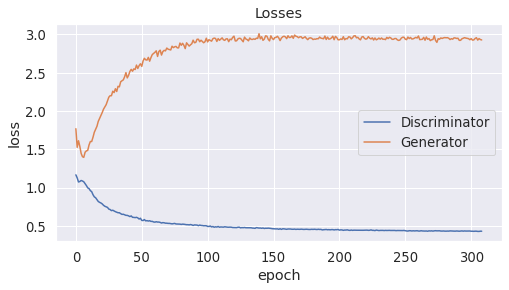

* Epoch 310/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.4294896376371384 gener loss= 2.947923635864258 real score= 0.9391782590389252 fake score= 0.06117099944278598


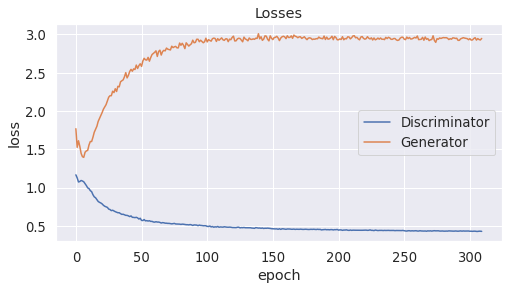

* Epoch 311/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.43046391261816025 gener loss= 2.952749350643158 real score= 0.9388475620746612 fake score= 0.06094901755824685


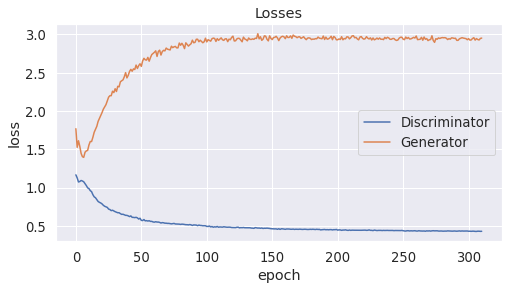

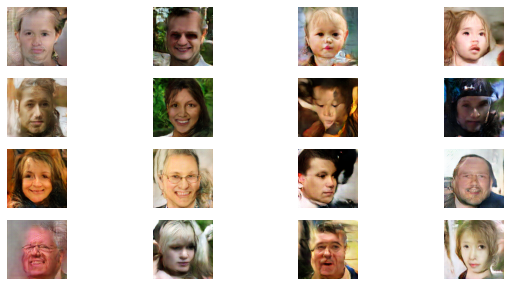

* Epoch 312/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.4317838290691376 gener loss= 2.9352267316818237 real score= 0.9391453342437744 fake score= 0.06112158695682883


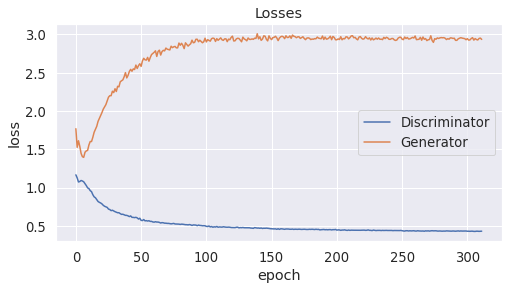

* Epoch 313/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.4315548376083374 gener loss= 2.931083026218414 real score= 0.9388396416664123 fake score= 0.06098970498591662


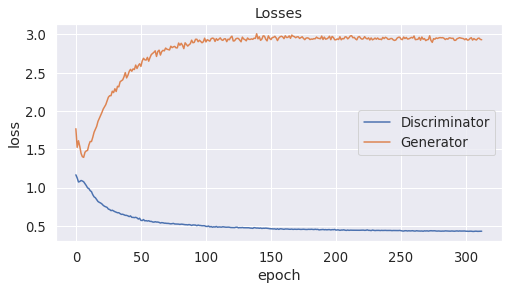

* Epoch 314/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.4318145321846008 gener loss= 2.916930134487152 real score= 0.9390800207614899 fake score= 0.061391793569177386


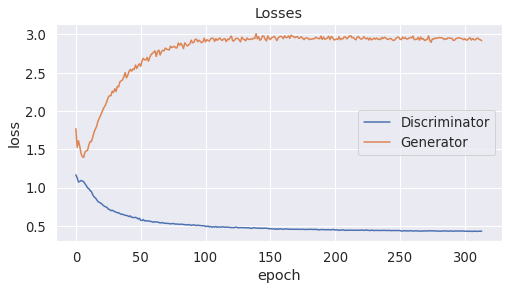

* Epoch 315/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.4264312211751938 gener loss= 2.87763293094635 real score= 0.9402268075466156 fake score= 0.0602788024276495


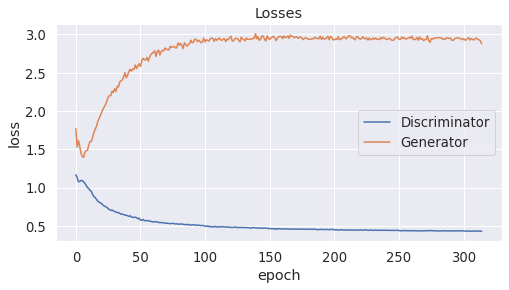

* Epoch 316/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.42759119884967806 gener loss= 2.920637775039673 real score= 0.9394516298770904 fake score= 0.0613576731659472


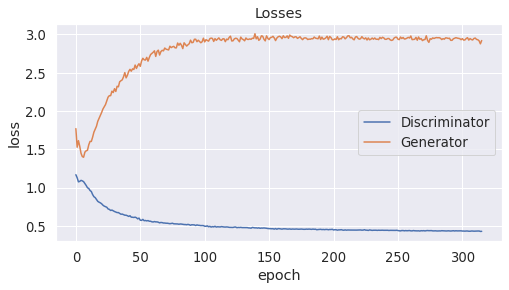

* Epoch 317/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.42735905725955964 gener loss= 2.950736691856384 real score= 0.9388709874153137 fake score= 0.06067731076925993


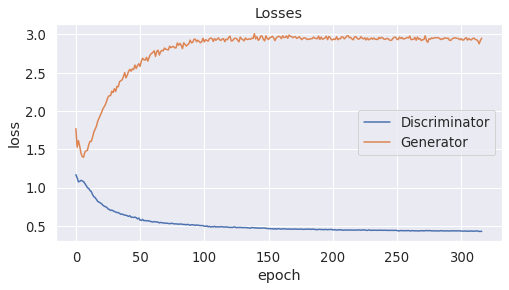

* Epoch 318/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.42889831418991087 gener loss= 2.93842296667099 real score= 0.9396108271121979 fake score= 0.060144949807971713


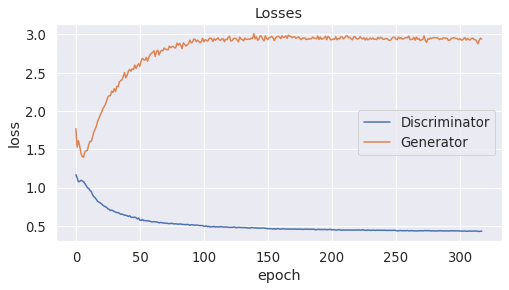

* Epoch 319/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.428943785071373 gener loss= 2.9354543511390685 real score= 0.9395026099681855 fake score= 0.06037168968617916


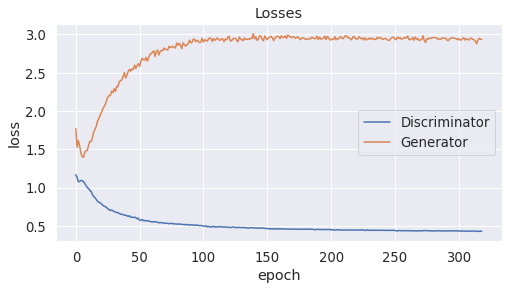

* Epoch 320/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.4288623622655868 gener loss= 2.9200797668457033 real score= 0.9397213205814362 fake score= 0.06077983878925443


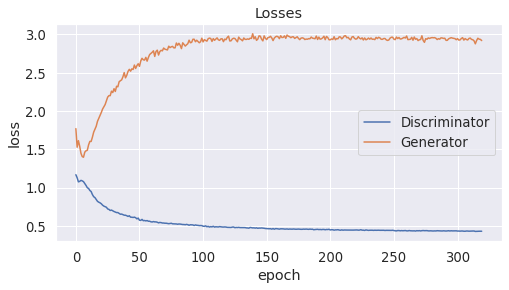

* Epoch 321/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.430227241230011 gener loss= 2.9164549724578857 real score= 0.9390062508106232 fake score= 0.061599561055004595


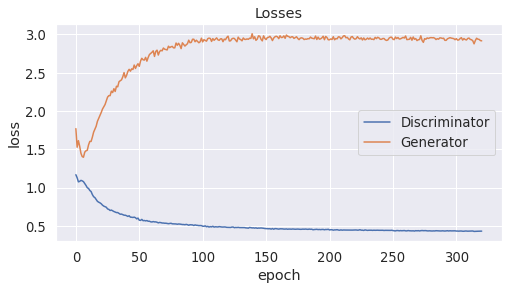

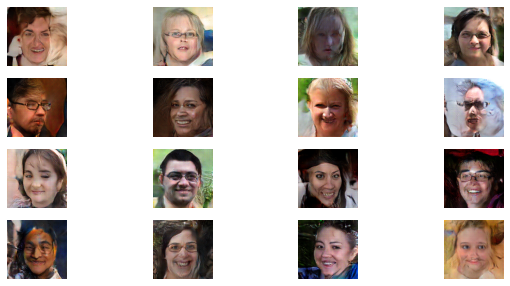

* Epoch 322/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.42655288195610047 gener loss= 2.919795286464691 real score= 0.9395482570648194 fake score= 0.06045534318611026


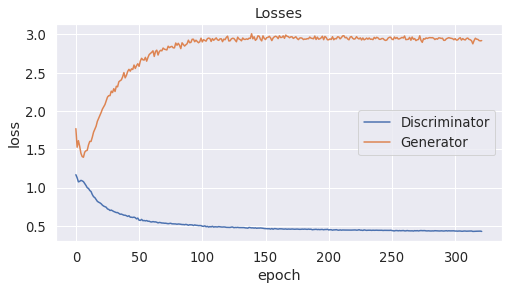

* Epoch 323/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.4292726456165314 gener loss= 2.9409141394615173 real score= 0.9389110565662384 fake score= 0.06146827594190836


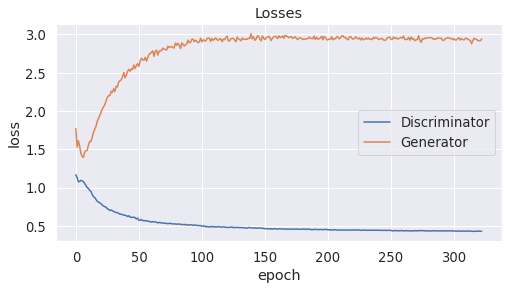

* Epoch 324/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.4284271475315094 gener loss= 2.940953769874573 real score= 0.9391418071746827 fake score= 0.06058421477302909


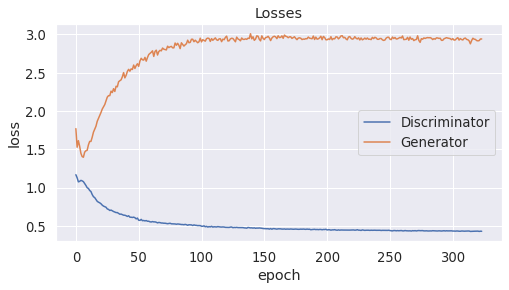

* Epoch 325/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.42970984625816344 gener loss= 2.9288742610931395 real score= 0.939331604385376 fake score= 0.06059084475710988


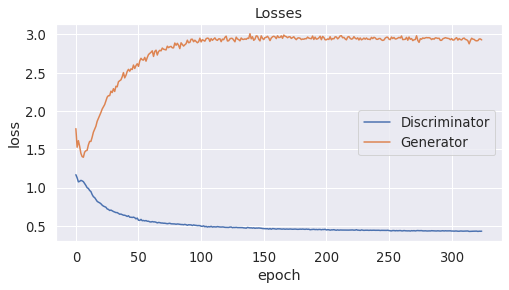

* Epoch 326/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.42854732451438904 gener loss= 2.928378061771393 real score= 0.9387822968482972 fake score= 0.06173096125051379


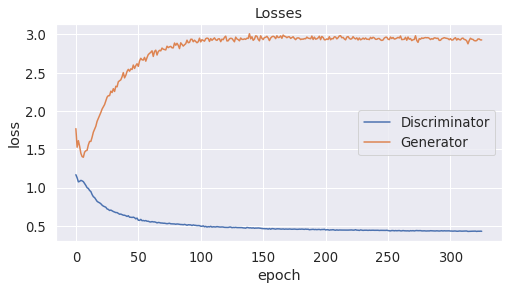

* Epoch 327/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.42651819763183596 gener loss= 2.91401133852005 real score= 0.9400560741901398 fake score= 0.06019474705159664


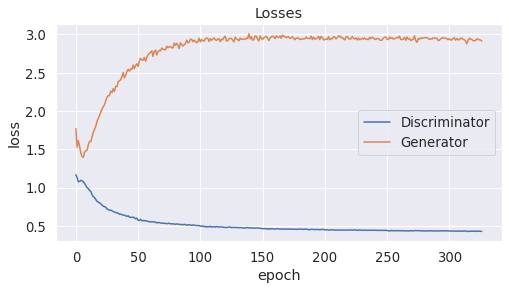

* Epoch 328/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.43047658677101136 gener loss= 2.946618712234497 real score= 0.9382945213317871 fake score= 0.06133566324710846


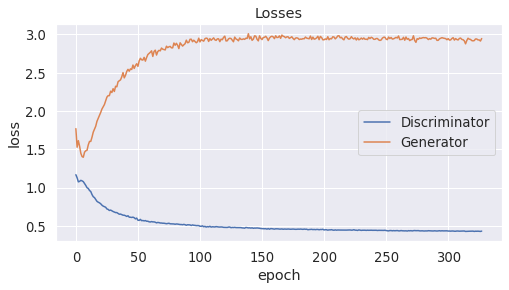

* Epoch 329/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.4295382670879364 gener loss= 2.944622716808319 real score= 0.9396482198238373 fake score= 0.060490442949533464


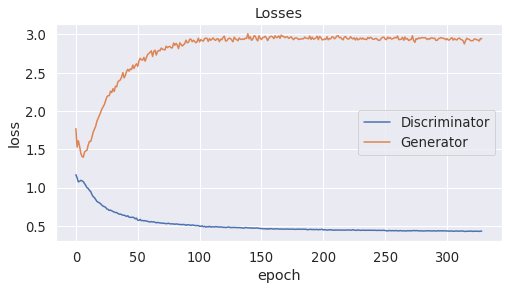

* Epoch 330/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.42786307063102724 gener loss= 2.903399084854126 real score= 0.9397445014953614 fake score= 0.06043528622761369


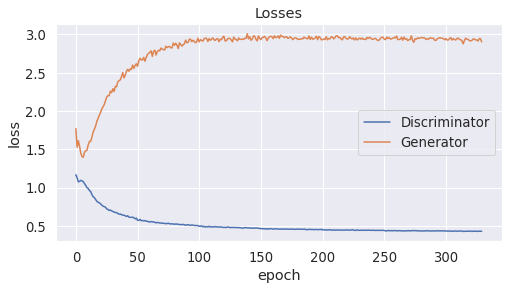

* Epoch 331/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.4267353229522705 gener loss= 2.9140023776054385 real score= 0.9396208734035492 fake score= 0.06011375689730048


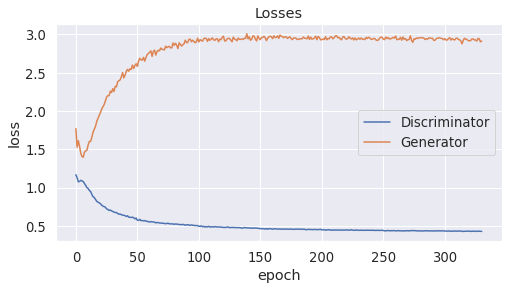

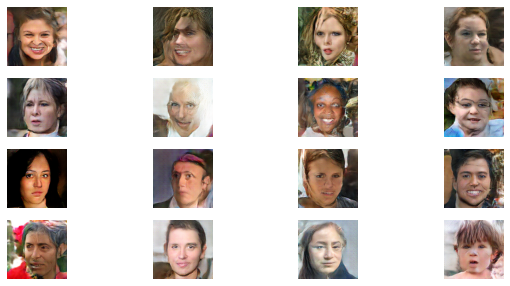

* Epoch 332/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.42801128067970273 gener loss= 2.9155519424438476 real score= 0.9396180869102478 fake score= 0.06034397127404809


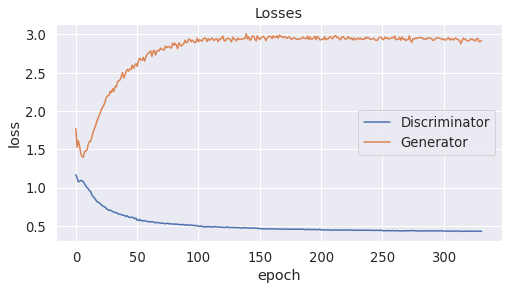

* Epoch 333/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.426841842854023 gener loss= 2.9226097224235534 real score= 0.9402501982688903 fake score= 0.060422056049108504


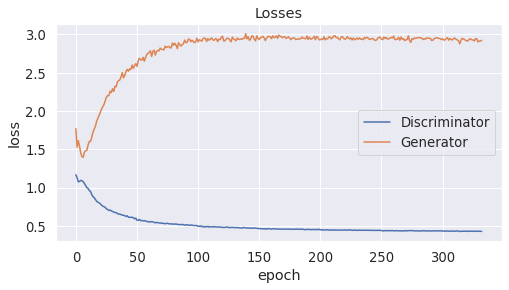

* Epoch 334/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.4288822526693344 gener loss= 2.9534941953659057 real score= 0.9391031177043915 fake score= 0.06048191877380014


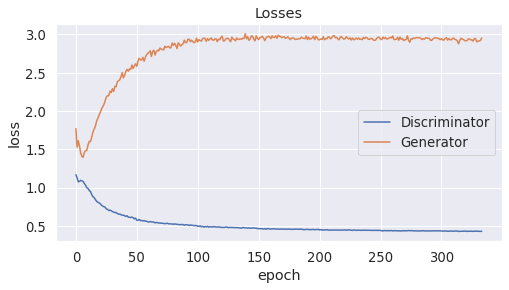

* Epoch 335/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.4291976681470871 gener loss= 2.931035024738312 real score= 0.9389660814762115 fake score= 0.060479111801832915


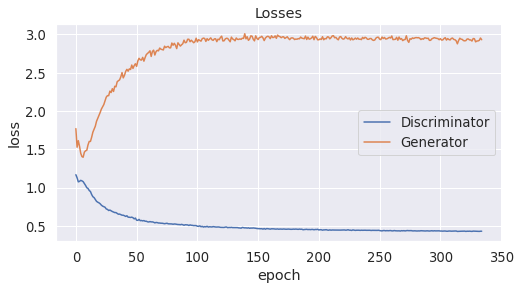

* Epoch 336/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.4267122986316681 gener loss= 2.958101126098633 real score= 0.939595090675354 fake score= 0.06072227213084698


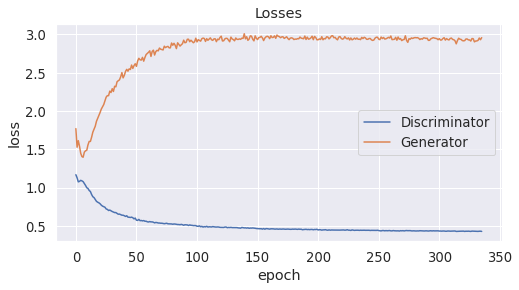

* Epoch 337/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.4294482882738113 gener loss= 2.9437944736480715 real score= 0.9396284320354462 fake score= 0.060792871890217065


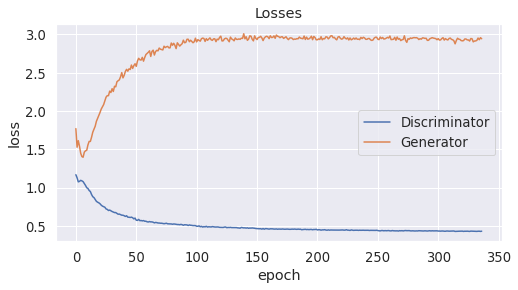

* Epoch 338/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.4275049722671509 gener loss= 2.9276347018241884 real score= 0.9396308860301972 fake score= 0.060553192868083715


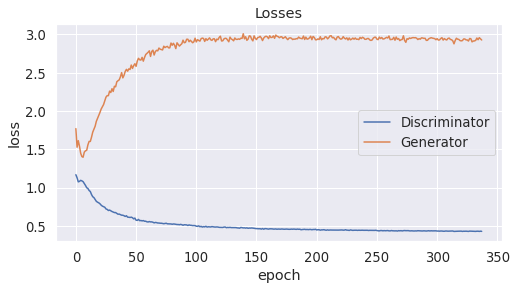

* Epoch 339/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.42637979338169096 gener loss= 2.92804378490448 real score= 0.9395250767707825 fake score= 0.06004871037006378


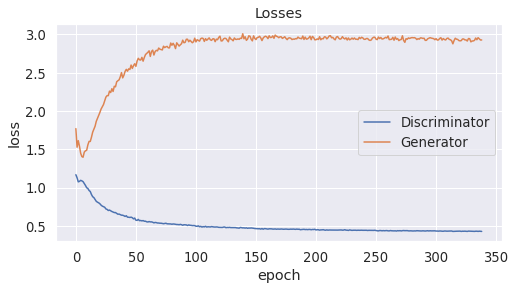

* Epoch 340/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.42811546633243563 gener loss= 2.941243447780609 real score= 0.940671659708023 fake score= 0.05975387061238289


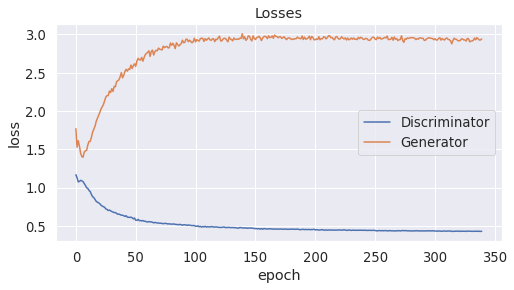

* Epoch 341/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.42790684223175046 gener loss= 2.929505566883087 real score= 0.9393819551467896 fake score= 0.060669827695935964


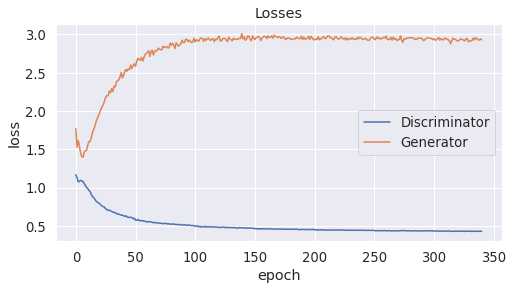

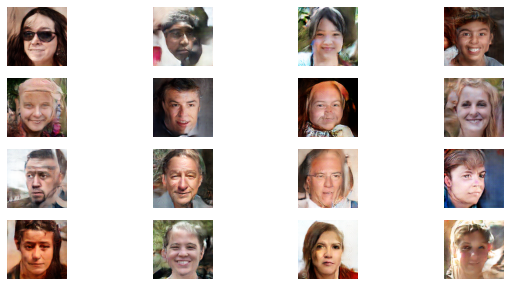

* Epoch 342/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.4271269932985306 gener loss= 2.9155554522514344 real score= 0.9395990074157715 fake score= 0.06012021904140711


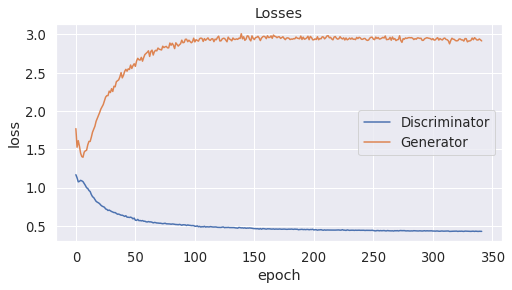

* Epoch 343/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.4276924827814102 gener loss= 2.945911653995514 real score= 0.9393416295051574 fake score= 0.05996516534090042


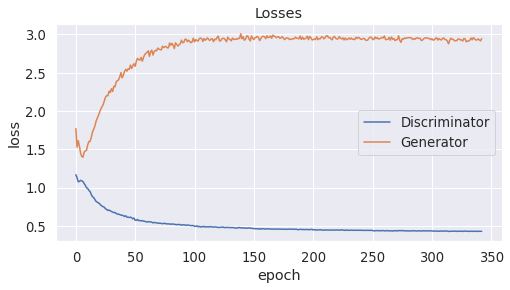

* Epoch 344/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.42988208208084105 gener loss= 2.909548348903656 real score= 0.9393684104442597 fake score= 0.060749839954823255


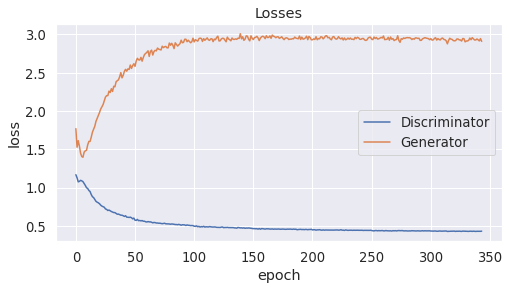

* Epoch 345/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.4289963938474655 gener loss= 2.8944288660049438 real score= 0.9403167493343353 fake score= 0.059951759786903855


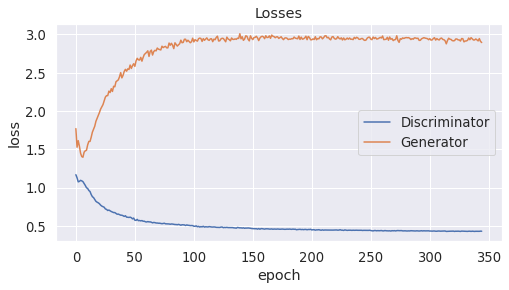

* Epoch 346/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.42746978945732117 gener loss= 2.9293982005119323 real score= 0.9397634474754334 fake score= 0.06073408595174551


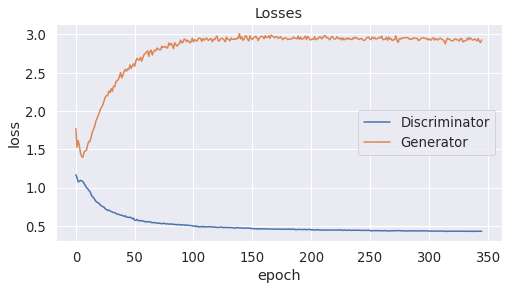

* Epoch 347/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.42615732860565186 gener loss= 2.939653901576996 real score= 0.9392459740161896 fake score= 0.05998897464126349


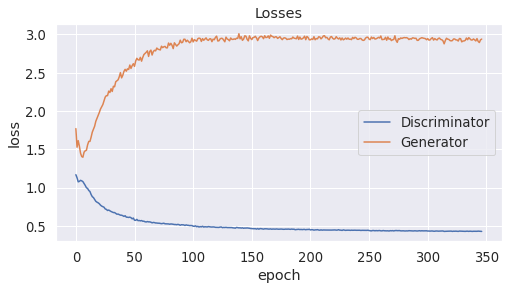

* Epoch 348/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.4267116090774536 gener loss= 2.908828112220764 real score= 0.9401230131626129 fake score= 0.06015477686226368


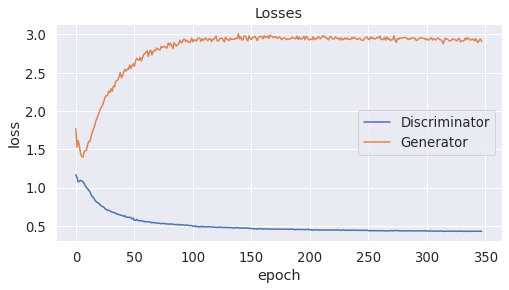

* Epoch 349/350
discr lr [5.314410000000002e-05]
gener lr [0.00010628820000000004]
discr loss= 0.4262116176366806 gener loss= 2.9203263551712038 real score= 0.9396720180034638 fake score= 0.06001429423540831


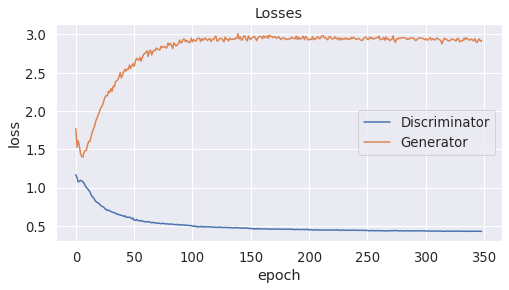

* Epoch 350/350
discr lr [4.304672100000002e-05]
gener lr [8.609344200000004e-05]
discr loss= 0.42829281623363497 gener loss= 2.919897508239746 real score= 0.940101251077652 fake score= 0.06031055430620909


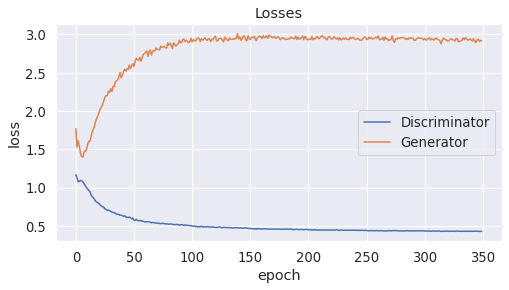

In [ ]:
loss_discr_1, loss_gener_1, real_score_1, fake_score_1 = fit(model, criterion, 350, 0.0001, 0.0002)

Построю графики для лосса и скора

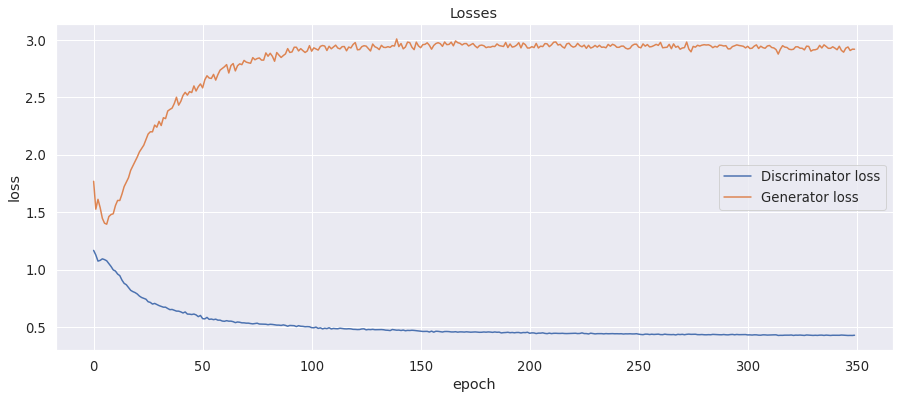

In [ ]:
plt.figure(figsize=(15, 6))
plt.plot(loss_discr_1, '-')
plt.plot(loss_gener_1, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator loss', 'Generator loss'])
plt.title('Losses');

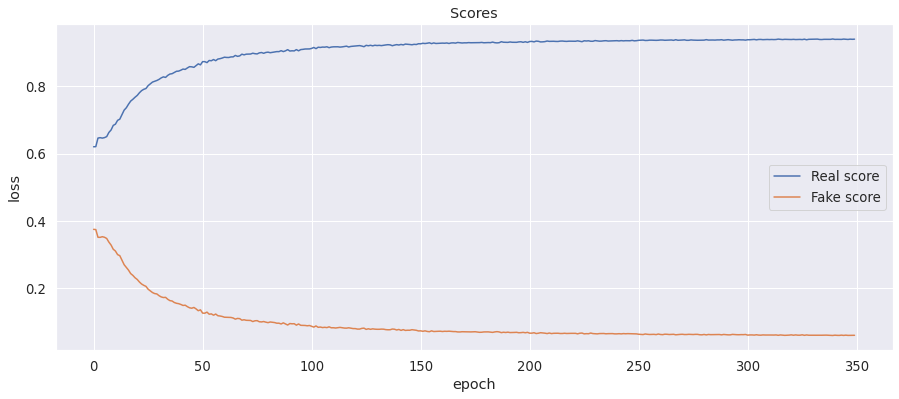

In [ ]:
plt.figure(figsize=(15, 6))
plt.plot(real_score_1, '-')
plt.plot(fake_score_1, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Real score', 'Fake score'])
plt.title('Scores');

В начале обучения лосс генератора характерно снижается, после чего начинает расти, а с дискриминатором ситуация обратная. При этом значения лосса для генератора и дискриминатора не изменяются сильно после 100 эпохи. В целом, такое поведение значений характерно

Скор на настоящих изображениях выше, чем на сгенерированных. Получается, что вероятность отнесения к классу "реальное изображение" у реальных изображений близко к 1, у сгенерированных- близко к 0. Это логично

## Генерация изображений

In [ ]:
n_images = 36

fixed_latent = torch.randn(n_images, latent_size, 1, 1, device=device)
fake_images = model["generator"](fixed_latent.to(device))

In [ ]:
def show_images(generated, n):
    fixed_generated = no_norm(generated)
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(fixed_generated[:n].cpu(), nrow=6).permute(1, 2, 0))

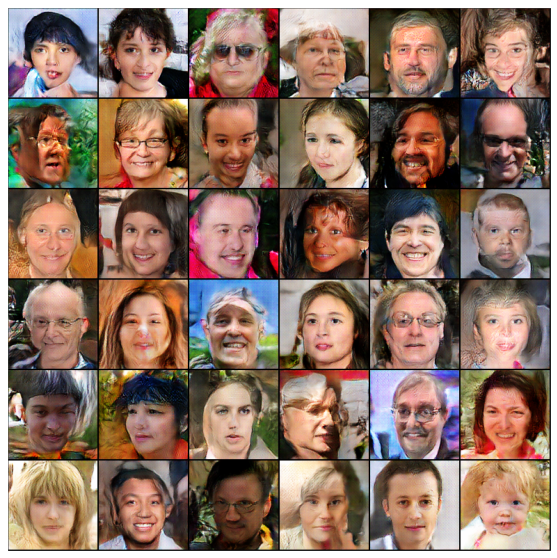

In [ ]:
show_images(fake_images, n_images)

Изображения получились неплохие, они все похожи на лица, имеют харакетрные черты (глаза, нос, рот, брови), но конечно есть еще куда улучшать

## Оценка качества изображений

Попробую оценить качество изображений не глазами, а с помощью подсчета accuracy. Для этого я построю leave-one-out оценку на KNN. В идеале accuracy должен быть равен 0.5, так как в этом случае классификатор не может отличить настоящие изображения от фейковых.  

Сохраняю и загружаю модель, если необходимо

In [ ]:
# torch.save(model['discriminator'].state_dict(), 'discr.pth')

In [ ]:
# torch.save(model['generator'].state_dict(), 'gener.pth')

In [ ]:
# model['generator'].load_state_dict(torch.load('gener.pth'))

<All keys matched successfully>

Возьму 1000 реальных изображений

In [ ]:
im_1000 = images_tensor[0:1000]

In [ ]:
model['generator'].to('cpu')

Sequential(
  (0): ConvTranspose2d(128, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
  (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): LeakyReLU(negative_slope=0.2, inplace=True)
  (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (5): LeakyReLU(negative_slope=0.2, inplace=True)
  (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (8): LeakyReLU(negative_slope=0.2, inplace=True)
  (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (11): LeakyReLU(negative_slope=0.2, inplace=True)
  (12): ConvTranspose2d(64, 32, kernel_size=(4, 4), stride=(2, 2

Сгенерирую 1000 изображений

In [ ]:
rand_tens = torch.randn(im_1000.shape[0], latent_size, 1, 1)

In [ ]:
fake_im = []
for i in range(0, 1000, 10):
    fake_images = model['generator'](rand_tens[i:i+10])
    fake_im.append(fake_images)

In [ ]:
fake_im_torch = torch.cat(fake_im)

In [ ]:
images = np.vstack((im_1000.detach().numpy(), fake_im_torch.detach().numpy()))

In [ ]:
images.shape

(2000, 3, 128, 128)

In [ ]:
# изображения нужно превратить в двумерные тензоры, чтобы модель смогла их обработать
images = images.reshape(2000, 3*128*128)

Реальным изображениям присвою метку 1, сгенерированным- 0

In [ ]:
fake_y = np.zeros(im_1000.shape[0])
real_y = np.ones(im_1000.shape[0])

In [ ]:
labels = np.hstack((real_y, fake_y))

In [ ]:
labels.shape

(2000,)

Теперь обучу KNeighborsClassifier с К=1

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
kneighbors = KNeighborsClassifier(n_neighbors = 1)

In [ ]:
from sklearn.model_selection import LeaveOneOut
from sklearn.model_selection import cross_val_score

In [ ]:
leave_one_out = LeaveOneOut()

In [ ]:
accuracy_all = cross_val_score(kneighbors, images, labels, scoring = 'accuracy', cv = leave_one_out)

In [ ]:
print('Accuracy =', accuracy_all.mean())

Accuracy = 0.5785


Значение accuracy получилось равным 0.58. Значит, ган генерит достаточно реалистичные изображения, дискриминатору сложно их отличать от настоящих изображений

## Визуализация распределений

Также интересно посмотреть на распределения реальных и сгенерированных изображений. Для этого буду пользоваться TSNE

In [ ]:
from sklearn.manifold import TSNE

Для настоящих изображений

In [ ]:
tsne_im = TSNE(n_components=2)

In [ ]:
im_1000_reshaped = im_1000.reshape(1000, 3*128*128)

In [ ]:
tsne_repr_real = tsne_im.fit_transform(im_1000_reshaped.cpu())

/home/thei/anaconda3/envs/pytorch/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/thei/anaconda3/envs/pytorch/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Для сгенерированных

In [ ]:
fake_im_torch_reshaped = fake_im_torch.reshape(1000, 3*128*128)

In [ ]:
tsne_fake = TSNE(n_components=2)

In [ ]:
tsne_repr_fake = tsne_fake.fit_transform(fake_im_torch_reshaped.detach().numpy())

/home/thei/anaconda3/envs/pytorch/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/thei/anaconda3/envs/pytorch/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


In [ ]:
tsne_data_real = pd.DataFrame(tsne_repr_real)
tsne_data_fake = pd.DataFrame(tsne_repr_fake)

Визуализируем получившиеся распределения

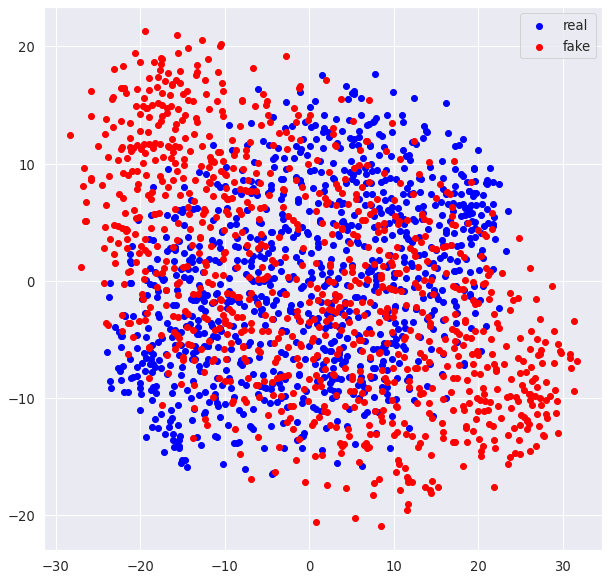

In [ ]:
plt.figure(figsize=(10, 10))
plt.scatter(x=tsne_data_real[0], y=tsne_data_real[1], c='blue', label='real')
plt.scatter(x=tsne_data_fake[0], y=tsne_data_fake[1], c='red', label='fake')
plt.legend()
plt.show()

В идеале должны были получиться одинаковые облака точек, так как хочется чтобы настоящие и сгенерированные изображения были очень похожи. Тут видно, что распределения близки, но есть участки, где они различны. Это совпадает с уже полученными результатом по accuracy